# UK ROAD ACCIDENT ANALYSIS PROJECT: 2020 DATA


# INTRODUCTION


- Road accident is a global challenge and Governments worldwide prioritize improving road safety measures,adopting new systems and rules to ensure thE safety of all road users (RoadPeace; 2024). The 2020 UK accidents data dataset, which includes a wide range of information like location, time, weather, road types, and other variables that may affect accident outcomes, was used for this investigation. The data is utilized for informed decision-making and proactive interventions, promoting safer road usage. This project aims to enhance road safety by providing data-driven suggestions for developing predictive. models Machine Learning and Artificial Intelligence techniques are being utilized with the aim predict and reduce road traffic accident fatalities and ensure road safety for all users in this project

## Importing the neccessary libraries

In [1]:
# Data manipulation
import pandas as pd
import numpy as np
import datetime as datetime

# Visualization
import seaborn as sns
import matplotlib.pyplot as plt

# Preprocessing
from sklearn.preprocessing import StandardScaler, OneHotEncoder, LabelEncoder
from sklearn.impute import SimpleImputer

# Clustering
from sklearn.cluster import KMeans

# Model selection and evaluation
from sklearn.model_selection import train_test_split, GridSearchCV, cross_val_score, RandomizedSearchCV
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix, ConfusionMatrixDisplay, roc_auc_score

# Machine learning algorithms
from sklearn.ensemble import RandomForestClassifier, IsolationForest
from sklearn.linear_model import LogisticRegression
from xgboost import XGBClassifier
from sklearn.tree import DecisionTreeClassifier
import xgboost as xgb

# Imbalanced data handling
from imblearn.over_sampling import SMOTE
from imblearn.under_sampling import RandomUnderSampler
from imblearn.pipeline import Pipeline as Pipeline_imb, make_pipeline as make_pipeline_imb

# Frequent pattern mining
from mlxtend.preprocessing import TransactionEncoder
from mlxtend.frequent_patterns import apriori, association_rules

# Visualization libraries
import folium
from folium.plugins import MarkerCluster


# Database interaction
import sqlite3
import sqlite3 as db

# Suppress warnings
import warnings
warnings.filterwarnings("ignore")






# ANALYSIS

## The function to execute SQL query on the SQLite database and returns the result as a pandas DataFrame.

In [2]:
def fetch_data_from_sql(query):
    # Connect to the SQLite database assuming db_conn is a valid connection
    try:
        with sqlite3.connect("accident_data_v1.0.0_2023.db") as db_conn:
            # Create a cursor to execute the query
            cursor = db_conn.cursor()
            
            # Execute the provided SQL query
            cursor.execute(query)
            
            # Retrieve all records resulting from the query
            query_result = cursor.fetchall()
            
            # Extract column names from the query result metadata
            columns = [col[0] for col in cursor.description]
            
            # Convert the query result to a pandas DataFrame
            pandas_df = pd.DataFrame(query_result, columns=columns)
            
            # Return the pandas DataFrame containing the query result
            return pandas_df
    except Exception as ex:
        # Print any encountered exceptions
        print(ex)


## DATA EXPLORATION

- The accidents data will be explored with specific focus on the year 2020: This exploration exercise will be implemented to determine the tables available in the database, the size and details of each table shall also be explored to enhanced an overview and vital information of the tables;

## Exploration of the accident table

In [3]:

accidents_df = fetch_data_from_sql("""                       
        select * from accident where accident_year = 2020
        """)


In [4]:
accidents_df.head()

,accident_index,accident_year,accident_reference,location_easting_osgr,location_northing_osgr,longitude,latitude,police_force,accident_severity,number_of_vehicles,...,pedestrian_crossing_physical_facilities,light_conditions,weather_conditions,road_surface_conditions,special_conditions_at_site,carriageway_hazards,urban_or_rural_area,did_police_officer_attend_scene_of_accident,trunk_road_flag,lsoa_of_accident_location
0,2020010219808,2020,010219808,521389.0,175144.0,-0.254001,51.462262,1,3,1,...,9,1,9,9,0,0,1,3,2,E01004576
1,2020010220496,2020,010220496,529337.0,176237.0,-0.139253,51.470327,1,3,1,...,4,1,1,1,0,0,1,1,2,E01003034
2,2020010228005,2020,010228005,526432.0,182761.0,-0.178719,51.529614,1,3,1,...,0,4,1,2,0,0,1,1,2,E01004726
3,2020010228006,2020,010228006,538676.0,184371.0,-0.001683,51.541210,1,2,1,...,4,4,1,1,0,0,1,1,2,E01003617
4,2020010228011,2020,010228011,529324.0,181286.0,-0.137592,51.515704,1,3,1,...,0,4,1,1,0,0,1,1,2,E01004763


In [5]:
accidents_df.tail()

,accident_index,accident_year,accident_reference,location_easting_osgr,location_northing_osgr,longitude,latitude,police_force,accident_severity,number_of_vehicles,...,pedestrian_crossing_physical_facilities,light_conditions,weather_conditions,road_surface_conditions,special_conditions_at_site,carriageway_hazards,urban_or_rural_area,did_police_officer_attend_scene_of_accident,trunk_road_flag,lsoa_of_accident_location
91194,2020991027064,2020,991027064,343034.0,731654.0,-2.926320,56.473539,99,2,2,...,0,1,1,1,0,0,1,1,-1,-1
91195,2020991029573,2020,991029573,257963.0,658891.0,-4.267565,55.802353,99,3,1,...,0,1,1,1,0,0,1,2,-1,-1
91196,2020991030297,2020,991030297,383664.0,810646.0,-2.271903,57.186317,99,2,2,...,0,1,1,1,0,0,2,1,-1,-1
91197,2020991030900,2020,991030900,277161.0,674852.0,-3.968753,55.950940,99,3,2,...,0,1,1,1,0,0,1,2,-1,-1
91198,2020991032575,2020,991032575,240402.0,681950.0,-4.561040,56.003843,99,3,1,...,0,1,1,1,0,2,1,1,-1,-1


In [6]:
accidents_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 91199 entries, 0 to 91198
Data columns (total 36 columns):
 #   Column                                       Non-Null Count  Dtype  
---  ------                                       --------------  -----  
 0   accident_index                               91199 non-null  object 
 1   accident_year                                91199 non-null  int64  
 2   accident_reference                           91199 non-null  object 
 3   location_easting_osgr                        91185 non-null  float64
 4   location_northing_osgr                       91185 non-null  float64
 5   longitude                                    91185 non-null  float64
 6   latitude                                     91185 non-null  float64
 7   police_force                                 91199 non-null  int64  
 8   accident_severity                            91199 non-null  int64  
 9   number_of_vehicles                           91199 non-null  int64  
 10

In [7]:
accidents_df.isnull().sum()

accident_index                                  0
accident_year                                   0
accident_reference                              0
location_easting_osgr                          14
location_northing_osgr                         14
longitude                                      14
latitude                                       14
police_force                                    0
accident_severity                               0
number_of_vehicles                              0
number_of_casualties                            0
date                                            0
day_of_week                                     0
time                                            0
local_authority_district                        0
local_authority_ons_district                    0
local_authority_highway                         0
first_road_class                                0
first_road_number                               0
road_type                                       0


In [8]:
accidents_df.describe()

,accident_year,location_easting_osgr,location_northing_osgr,longitude,latitude,police_force,accident_severity,number_of_vehicles,number_of_casualties,day_of_week,...,pedestrian_crossing_human_control,pedestrian_crossing_physical_facilities,light_conditions,weather_conditions,road_surface_conditions,special_conditions_at_site,carriageway_hazards,urban_or_rural_area,did_police_officer_attend_scene_of_accident,trunk_road_flag
count,91199.0,91185.000000,9.118500e+04,91185.000000,91185.000000,91199.000000,91199.000000,91199.000000,91199.000000,91199.000000,...,91199.000000,91199.000000,91199.000000,91199.000000,91199.000000,91199.000000,91199.000000,91199.000000,91199.000000,91199.000000
mean,2020.0,456487.876416,2.737645e+05,-1.189258,52.351073,27.488043,2.768232,1.835272,1.267382,4.121558,...,0.352975,1.185309,2.065308,1.702047,1.391583,0.244740,0.180594,1.323205,1.415268,1.721521
std,0.0,93512.711807,1.473516e+05,1.367786,1.327573,24.548964,0.456682,0.677272,0.681473,1.932200,...,1.698116,2.445924,1.747690,1.845786,0.925690,1.318554,1.149791,0.468031,0.665469,0.801491
min,2020.0,65947.000000,1.271500e+04,-7.497375,49.970479,1.000000,1.000000,1.000000,1.000000,1.000000,...,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,1.000000,-1.000000,-1.000000
25%,2020.0,392890.000000,1.745690e+05,-2.107789,51.457237,4.000000,3.000000,1.000000,1.000000,2.000000,...,0.000000,0.000000,1.000000,1.000000,1.000000,0.000000,0.000000,1.000000,1.000000,2.000000
50%,2020.0,465545.000000,2.085990e+05,-1.046912,51.763385,22.000000,3.000000,2.000000,1.000000,4.000000,...,0.000000,0.000000,1.000000,1.000000,1.000000,0.000000,0.000000,1.000000,1.000000,2.000000
75%,2020.0,530168.000000,3.783660e+05,-0.125238,53.297386,45.000000,3.000000,2.000000,1.000000,6.000000,...,0.000000,0.000000,4.000000,1.000000,2.000000,0.000000,0.000000,2.000000,2.000000,2.000000
max,2020.0,655138.000000,1.184351e+06,1.756257,60.541144,99.000000,3.000000,13.000000,41.000000,7.000000,...,9.000000,9.000000,7.000000,9.000000,9.000000,9.000000,9.000000,3.000000,3.000000,2.000000


## Exploration of the vehicle table

In [9]:
vehicle_df = fetch_data_from_sql("""                       
        SELECT * FROM vehicle WHERE accident_year = 2020
        """)

In [10]:
vehicle_df.head()

,vehicle_index,accident_index,accident_year,accident_reference,vehicle_reference,vehicle_type,towing_and_articulation,vehicle_manoeuvre,vehicle_direction_from,vehicle_direction_to,...,journey_purpose_of_driver,sex_of_driver,age_of_driver,age_band_of_driver,engine_capacity_cc,propulsion_code,age_of_vehicle,generic_make_model,driver_imd_decile,driver_home_area_type
0,681716,2020010219808,2020,010219808,1,9,9,5,1,5,...,6,2,32,6,1968,2,6,AUDI Q5,4,1
1,681717,2020010220496,2020,010220496,1,9,0,4,2,6,...,2,1,45,7,1395,1,2,AUDI A1,7,1
2,681718,2020010228005,2020,010228005,1,9,0,18,-1,-1,...,6,3,-1,-1,-1,-1,-1,-1,-1,-1
3,681719,2020010228006,2020,010228006,1,8,0,18,1,5,...,1,1,44,7,1798,8,8,TOYOTA PRIUS,2,1
4,681720,2020010228011,2020,010228011,1,9,0,18,3,7,...,6,1,20,4,2993,2,4,BMW 4 SERIES,-1,-1


In [11]:
vehicle_df.tail()

,vehicle_index,accident_index,accident_year,accident_reference,vehicle_reference,vehicle_type,towing_and_articulation,vehicle_manoeuvre,vehicle_direction_from,vehicle_direction_to,...,journey_purpose_of_driver,sex_of_driver,age_of_driver,age_band_of_driver,engine_capacity_cc,propulsion_code,age_of_vehicle,generic_make_model,driver_imd_decile,driver_home_area_type
167370,849086,2020991030297,2020,991030297,1,9,0,7,8,2,...,1,1,57,9,1968,2,2,AUDI A5,7,1
167371,849087,2020991030297,2020,991030297,2,5,0,16,6,2,...,5,1,38,7,1301,1,2,KTM 1290 SUPERDUKE,9,2
167372,849088,2020991030900,2020,991030900,1,9,0,7,8,2,...,6,2,68,10,1995,2,1,BMW X3,5,1
167373,849089,2020991030900,2020,991030900,2,1,0,18,6,2,...,6,1,76,11,-1,-1,-1,-1,9,1
167374,849090,2020991032575,2020,991032575,1,9,0,1,8,4,...,6,1,39,7,999,1,2,FORD FOCUS,7,1


In [12]:
vehicle_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 167375 entries, 0 to 167374
Data columns (total 28 columns):
 #   Column                            Non-Null Count   Dtype 
---  ------                            --------------   ----- 
 0   vehicle_index                     167375 non-null  int64 
 1   accident_index                    167375 non-null  object
 2   accident_year                     167375 non-null  int64 
 3   accident_reference                167375 non-null  object
 4   vehicle_reference                 167375 non-null  int64 
 5   vehicle_type                      167375 non-null  int64 
 6   towing_and_articulation           167375 non-null  int64 
 7   vehicle_manoeuvre                 167375 non-null  int64 
 8   vehicle_direction_from            167375 non-null  int64 
 9   vehicle_direction_to              167375 non-null  int64 
 10  vehicle_location_restricted_lane  167375 non-null  int64 
 11  junction_location                 167375 non-null  int64 
 12  sk

In [13]:
vehicle_df.isnull().sum()

vehicle_index                       0
accident_index                      0
accident_year                       0
accident_reference                  0
vehicle_reference                   0
vehicle_type                        0
towing_and_articulation             0
vehicle_manoeuvre                   0
vehicle_direction_from              0
vehicle_direction_to                0
vehicle_location_restricted_lane    0
junction_location                   0
skidding_and_overturning            0
hit_object_in_carriageway           0
vehicle_leaving_carriageway         0
hit_object_off_carriageway          0
first_point_of_impact               0
vehicle_left_hand_drive             0
journey_purpose_of_driver           0
sex_of_driver                       0
age_of_driver                       0
age_band_of_driver                  0
engine_capacity_cc                  0
propulsion_code                     0
age_of_vehicle                      0
generic_make_model                  0
driver_imd_d

In [14]:
vehicle_df.describe()

,vehicle_index,accident_year,vehicle_reference,vehicle_type,towing_and_articulation,vehicle_manoeuvre,vehicle_direction_from,vehicle_direction_to,vehicle_location_restricted_lane,junction_location,...,vehicle_left_hand_drive,journey_purpose_of_driver,sex_of_driver,age_of_driver,age_band_of_driver,engine_capacity_cc,propulsion_code,age_of_vehicle,driver_imd_decile,driver_home_area_type
count,167375.00000,167375.0,167375.000000,167375.000000,167375.000000,167375.000000,167375.000000,167375.000000,167375.000000,167375.000000,...,167375.000000,167375.000000,167375.000000,167375.000000,167375.000000,167375.000000,167375.000000,167375.000000,167375.000000,167375.000000
mean,765403.00000,2020.0,1.549198,10.051310,0.221664,19.538987,4.406387,4.455068,7.537870,2.598303,...,1.448962,4.717066,1.480347,34.509658,5.780272,1332.294554,0.970121,5.820600,3.904143,0.871253
std,48317.14499,0.0,2.538196,11.692412,1.344230,23.661274,2.718826,2.696937,25.898393,3.285627,...,1.854349,1.914971,0.693344,20.797517,3.185713,1543.509942,1.585310,6.331929,3.445329,1.072733
min,681716.00000,2020.0,1.000000,1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,...,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000
25%,723559.50000,2020.0,1.000000,9.000000,0.000000,9.000000,2.000000,2.000000,0.000000,0.000000,...,1.000000,4.000000,1.000000,22.000000,5.000000,-1.000000,-1.000000,-1.000000,1.000000,1.000000
50%,765403.00000,2020.0,1.000000,9.000000,0.000000,18.000000,5.000000,5.000000,0.000000,1.000000,...,1.000000,6.000000,1.000000,34.000000,6.000000,1368.000000,1.000000,5.000000,4.000000,1.000000
75%,807246.50000,2020.0,2.000000,9.000000,0.000000,18.000000,7.000000,7.000000,0.000000,6.000000,...,1.000000,6.000000,2.000000,49.000000,8.000000,1910.000000,2.000000,11.000000,7.000000,1.000000
max,849090.00000,2020.0,999.000000,98.000000,9.000000,99.000000,9.000000,9.000000,99.000000,9.000000,...,9.000000,6.000000,3.000000,100.000000,11.000000,17696.000000,12.000000,96.000000,10.000000,3.000000


## Exploration of the casualty table

In [15]:
casualty_df = fetch_data_from_sql("""                       
        SELECT * FROM casualty WHERE accident_year = 2020
        """)

In [16]:
casualty_df.head()

,casualty_index,accident_index,accident_year,accident_reference,vehicle_reference,casualty_reference,casualty_class,sex_of_casualty,age_of_casualty,age_band_of_casualty,casualty_severity,pedestrian_location,pedestrian_movement,car_passenger,bus_or_coach_passenger,pedestrian_road_maintenance_worker,casualty_type,casualty_home_area_type,casualty_imd_decile
0,484748,2020010219808,2020,010219808,1,1,3,1,31,6,3,9,5,0,0,0,0,1,4
1,484749,2020010220496,2020,010220496,1,1,3,2,2,1,3,1,1,0,0,0,0,1,2
2,484750,2020010220496,2020,010220496,1,2,3,2,4,1,3,1,1,0,0,0,0,1,2
3,484751,2020010228005,2020,010228005,1,1,3,1,23,5,3,5,9,0,0,0,0,1,3
4,484752,2020010228006,2020,010228006,1,1,3,1,47,8,2,4,1,0,0,0,0,1,3


In [17]:
casualty_df.tail()

,casualty_index,accident_index,accident_year,accident_reference,vehicle_reference,casualty_reference,casualty_class,sex_of_casualty,age_of_casualty,age_band_of_casualty,casualty_severity,pedestrian_location,pedestrian_movement,car_passenger,bus_or_coach_passenger,pedestrian_road_maintenance_worker,casualty_type,casualty_home_area_type,casualty_imd_decile
115579,600327,2020991027064,2020,991027064,2,1,1,1,11,3,2,0,0,0,0,0,1,1,2
115580,600328,2020991029573,2020,991029573,1,1,3,2,63,9,3,10,1,0,0,0,0,1,10
115581,600329,2020991030297,2020,991030297,2,1,1,1,38,7,2,0,0,0,0,0,5,2,9
115582,600330,2020991030900,2020,991030900,2,1,1,1,76,11,3,0,0,0,0,0,1,1,9
115583,600331,2020991032575,2020,991032575,1,1,3,1,48,8,3,9,9,0,0,0,0,1,1


In [18]:
casualty_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 115584 entries, 0 to 115583
Data columns (total 19 columns):
 #   Column                              Non-Null Count   Dtype 
---  ------                              --------------   ----- 
 0   casualty_index                      115584 non-null  int64 
 1   accident_index                      115584 non-null  object
 2   accident_year                       115584 non-null  int64 
 3   accident_reference                  115584 non-null  object
 4   vehicle_reference                   115584 non-null  int64 
 5   casualty_reference                  115584 non-null  int64 
 6   casualty_class                      115584 non-null  int64 
 7   sex_of_casualty                     115584 non-null  int64 
 8   age_of_casualty                     115584 non-null  int64 
 9   age_band_of_casualty                115584 non-null  int64 
 10  casualty_severity                   115584 non-null  int64 
 11  pedestrian_location                 115

In [19]:
casualty_df.isnull().sum()

casualty_index                        0
accident_index                        0
accident_year                         0
accident_reference                    0
vehicle_reference                     0
casualty_reference                    0
casualty_class                        0
sex_of_casualty                       0
age_of_casualty                       0
age_band_of_casualty                  0
casualty_severity                     0
pedestrian_location                   0
pedestrian_movement                   0
car_passenger                         0
bus_or_coach_passenger                0
pedestrian_road_maintenance_worker    0
casualty_type                         0
casualty_home_area_type               0
casualty_imd_decile                   0
dtype: int64

In [20]:
casualty_df.describe()

,casualty_index,accident_year,vehicle_reference,casualty_reference,casualty_class,sex_of_casualty,age_of_casualty,age_band_of_casualty,casualty_severity,pedestrian_location,pedestrian_movement,car_passenger,bus_or_coach_passenger,pedestrian_road_maintenance_worker,casualty_type,casualty_home_area_type,casualty_imd_decile
count,115584.000000,115584.0,115584.000000,115584.000000,115584.000000,115584.000000,115584.000000,115584.000000,115584.000000,115584.000000,115584.000000,115584.000000,115584.000000,115584.000000,115584.000000,115584.000000,115584.00000
mean,542539.500000,2020.0,1.460557,1.347790,1.441272,1.354859,36.489748,6.292610,2.800820,0.696861,0.561592,0.223093,0.038950,0.012709,7.388367,1.078177,4.36114
std,33366.371094,0.0,2.991765,4.036721,0.708365,0.520195,18.985022,2.392856,0.429851,2.059930,1.879680,0.603991,0.381528,0.164516,9.914714,0.904791,3.17141
min,484748.000000,2020.0,1.000000,1.000000,1.000000,-1.000000,-1.000000,-1.000000,1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,0.000000,-1.000000,-1.00000
25%,513643.750000,2020.0,1.000000,1.000000,1.000000,1.000000,23.000000,5.000000,3.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,2.00000
50%,542539.500000,2020.0,1.000000,1.000000,1.000000,1.000000,33.000000,6.000000,3.000000,0.000000,0.000000,0.000000,0.000000,0.000000,9.000000,1.000000,4.00000
75%,571435.250000,2020.0,2.000000,1.000000,2.000000,2.000000,50.000000,8.000000,3.000000,0.000000,0.000000,0.000000,0.000000,0.000000,9.000000,1.000000,7.00000
max,600331.000000,2020.0,999.000000,992.000000,3.000000,9.000000,99.000000,11.000000,3.000000,10.000000,9.000000,9.000000,9.000000,2.000000,98.000000,3.000000,10.00000


## Exploration of the lsoa table

In [21]:
lsoa_df = fetch_data_from_sql("SELECT * FROM lsoa")


In [22]:
lsoa_df.head()

,objectid,lsoa01cd,lsoa01nm,lsoa01nmw,shape__area,shape__length,globalid
0,1,E01000001,City of London 001A,City of London 001A,1.298652e+05,2635.772001,68cc6127-1008-4fbe-a16c-78fb089a7c43
1,2,E01000002,City of London 001B,City of London 001B,2.284189e+05,2707.986202,937edbc3-c1bf-4d35-b274-b0a1480a7c09
2,3,E01000003,City of London 001C,City of London 001C,5.905477e+04,1224.774479,2686dcaf-10b9-4736-92af-4788d4feaa69
3,4,E01000004,City of London 001D,City of London 001D,2.544551e+06,10718.466240,3c493140-0b3f-4b9a-b358-22011dc5fb89
4,5,E01000005,City of London 001E,City of London 001E,1.895782e+05,2275.809358,b569093d-788d-41be-816c-d6d7658b2311


In [23]:
lsoa_df.tail()

,objectid,lsoa01cd,lsoa01nm,lsoa01nmw,shape__area,shape__length,globalid
34373,34374,W01001892,Cardiff 020D,Caerdydd 020D,2.699088e+05,2537.220060,1a25aa1e-5db5-4d32-8355-473409dbd69f
34374,34375,W01001893,Cardiff 010B,Caerdydd 010B,4.288488e+06,9807.284401,b6af5e24-eb2a-404a-98a6-a282037b3e10
34375,34376,W01001894,Cardiff 010C,Caerdydd 010C,3.337511e+05,2929.546177,72d16f53-115d-4926-936d-2f1b1d659d46
34376,34377,W01001895,Cardiff 010D,Caerdydd 010D,1.360174e+06,8141.281226,8e105eb9-f68e-4cdb-bca6-b49f6592cb71
34377,34378,W01001896,Cardiff 020E,Caerdydd 020E,3.124395e+05,3823.366435,c885f171-a56e-4e2b-8d09-1c7d6efedd67


In [24]:
lsoa_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 34378 entries, 0 to 34377
Data columns (total 7 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   objectid       34378 non-null  int64  
 1   lsoa01cd       34378 non-null  object 
 2   lsoa01nm       34378 non-null  object 
 3   lsoa01nmw      34378 non-null  object 
 4   shape__area    34378 non-null  float64
 5   shape__length  34378 non-null  float64
 6   globalid       34378 non-null  object 
dtypes: float64(2), int64(1), object(4)
memory usage: 1.8+ MB


In [25]:
lsoa_df.isnull().sum()

objectid         0
lsoa01cd         0
lsoa01nm         0
lsoa01nmw        0
shape__area      0
shape__length    0
globalid         0
dtype: int64

In [26]:
lsoa_df.describe()

,objectid,shape__area,shape__length
count,34378.000000,3.437800e+04,34378.000000
mean,17189.500000,4.484756e+06,8672.586392
std,9924.218114,1.497949e+07,11186.682402
min,1.000000,1.836184e+04,794.752314
25%,8595.250000,2.804555e+05,3329.866718
50%,17189.500000,4.843540e+05,4605.231856
75%,25783.750000,1.509910e+06,7947.973477
max,34378.000000,6.837464e+08,176560.397355


##  Data  Visualization 

- The expression below is the breakdown of the accident_severity column in the accidents table: This is broken down into three categories which are 1,2,3 (Fatal,Serious and Slight)

In [27]:

# Calculate the count of each unique value
unique_values = accidents_df['accident_severity'].value_counts()

# Get the unique values and their counts
unique_values_list = list(zip(unique_values.index, unique_values.values))

# Display the unique values with their counts
print(unique_values_list)


[(3, 71453), (2, 18355), (1, 1391)]


- Accident severity categorized as lsited below:
- 1 is Fatal
- 3 is Seriously
- 2 is Slightly


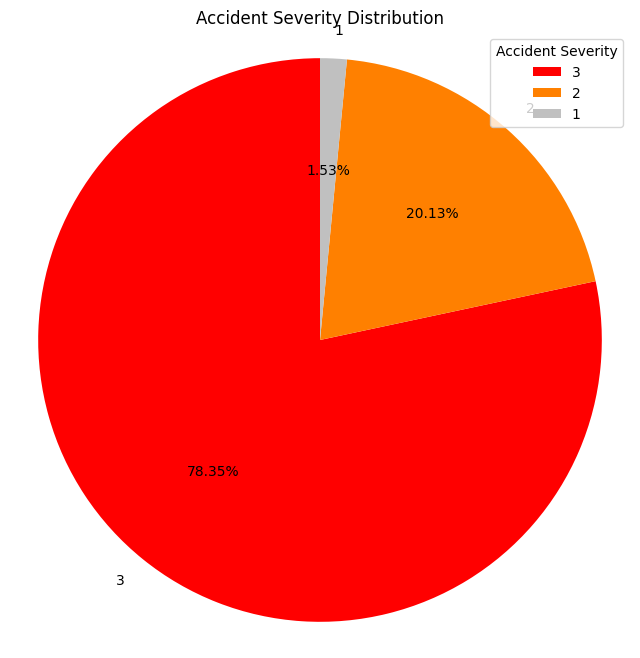

In [28]:

# Calculate the distribution of accident severity
severity_counts = accidents_df['accident_severity'].value_counts()

# Create a pie chart
plt.figure(figsize=(8, 8))
plt.pie(severity_counts, labels=severity_counts.index, autopct='%1.2f%%', startangle=90, colors=['#ff0000', '#ff8000', '#c0c0c0'])
plt.title('Accident Severity Distribution')
plt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.

# Add a legend with severity names
plt.legend(title="Accident Severity", labels=severity_counts.index, loc="best")

# Display the pie chart
plt.show()


- Below is a visual expression of the tables in the database:


- The four tables are:
- accident
- casualty
- vehicle
- lsoa

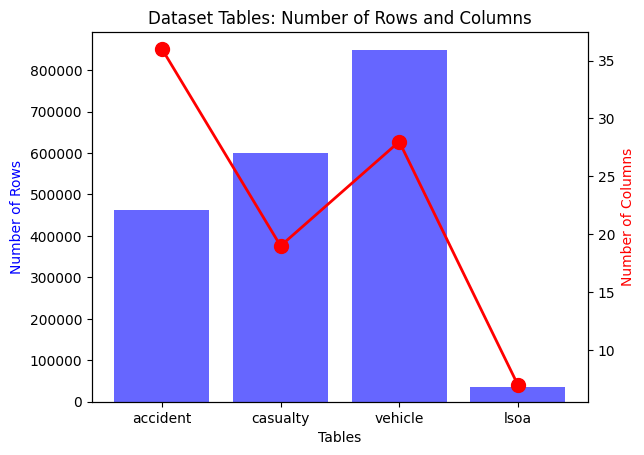

In [29]:
def fetch_table_info(db_name):
    with sqlite3.connect(db_name) as db_conn:
        cursor = db_conn.cursor()
        cursor.execute("SELECT name FROM sqlite_master WHERE type='table';")
        return {table[0]: cursor.execute(f"SELECT COUNT(*), (SELECT COUNT(*) FROM pragma_table_info('{table[0]}')) FROM {table[0]}").fetchone()
                for table in cursor.fetchall()}

# Fetch the table information
table_info = fetch_table_info("accident_data_v1.0.0_2023.db")
table_names, info = zip(*table_info.items())
num_rows, num_columns = zip(*info)

# Plot
fig, ax1 = plt.subplots()
ax1.bar(table_names, num_rows, color='blue', alpha=0.6)
ax1.set_xlabel('Tables')
ax1.set_ylabel('Number of Rows', color='blue')

ax2 = ax1.twinx()
ax2.plot(table_names, num_columns, color='red', marker='o', linestyle='-', linewidth=2, markersize=10)
ax2.set_ylabel('Number of Columns', color='red')

plt.title('Dataset Tables: Number of Rows and Columns')
plt.show()


- The expression below retrieves the number of rows for each table, and visualizes this distribution with a pie chart.

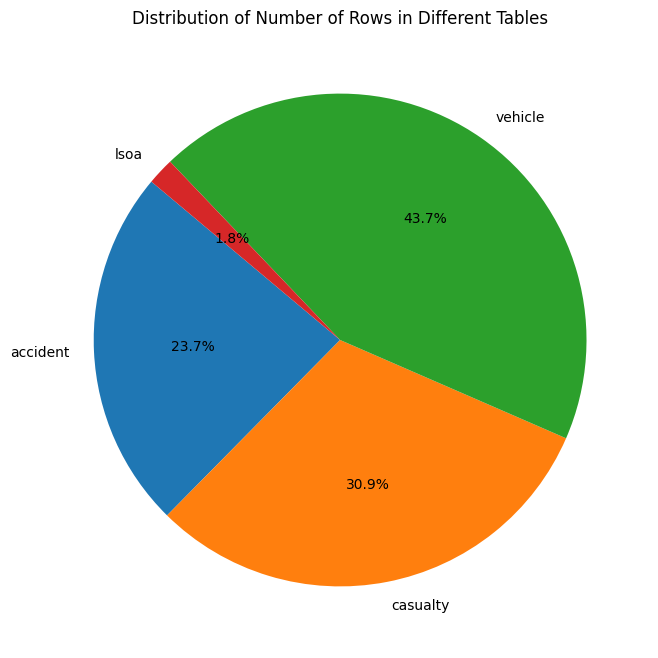

In [30]:

def fetch_table_info(db_name):
    with sqlite3.connect(db_name) as db_conn:
        cursor = db_conn.cursor()
        cursor.execute("SELECT name FROM sqlite_master WHERE type='table';")
        tables = [table[0] for table in cursor.fetchall()]
        return {table: cursor.execute(f"SELECT COUNT(*) FROM {table}").fetchone()[0] for table in tables}

# Fetch the table information
table_info = fetch_table_info("accident_data_v1.0.0_2023.db")

# Extract data for visualization
table_names, num_rows = zip(*table_info.items())

# Create a pie chart for the number of rows
plt.figure(figsize=(8, 8))
plt.pie(num_rows, labels=table_names, autopct='%1.1f%%', startangle=140)
plt.title('Distribution of Number of Rows in Different Tables')
plt.show()


- The function plot_age_pyramid_by_gender creates a horizontal bar plot (age pyramid) to visualize the age distribution of male and female drivers based on the specified age and gender columns in the DataFrame

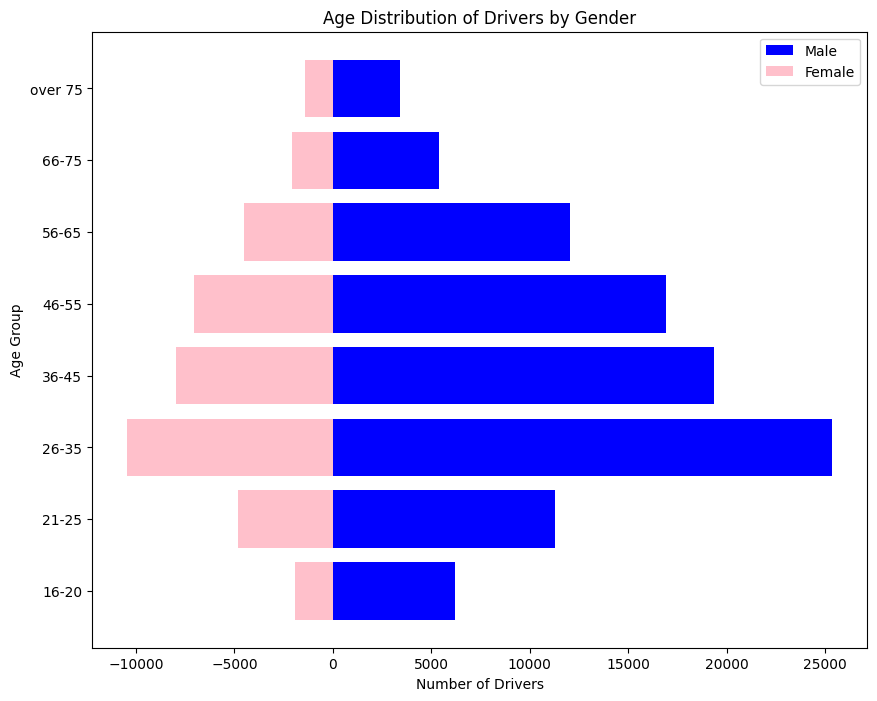

In [31]:


def plot_age_pyramid_by_gender(df, age_col, sex_col):
    # Define age bins based on the data
    bins = [15, 20, 25, 35, 45, 55, 65, 75, float('inf')]
    labels = ['16-20', '21-25', '26-35', '36-45', '46-55', '56-65', '66-75', 'over 75']

    # Filter out rows with missing values in age column
    df = df.dropna(subset=[age_col])

    # Filter data for male and female drivers
    male_data = df[df[sex_col] == 1]
    female_data = df[df[sex_col] == 2]

    # Count the number of drivers in each age bin
    male_counts = pd.cut(male_data[age_col], bins=bins, labels=labels, right=False).value_counts().sort_index()
    female_counts = pd.cut(female_data[age_col], bins=bins, labels=labels, right=False).value_counts().sort_index()

    # Create a pyramid plot
    fig, ax = plt.subplots(figsize=(10, 8))

    # Plot bars for male and female drivers
    ax.barh(labels, male_counts, color='blue', label='Male')
    ax.barh(labels, -female_counts, color='pink', label='Female')

    # Set labels and title
    ax.set_xlabel('Number of Drivers')
    ax.set_ylabel('Age Group')
    ax.set_title('Age Distribution of Drivers by Gender')

    # Show legend
    ax.legend()

    # Show plot
    plt.show()

# Example usage
plot_age_pyramid_by_gender(vehicle_df, 'age_of_driver', 'sex_of_driver')


- This expression filters accident data by driver gender, bins driver ages into specified ranges, and creates a horizontal bar plot to compare the number of accidents involving male and female drivers by age group.

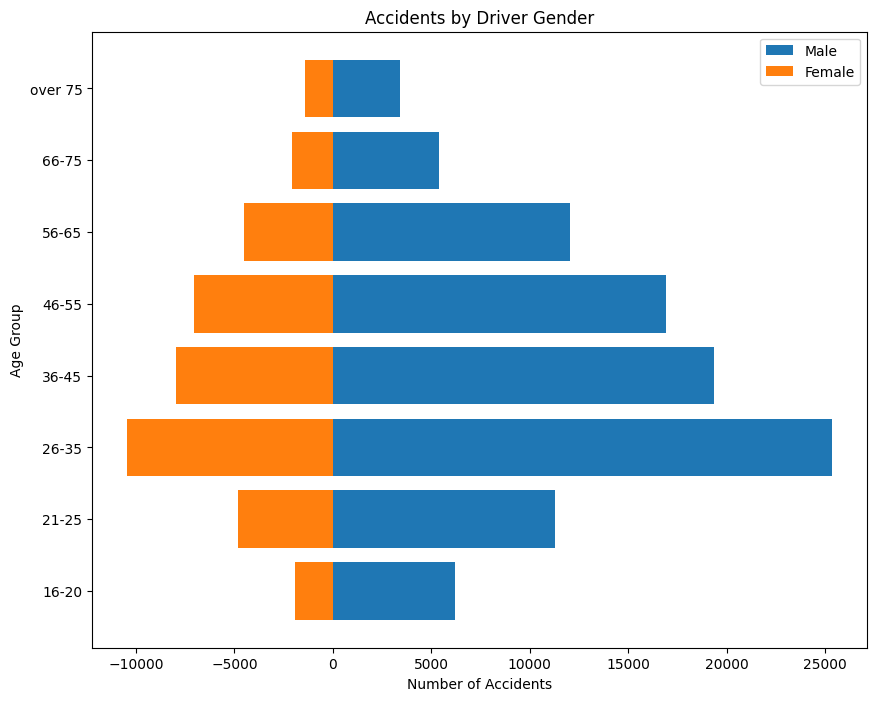

In [32]:
# Define age bins based on the data
bins = [15, 20, 25, 35, 45, 55, 65, 75, float('inf')]
labels = ['16-20', '21-25', '26-35', '36-45', '46-55', '56-65', '66-75', 'over 75']

# Filter data for male casualties
male_data = vehicle_df[vehicle_df['sex_of_driver'] == 1]
male_counts = pd.cut(male_data['age_of_driver'], bins=bins, labels=labels, right=False).value_counts().sort_index()

# Filter data for female casualties
female_data = vehicle_df[vehicle_df['sex_of_driver'] == 2]
female_counts = pd.cut(female_data['age_of_driver'], bins=bins, labels=labels, right=False).value_counts().sort_index()

# Create a horizontal bar plot
fig, ax = plt.subplots(figsize=(10, 8))

ax.barh(labels, male_counts, label='Male')
ax.barh(labels, -female_counts, label='Female')  # Negate female counts

ax.set_xlabel('Number of Accidents')
ax.set_ylabel('Age Group')
ax.set_title('Accidents by Driver Gender')
ax.legend()

plt.show()

# Question 1. Significant hours of the day and days of the week for accidents occurrence

- The function below merges date and time into a datetime column, maps day indices to weekday names, and extracts the hour from the datetime.

In [33]:
weekly_days = ["Sunday", "Monday", "Tuesday", "Wednesday", "Thursday", "Friday", "Saturday"]

In [34]:
def converter(df):
    df['DateTime'] = pd.to_datetime(df['date'] + ' ' + df['time'], format='%d/%m/%Y %H:%M')
    
    df['weekday'] = df['day_of_week'].map(lambda x: weekly_days[x-1])
    
    df['Hourly'] = df['DateTime'].dt.hour
    return df

In [35]:
hourly_df = converter(accidents_df)

In [36]:
accidents_by_hour = hourly_df['Hourly'].value_counts().sort_index()  #Hours of the day

In [37]:
accidents_by_daily =hourly_df['weekday'].value_counts().reindex(weekly_days) #Days of the week

In [38]:
grouped_DOF_week = hourly_df.groupby(['weekday', 'Hourly']).size().reset_index(name='Count')

In [39]:
grouped_DOF_week.nlargest(30,'Count')

,weekday,Hourly,Count
113,Thursday,17,1288
17,Friday,17,1273
15,Friday,15,1229
41,Monday,17,1214
137,Tuesday,17,1213
112,Thursday,16,1209
161,Wednesday,17,1197
16,Friday,16,1181
111,Thursday,15,1178
160,Wednesday,16,1160


## Number of accidents by hours of the day

In [40]:
accidents_by_hour

0     1188
1      915
2      658
3      566
4      508
5      855
6     1830
7     3736
8     5267
9     3917
10    4173
11    4812
12    5395
13    5741
14    6245
15    7361
16    7381
17    7813
18    6618
19    5048
20    3715
21    3106
22    2555
23    1796
Name: Hourly, dtype: int64

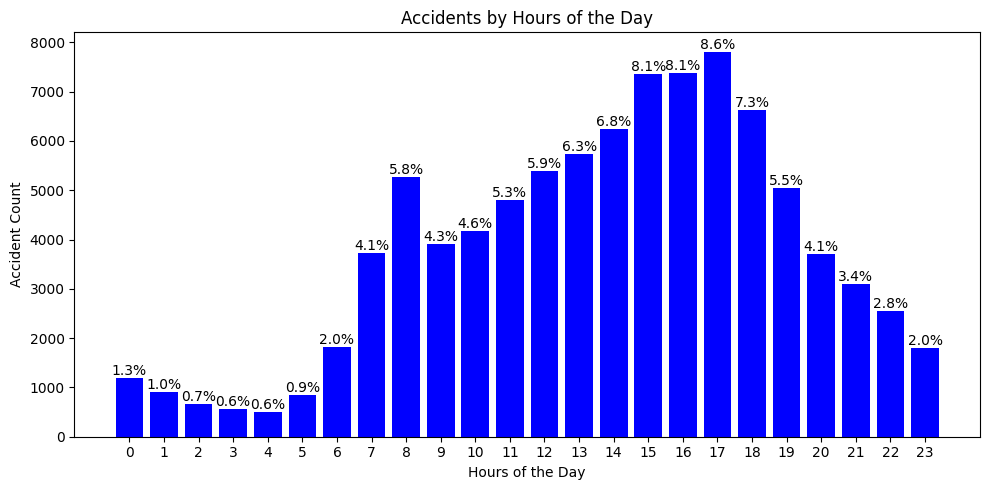

In [41]:

plt.figure(figsize=(10, 5))
bars = plt.bar(accidents_by_hour.index, accidents_by_hour.values, color='blue')  # Blue color
total_accidents = accidents_by_hour.sum()

for bar in bars:
    height = bar.get_height()
    percentage = (height / total_accidents) * 100
    plt.text(bar.get_x() + bar.get_width() / 2, height, f'{percentage:.1f}%', 
             ha='center', va='bottom', fontsize=10)

plt.xlabel('Hours of the Day')
plt.ylabel('Accident Count')
plt.title('Accidents by Hours of the Day')
plt.xticks(range(24))
plt.tight_layout()
plt.show()


## Number of accidents by days of the week

In [42]:
accidents_by_daily

Sunday       10315
Monday       12772
Tuesday      13267
Wednesday    13564
Thursday     14056
Friday       14889
Saturday     12336
Name: weekday, dtype: int64

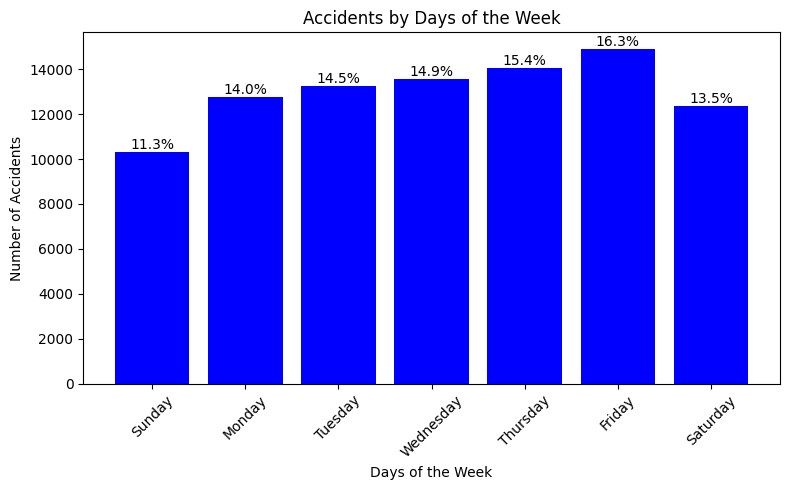

In [43]:

plt.figure(figsize=(8, 5))
bars = plt.bar(weekly_days, accidents_by_daily, color='blue')  
plt.xlabel('Days of the Week')
plt.ylabel('Number of Accidents')
plt.title('Accidents by Days of the Week')
plt.xticks(rotation=45) 

# Add percentage labels on top of each bar
total_accidents = sum(accidents_by_daily)
for bar in bars:
    height = bar.get_height()
    percentage = (height / total_accidents) * 100
    plt.text(bar.get_x() + bar.get_width() / 2, height, f'{percentage:.1f}%', 
             ha='center', va='bottom')

plt.tight_layout()  
plt.show()


# Question 2:For motorbikes, are there significant hours of the day, and days of the week, on which accidents occur?

## Motorcycle 125cc and under, Motorcycle over 125cc and up to 500cc, and Motorcycle over 500cc.

- The query below retrieves all accident records from 2020 involving motorcycles and other specified vehicle types by joining the accident and vehicle tables

In [44]:
motorcycles_df = fetch_data_from_sql("""
    SELECT * FROM accident AS a
    JOIN vehicle ON a.accident_index = vehicle.accident_index
    WHERE (vehicle_type IN (2,3,4,5))
    AND a.accident_year = 2020""")

In [45]:
motorcycles_df.head()

,accident_index,accident_year,accident_reference,location_easting_osgr,location_northing_osgr,longitude,latitude,police_force,accident_severity,number_of_vehicles,...,journey_purpose_of_driver,sex_of_driver,age_of_driver,age_band_of_driver,engine_capacity_cc,propulsion_code,age_of_vehicle,generic_make_model,driver_imd_decile,driver_home_area_type
0,2020010228020,2020,010228020,529718.0,192342.0,-0.127840,51.614971,1,3,2,...,6,1,37,7,114,1,5,YAMAHA XC115,8,1
1,2020010228077,2020,010228077,531477.0,174550.0,-0.109087,51.454673,1,2,2,...,6,1,19,4,-1,-1,-1,-1,5,1
2,2020010228086,2020,010228086,531043.0,176304.0,-0.114680,51.470537,1,3,1,...,6,3,-1,-1,-1,-1,-1,-1,-1,-1
3,2020010228097,2020,010228097,528428.0,179923.0,-0.150994,51.503659,1,3,2,...,6,1,20,4,125,1,4,PEUGEOT TWEET 125,6,1
4,2020010228148,2020,010228148,518467.0,185248.0,-0.292651,51.553691,1,3,1,...,6,1,20,4,125,1,0,HONDA GLR 125,2,1


In [46]:
motorcycles_df_time = converter(motorcycles_df)

In [47]:
motorcycles_df_time.head(3)

,accident_index,accident_year,accident_reference,location_easting_osgr,location_northing_osgr,longitude,latitude,police_force,accident_severity,number_of_vehicles,...,age_band_of_driver,engine_capacity_cc,propulsion_code,age_of_vehicle,generic_make_model,driver_imd_decile,driver_home_area_type,DateTime,weekday,Hourly
0,2020010228020,2020,010228020,529718.0,192342.0,-0.127840,51.614971,1,3,2,...,7,114,1,5,YAMAHA XC115,8,1,2020-01-01 03:25:00,Wednesday,3
1,2020010228077,2020,010228077,531477.0,174550.0,-0.109087,51.454673,1,2,2,...,4,-1,-1,-1,-1,5,1,2020-01-01 08:00:00,Wednesday,8
2,2020010228086,2020,010228086,531043.0,176304.0,-0.114680,51.470537,1,3,1,...,-1,-1,-1,-1,-1,-1,-1,2020-01-01 14:00:00,Wednesday,14


### for motocylcles 50cc and under

In [48]:
mcycle_50cc_under = motorcycles_df_time[motorcycles_df_time["vehicle_type"] == 2]

In [49]:
total_accidents = len(mcycle_50cc_under)
print("The total number of accidents for mcycle_50cc_under is", total_accidents)

The total number of accidents for mcycle_50cc_under is 1128



### for motorcycle 125cc and under

In [50]:

mcycle_over50cc_125cc = motorcycles_df_time[motorcycles_df_time["vehicle_type"] == 3]

In [51]:

total_accidents_over50cc_125cc = len(mcycle_over50cc_125cc)
print("The total number of accidents for mcycle_over50cc_125cc is", total_accidents_over50cc_125cc)


The total number of accidents for mcycle_over50cc_125cc is 7523


### for motocycles over 125cc and up to 500cc

In [52]:

mcycle_over125cc_500cc = motorcycles_df_time[motorcycles_df_time["vehicle_type"] == 4]


In [53]:

total_accidents_over125cc_500cc = len(mcycle_over125cc_500cc)
print("The total number of accidents for mcycle_over125cc_500cc is", total_accidents_over125cc_500cc)


The total number of accidents for mcycle_over125cc_500cc is 1691


### for motocycles over 500cc

In [54]:
mcycle_over_500cc = motorcycles_df_time[motorcycles_df_time["vehicle_type"] == 5]

In [55]:


total_accidents_over_500cc = len(mcycle_over_500cc)
print("The total number of accidents for mcycle_over_500cc is", total_accidents_over_500cc)


The total number of accidents for mcycle_over_500cc is 3784


## Number of accidents by hours of the day by each motorcycle type

### Number of accident by hours of the day for M/cycle 50cc and under

In [56]:
number_mcycle_50cc_under = mcycle_50cc_under['Hourly'].value_counts().sort_index()

In [57]:
number_mcycle_50cc_under

0       5
1       5
2       6
3       5
4       2
5       5
6      16
7      19
8      54
9      34
10     34
11     44
12     67
13     75
14     83
15     96
16    103
17    113
18    101
19     89
20     59
21     59
22     37
23     17
Name: Hourly, dtype: int64

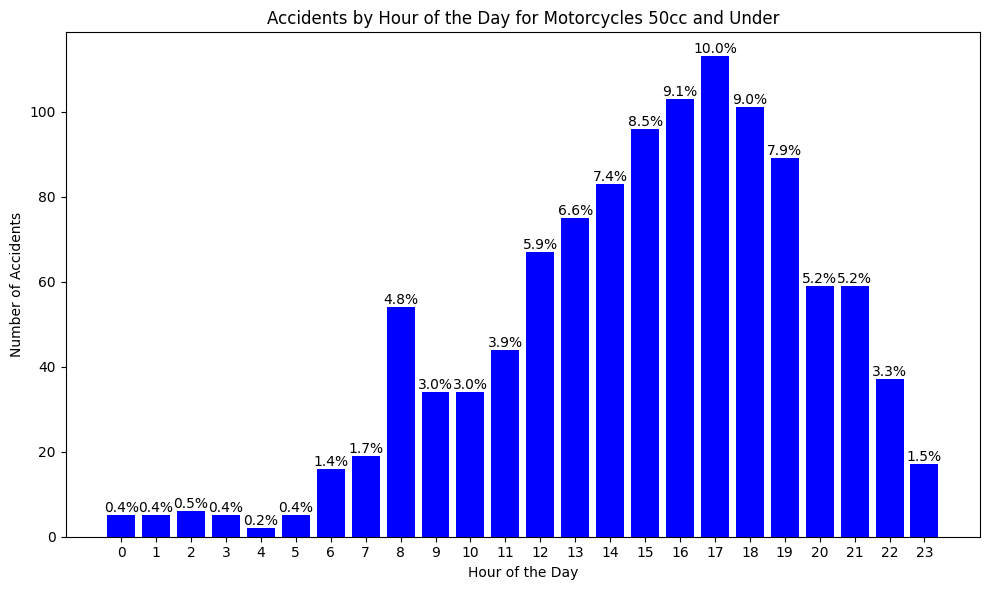

In [58]:
total_accidents = number_mcycle_50cc_under.sum()

plt.figure(figsize=(10, 6))
bars = plt.bar(number_mcycle_50cc_under.index, number_mcycle_50cc_under.values, color='blue')

# Adding labels and title
plt.xlabel('Hour of the Day')
plt.ylabel('Number of Accidents')
plt.title('Accidents by Hour of the Day for Motorcycles 50cc and Under')

# Adding percentage labels on top of each bar
for bar in bars:
    height = bar.get_height()
    percentage = (height / total_accidents) * 100
    plt.text(bar.get_x() + bar.get_width() / 2, height, f'{percentage:.1f}%', ha='center', va='bottom')

plt.xticks(range(24))
plt.tight_layout()
plt.show()


### Number of accident by hours of the day for M/cycle  125cc and under

In [59]:
number_mcycle_over50cc_125cc = mcycle_over50cc_125cc['Hourly'].value_counts().sort_index()

In [60]:
number_mcycle_over50cc_125cc

0      68
1      55
2      31
3      25
4      28
5      54
6     117
7     274
8     250
9     211
10    255
11    320
12    418
13    516
14    522
15    551
16    603
17    692
18    705
19    580
20    475
21    365
22    254
23    154
Name: Hourly, dtype: int64

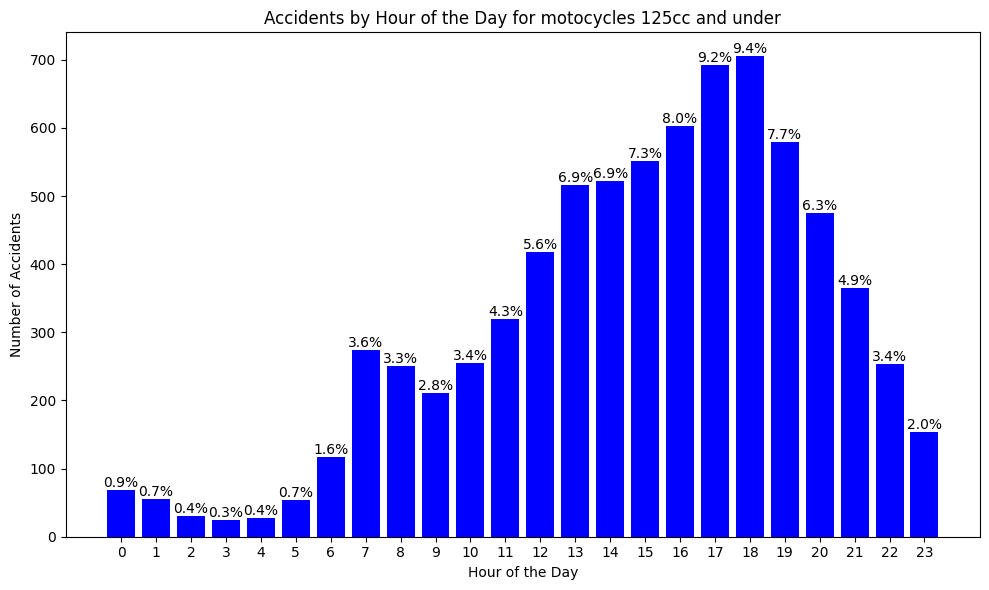

In [61]:
total_accidents = number_mcycle_over50cc_125cc.sum()

plt.figure(figsize=(10, 6))
bars = plt.bar(number_mcycle_over50cc_125cc.index, number_mcycle_over50cc_125cc.values, color='blue')

# Adding labels and title
plt.xlabel('Hour of the Day')
plt.ylabel('Number of Accidents')
plt.title('Accidents by Hour of the Day for motocycles 125cc and under')

# Adding percentage labels on top of each bar
for bar in bars:
    height = bar.get_height()
    percentage = (height / total_accidents) * 100
    plt.text(bar.get_x() + bar.get_width() / 2, height, f'{percentage:.1f}%', ha='center', va='bottom')

plt.xticks(range(24))
plt.tight_layout()
plt.show()

### Number of accident by hours of the day for M/cycle over 125cc and up to 500cc

In [62]:
number_mcycle_over125cc_500cc = mcycle_over125cc_500cc['Hourly'].value_counts().sort_index()

In [63]:
number_mcycle_over125cc_500cc

0      17
1      18
2       4
3       5
4       9
5      13
6      35
7      77
8      62
9      54
10     67
11     70
12     93
13    122
14    131
15    151
16    157
17    175
18    128
19     93
20     82
21     56
22     38
23     34
Name: Hourly, dtype: int64

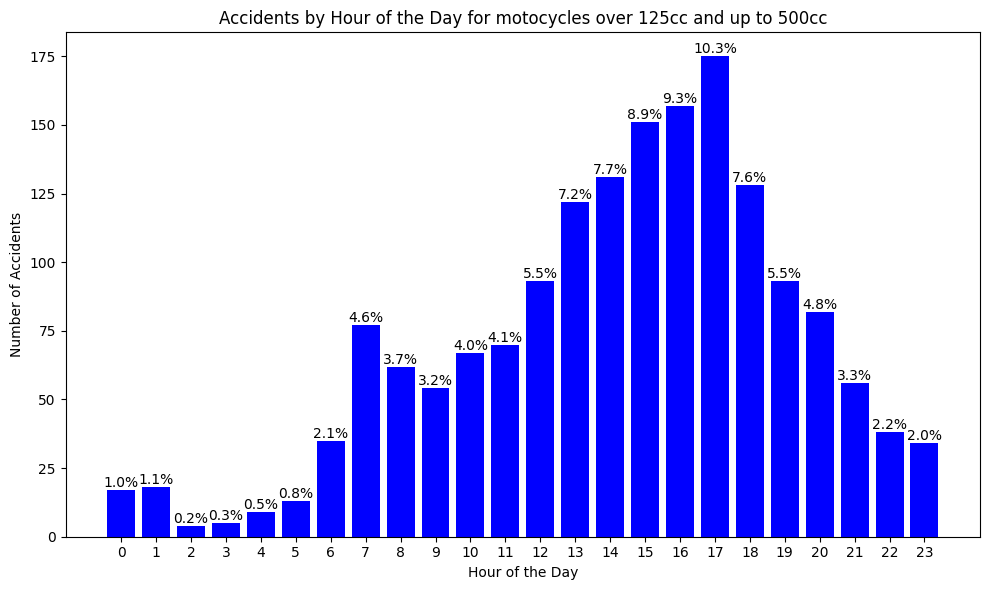

In [64]:
total_accidents = number_mcycle_over125cc_500cc.sum()

plt.figure(figsize=(10, 6))
bars = plt.bar(number_mcycle_over125cc_500cc.index, number_mcycle_over125cc_500cc.values, color='blue')

# Adding labels and title
plt.xlabel('Hour of the Day')
plt.ylabel('Number of Accidents')
plt.title('Accidents by Hour of the Day for motocycles over 125cc and up to 500cc')

# Adding percentage labels on top of each bar
for bar in bars:
    height = bar.get_height()
    percentage = (height / total_accidents) * 100
    plt.text(bar.get_x() + bar.get_width() / 2, height, f'{percentage:.1f}%', ha='center', va='bottom')

plt.xticks(range(24))
plt.tight_layout()
plt.show()


### Number of accident by hours of the day for M/cycle over 500cc

In [65]:
number_mcycle_over_500cc = mcycle_over_500cc['Hourly'].value_counts().sort_index()

In [66]:
number_mcycle_over_500cc

0      11
1      17
2       8
3       7
4       4
5      44
6      91
7     180
8     133
9     123
10    175
11    258
12    275
13    323
14    323
15    336
16    366
17    421
18    242
19    163
20    112
21     83
22     56
23     33
Name: Hourly, dtype: int64

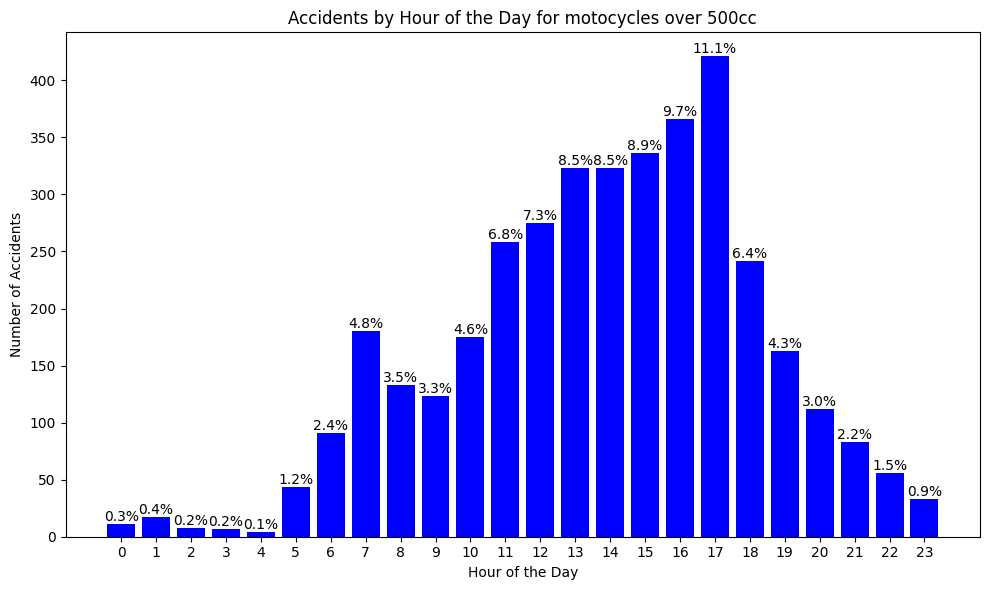

In [67]:
total_accidents = number_mcycle_over_500cc.sum()

plt.figure(figsize=(10, 6))
bars = plt.bar(number_mcycle_over_500cc.index, number_mcycle_over_500cc.values, color='blue')

# Adding labels and title
plt.xlabel('Hour of the Day')
plt.ylabel('Number of Accidents')
plt.title('Accidents by Hour of the Day for motocycles over 500cc')

# Adding percentage labels on top of each bar
for bar in bars:
    height = bar.get_height()
    percentage = (height / total_accidents) * 100
    plt.text(bar.get_x() + bar.get_width() / 2, height, f'{percentage:.1f}%', ha='center', va='bottom')

plt.xticks(range(24))
plt.tight_layout()
plt.show()


### A combined plots of Accidents by Hour of the Day for each type of motorcycle(Motorcycle 125cc and under, Motorcycle over 125cc and up to 500cc, and Motorcycle over 500cc.)

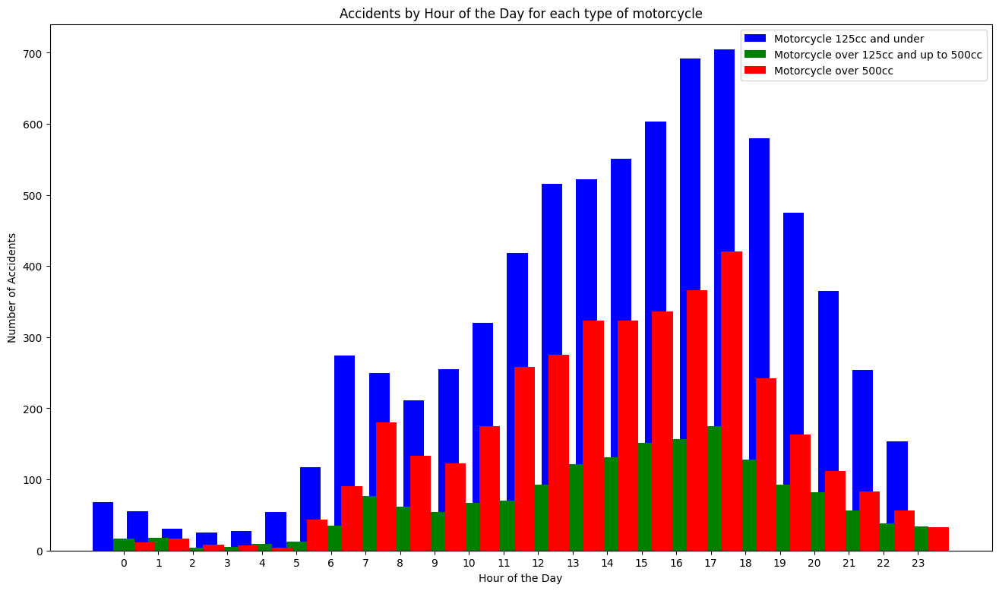

In [68]:
fig, ax = plt.subplots(figsize=(16, 9))

width = 0.6
x_values = [number_mcycle_over50cc_125cc.index - width, number_mcycle_over125cc_500cc.index, number_mcycle_over_500cc.index + width]
y_values = [number_mcycle_over50cc_125cc.values, number_mcycle_over125cc_500cc.values, number_mcycle_over_500cc.values]
labels = ['Motorcycle 125cc and under', 'Motorcycle over 125cc and up to 500cc', 'Motorcycle over 500cc']
colors = ['blue', 'green', 'red']

for i in range(len(x_values)):
    ax.bar(x_values[i], y_values[i], width=width, label=labels[i], color=colors[i])

ax.set_xlabel('Hour of the Day')
ax.set_ylabel('Number of Accidents')
ax.set_title('Accidents by Hour of the Day for each type of motorcycle')
ax.set_xticks(range(0, 24))
ax.legend()
plt.show()


### Number of accident by days of the week for M/cycle 125cc and under

In [69]:
WKnumber_mcycle_over50cc_125cc = mcycle_over50cc_125cc['weekday'].value_counts().sort_index()

In [70]:
WKnumber_mcycle_over50cc_125cc

Friday       1285
Monday       1008
Saturday     1043
Sunday        845
Thursday     1219
Tuesday      1034
Wednesday    1089
Name: weekday, dtype: int64

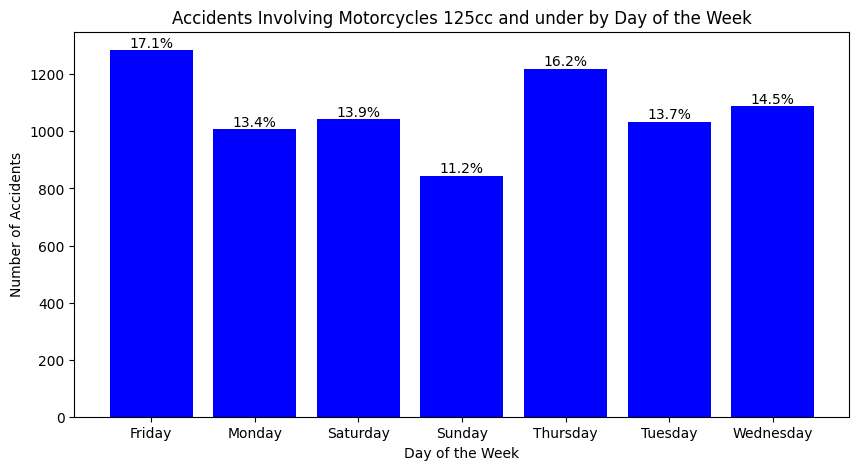

In [71]:


# Assuming you have defined WKnumber_mcycle_over50cc_125cc correctly

total_accidents = WKnumber_mcycle_over50cc_125cc.sum()
percentages = (WKnumber_mcycle_over50cc_125cc / total_accidents) * 100

plt.figure(figsize=(10, 5))
bars = plt.bar(WKnumber_mcycle_over50cc_125cc.index, WKnumber_mcycle_over50cc_125cc.values, color='blue')

# Add percentage labels on top of each bar
for bar, percentage in zip(bars, percentages):
    height = bar.get_height()
    plt.text(bar.get_x() + bar.get_width() / 2, height, f'{percentage:.1f}%', ha='center', va='bottom', fontsize=10)

plt.xlabel('Day of the Week')
plt.ylabel('Number of Accidents')
plt.title('Accidents Involving Motorcycles 125cc and under by Day of the Week')
plt.show()


### Number of accident by days of the week for M/cycle over 125cc and up to 500cc

In [72]:
WKnumber_mcycle_over125cc_500cc  = mcycle_over125cc_500cc['weekday'].value_counts().sort_index()

In [73]:
WKnumber_mcycle_over125cc_500cc 

Friday       267
Monday       227
Saturday     237
Sunday       218
Thursday     257
Tuesday      234
Wednesday    251
Name: weekday, dtype: int64

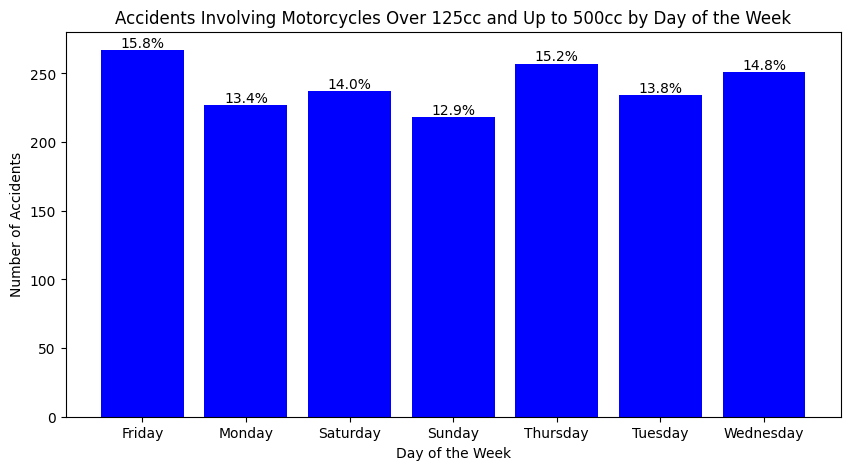

In [74]:

total_accidents = WKnumber_mcycle_over125cc_500cc.sum()
percentages = (WKnumber_mcycle_over125cc_500cc / total_accidents) * 100

plt.figure(figsize=(10, 5))
bars = plt.bar(WKnumber_mcycle_over125cc_500cc.index, WKnumber_mcycle_over125cc_500cc.values, color='blue')

# Add percentage labels on top of each bar
for bar, percentage in zip(bars, percentages):
    height = bar.get_height()
    plt.text(bar.get_x() + bar.get_width() / 2, height, f'{percentage:.1f}%', ha='center', va='bottom', fontsize=10)

plt.xlabel('Day of the Week')
plt.ylabel('Number of Accidents')
plt.title('Accidents Involving Motorcycles Over 125cc and Up to 500cc by Day of the Week')
plt.show()


### Number of accident by days of the week for M/cycle over 500cc

In [75]:
WKnumber_mcycle_over_500cc  = mcycle_over_500cc['weekday'].value_counts().sort_index()

In [76]:
WKnumber_mcycle_over_500cc

Friday       567
Monday       468
Saturday     550
Sunday       675
Thursday     526
Tuesday      497
Wednesday    501
Name: weekday, dtype: int64

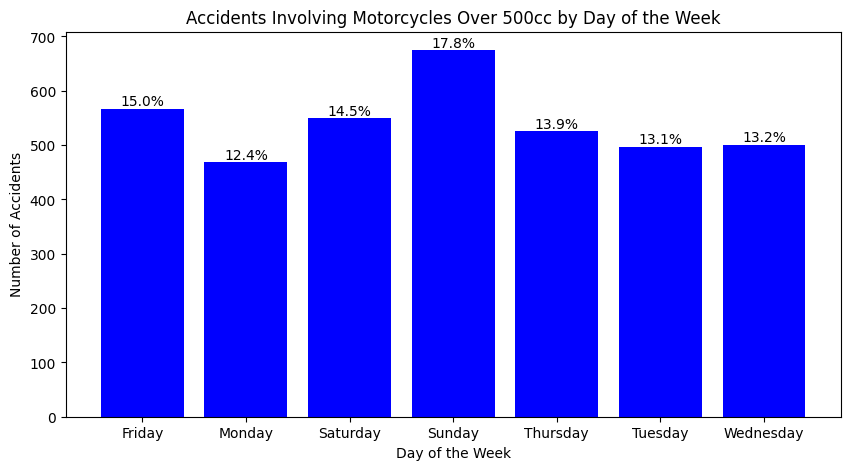

In [77]:

total_accidents = WKnumber_mcycle_over_500cc.sum()
percentages = (WKnumber_mcycle_over_500cc / total_accidents) * 100

plt.figure(figsize=(10, 5))
bars = plt.bar(WKnumber_mcycle_over_500cc.index, WKnumber_mcycle_over_500cc.values, color='blue')

# Add percentage labels on top of each bar
for bar, percentage in zip(bars, percentages):
    height = bar.get_height()
    plt.text(bar.get_x() + bar.get_width() / 2, height, f'{percentage:.1f}%', ha='center', va='bottom', fontsize=10)

plt.xlabel('Day of the Week')
plt.ylabel('Number of Accidents')
plt.title('Accidents Involving Motorcycles Over 500cc by Day of the Week')
plt.show()


### A combined plots of Accidents by Days of the Week for each type of motorcycle(Motorcycle 125cc and under, Motorcycle over 125cc and up to 500cc, and Motorcycle over 500cc.)

In [78]:
# assign sorted bike categories by week to variables
for_over_50cc_125cc = mcycle_over50cc_125cc['weekday'].value_counts()[weekly_days]
for_over_125cc_500cc = mcycle_over125cc_500cc['weekday'].value_counts()[weekly_days]
for_over_500cc = mcycle_over_500cc['weekday'].value_counts()[weekly_days]

In [79]:

# Total values for each motorbike category
total_125 = sum(for_over_50cc_125cc)
total_125_500 = sum(for_over_125cc_500cc)
total_500 = sum(for_over_500cc)

# Formatting the values with percentage in brackets (one decimal place)
formatted_data = {
    'Day of the Week': weekly_days,
    'Motorcycle 125cc and under': [f"{value} ({value/total_125*100:.1f}%)" for value in for_over_50cc_125cc],
    'Motorcycle over 125cc and up to 500cc': [f"{value} ({value/total_125_500*100:.1f}%)" for value in for_over_125cc_500cc],
    'Motorcycle over 500cc': [f"{value} ({value/total_500*100:.1f}%)" for value in for_over_500cc]
}

# Creating a DataFrame with the formatted data
motorcycle_weekly_df = pd.DataFrame(formatted_data)

motorcycle_weekly_df

,Day of the Week,Motorcycle 125cc and under,Motorcycle over 125cc and up to 500cc,Motorcycle over 500cc
0,Sunday,845 (11.2%),218 (12.9%),675 (17.8%)
1,Monday,1008 (13.4%),227 (13.4%),468 (12.4%)
2,Tuesday,1034 (13.7%),234 (13.8%),497 (13.1%)
3,Wednesday,1089 (14.5%),251 (14.8%),501 (13.2%)
4,Thursday,1219 (16.2%),257 (15.2%),526 (13.9%)
5,Friday,1285 (17.1%),267 (15.8%),567 (15.0%)
6,Saturday,1043 (13.9%),237 (14.0%),550 (14.5%)


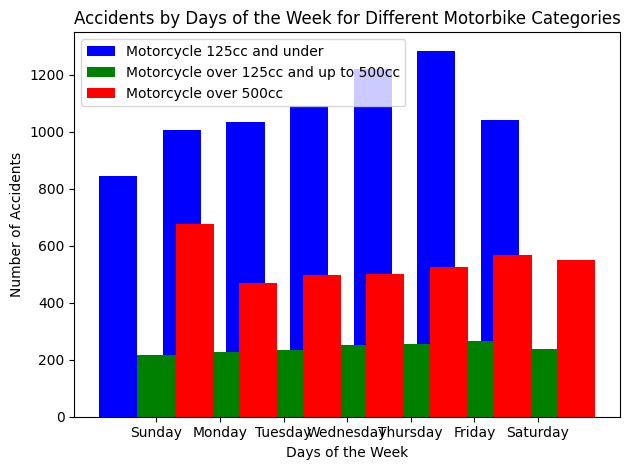

In [80]:
# Define the categories and corresponding colors
categories = ['Motorcycle 125cc and under', 'Motorcycle over 125cc and up to 500cc', 'Motorcycle over 500cc']
colors = ['blue', 'green', 'red']

# Plotting accidents by days of the week for different motorbike categories
for i, data in enumerate([for_over_50cc_125cc, for_over_125cc_500cc, for_over_500cc]):
    plt.bar([day + (i - 1) * width for day in range(1, 8)], data, width=width, label=categories[i], color=colors[i])

# Adding labels and title
plt.xlabel('Days of the Week')
plt.ylabel('Number of Accidents')
plt.title('Accidents by Days of the Week for Different Motorbike Categories')

# Setting x-axis ticks and legend
plt.xticks(range(1, 8), weekly_days)
plt.legend()

# Adjusting layout and displaying the plot
plt.tight_layout()
plt.show()

# Question 3: For pedestrians involved in accidents, are there significant hours of the day, and days of the week, on which they are more likely to be involved?

- The query below retrieves all 2020 accident records involving pedestrians by joining the accident and casualty tables.

In [81]:
# Reading file using a reusable function
pedestrians_df = fetch_data_from_sql("""
    SELECT * FROM accident
    JOIN casualty ON accident.accident_index = casualty.accident_index
    WHERE accident.accident_year = 2020 AND casualty_class = 3""")


In [82]:
pedestrians_df.head(3)

,accident_index,accident_year,accident_reference,location_easting_osgr,location_northing_osgr,longitude,latitude,police_force,accident_severity,number_of_vehicles,...,age_band_of_casualty,casualty_severity,pedestrian_location,pedestrian_movement,car_passenger,bus_or_coach_passenger,pedestrian_road_maintenance_worker,casualty_type,casualty_home_area_type,casualty_imd_decile
0,2020010219808,2020,010219808,521389.0,175144.0,-0.254001,51.462262,1,3,1,...,6,3,9,5,0,0,0,0,1,4
1,2020010220496,2020,010220496,529337.0,176237.0,-0.139253,51.470327,1,3,1,...,1,3,1,1,0,0,0,0,1,2
2,2020010220496,2020,010220496,529337.0,176237.0,-0.139253,51.470327,1,3,1,...,1,3,1,1,0,0,0,0,1,2


In [83]:
pedestrians_df_time = converter(pedestrians_df)

In [84]:
total_pedestrians = len(pedestrians_df)
print("The total number of pedestrians involved in accidents is:", total_pedestrians)


The total number of pedestrians involved in accidents is: 14750


In [85]:
pedestrians_df_time.head(3)

,accident_index,accident_year,accident_reference,location_easting_osgr,location_northing_osgr,longitude,latitude,police_force,accident_severity,number_of_vehicles,...,pedestrian_movement,car_passenger,bus_or_coach_passenger,pedestrian_road_maintenance_worker,casualty_type,casualty_home_area_type,casualty_imd_decile,DateTime,weekday,Hourly
0,2020010219808,2020,010219808,521389.0,175144.0,-0.254001,51.462262,1,3,1,...,5,0,0,0,0,1,4,2020-02-04 09:00:00,Tuesday,9
1,2020010220496,2020,010220496,529337.0,176237.0,-0.139253,51.470327,1,3,1,...,1,0,0,0,0,1,2,2020-04-27 13:55:00,Monday,13
2,2020010220496,2020,010220496,529337.0,176237.0,-0.139253,51.470327,1,3,1,...,1,0,0,0,0,1,2,2020-04-27 13:55:00,Monday,13


## Number of Pedestrian accidents by hours of the day

In [86]:
number_pedesAccident_perHour = pedestrians_df_time['Hourly'].value_counts().sort_index()

In [87]:
number_pedesAccident_perHour

0      173
1      144
2       83
3       82
4       50
5       74
6      173
7      514
8     1060
9      607
10     644
11     725
12     809
13     833
14    1015
15    1672
16    1323
17    1274
18    1146
19     824
20     518
21     412
22     365
23     230
Name: Hourly, dtype: int64

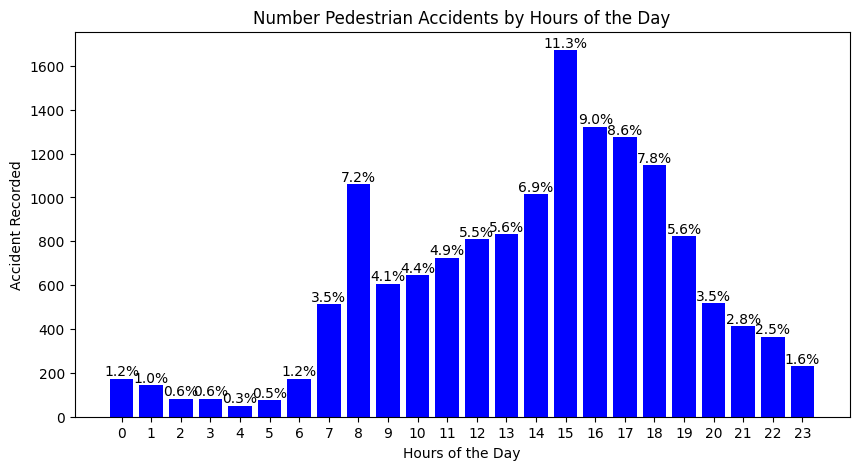

In [88]:
# Plot of Motobike Accident by hour
plt.figure(figsize=(10, 5))
bars = plt.bar(number_pedesAccident_perHour.index, number_pedesAccident_perHour.values, color='blue')
plt.xlabel('Hours of the Day')
plt.ylabel('Accident Recorded')
plt.title('Number Pedestrian Accidents by Hours of the Day')

plt.xticks(range(24))

# Adding percentage labels to the bars
total_accidents = number_pedesAccident_perHour.sum()
for bar in bars:
    height = bar.get_height()
    percentage = height / total_accidents * 100
    plt.text(bar.get_x() + bar.get_width() / 2, height, f'{percentage:.1f}%',
             ha='center', va='bottom')

plt.show()


## Number of Pedestrian accidents by days of the week

In [89]:
number_pedesAccident_perDay = pedestrians_df_time['weekday'].value_counts().reindex(weekly_days)
number_pedesAccident_perDay


Sunday       1242
Monday       2207
Tuesday      2267
Wednesday    2247
Thursday     2366
Friday       2543
Saturday     1878
Name: weekday, dtype: int64

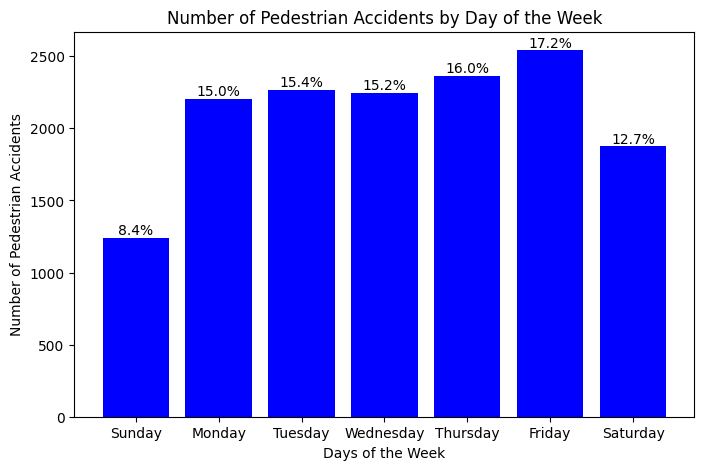

In [90]:

plt.figure(figsize=(8, 5))
bars = plt.bar(number_pedesAccident_perDay.index, number_pedesAccident_perDay.values, color='blue')
plt.xlabel('Days of the Week')
plt.ylabel('Number of Pedestrian Accidents')
plt.title('Number of Pedestrian Accidents by Day of the Week')

# Adding percentage labels to the bars
total_accidents = number_pedesAccident_perDay.sum()
for bar in bars:
    height = bar.get_height()
    percentage = height / total_accidents * 100
    plt.text(bar.get_x() + bar.get_width() / 2, height, f'{percentage:.1f}%',
             ha='center', va='bottom')

plt.show()


## Visualization of some accident conditions

- Some of these conditions highllighted below are:
- Accidents by Road Type
- Accidents by speed limit
- Accidents by weather conditions
- Accidents by road surface conditions
- Accidents by junction control
- Accidents by pedestrian crossing physical facilities
- Accidents by light conditions

In [91]:
def generate_tables_and_plots_factory():
    """
    Returns a function that generates tables and plots with counts, percentages,
    and percentage labels on bars. Allows entering mapping descriptions during call.
    """
    
    def generate_tables_and_plots(data, category, mapping_dict=None):
        """
        Generates tables and plots with counts, percentages, and percentage labels on bars.
        """

        
        data[category] = data[category].astype('category', errors='ignore')

        # Create a table for accidents by the specified category
        accident_by_category = pd.crosstab(index=data[category], columns='count')
        total = len(data)

        # Calculate percentages
        accident_by_category['percentage'] = (accident_by_category / total * 100).round(1)

        
        comments = None
        if mapping_dict:
            accident_by_category.index = accident_by_category.index.map(mapping_dict)
        else:
            category_names = accident_by_category.index.categories
            if category_names is not None and len(category_names) > 0:
                comments = "\n**Note:** Category labels in this table correspond to:\n"
                for i, name in enumerate(category_names):
                    comments += f"  - {i+1}: {name}\n"

        print("Table for Accidents by", category)
        if comments:
            print(comments)
        print(accident_by_category)  # Table output with descriptive labels
        print("\n")

        # Plotting
        plt.figure(figsize=(12, 6))
        sns.countplot(data=data, x=category, dodge=False)
        plt.xticks(rotation=45)
        plt.title("Accidents by " + category)
        plt.xlabel(category)
        plt.ylabel("Number of Accidents")

        for i, count in enumerate(accident_by_category['count']):
            percentage = accident_by_category['percentage'].iloc[i]
            plt.text(i, count, f"{percentage}%", ha='center', va='bottom')

        plt.show()

    return generate_tables_and_plots


In [92]:
data = accidents_df
accidents_df = pd.DataFrame(data)

### Accidents by Road Type

Table for Accidents by road_type
col_0               count  percentage
road_type                            
Roundabout           5580         6.1
One way street       1966         2.2
Dual carriageway    13206        14.5
Single carriageway  66929        73.4
Slip road            1512         1.7
Unknown              2006         2.2




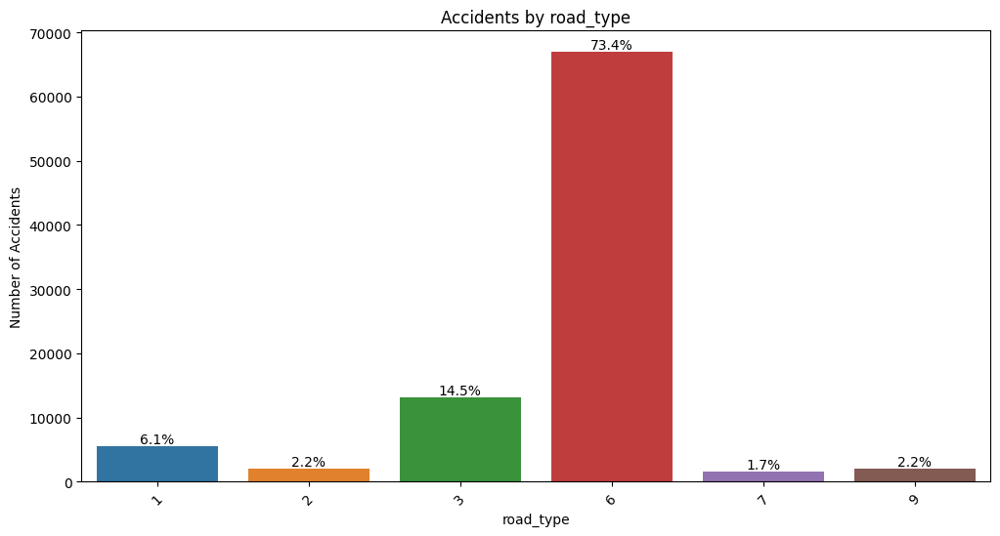

In [93]:
# Example usage
generate_tables_and_plots = generate_tables_and_plots_factory()

# Call the returned function with data, category, and optional mapping dictionary
road_type_mapping = {
    1: "Roundabout",
    2: "One way street",
    3: "Dual carriageway",
    6: "Single carriageway",
    7: "Slip road",
    9: "Unknown"
}

generate_tables_and_plots(accidents_df, 'road_type', road_type_mapping) 

### Accidents by speed limit

Table for Accidents by speed_limit

**Note:** Category labels in this table correspond to:
  - 1: -1
  - 2: 20
  - 3: 30
  - 4: 40
  - 5: 50
  - 6: 60
  - 7: 70

col_0        count  percentage
speed_limit                   
-1              12         0.0
20           11183        12.3
30           52260        57.3
40            7867         8.6
50            3782         4.1
60           11408        12.5
70            4687         5.1




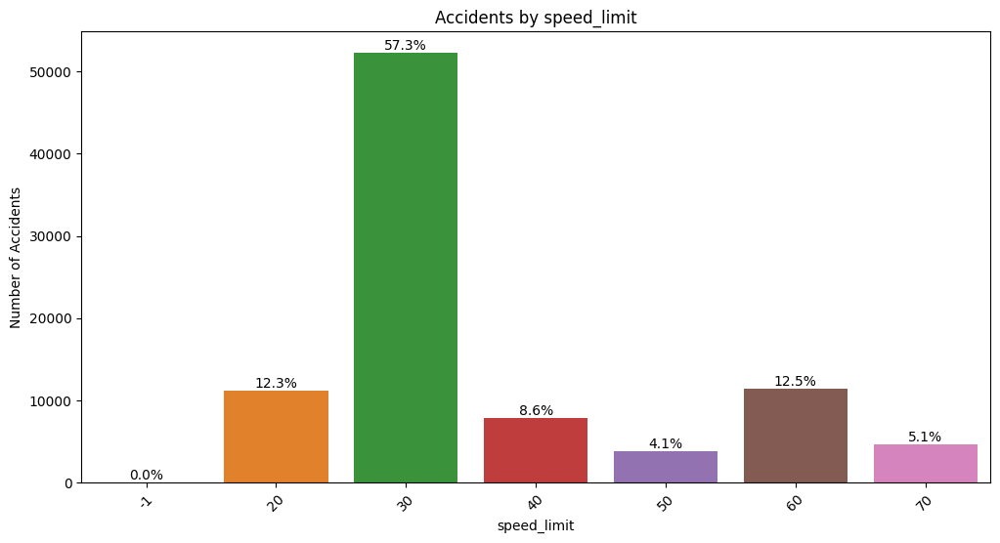

In [94]:
generate_tables_and_plots = generate_tables_and_plots_factory()

# Call the returned function with data, category, and optional mapping dictionary
speed_limit_mapping = {
   
}

generate_tables_and_plots(accidents_df, 'speed_limit', speed_limit_mapping) 

### Accidents by weather conditions

Table for Accidents by weather_conditions
col_0                       count  percentage
weather_conditions                           
NaN                             1         0.0
Fine without high winds     70729        77.6
Raining without high winds  11583        12.7
Snowing without high winds    185         0.2
Fine with high winds         1401         1.5
Raining with high winds      1665         1.8
Snowing with high winds        73         0.1
Fog or mist - if hazard       510         0.6
Other                        2629         2.9
Unknown                      2423         2.7




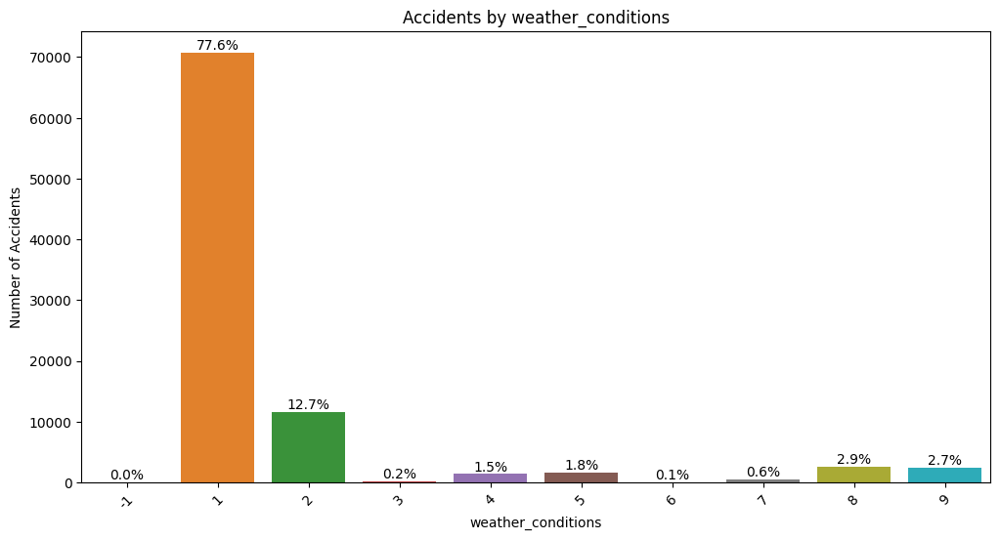

In [95]:
generate_tables_and_plots = generate_tables_and_plots_factory()

# Call the returned function with data, category, and optional mapping dictionary
weather_conditions_mapping = {
        1: 'Fine without high winds',
        2: 'Raining without high winds',
        3: 'Snowing without high winds',
        4: 'Fine with high winds',
        5: 'Raining with high winds',
        6: 'Snowing with high winds',
        7: 'Fog or mist - if hazard',
        8: 'Other',
        9: 'Unknown'
}

generate_tables_and_plots(accidents_df, 'weather_conditions', weather_conditions_mapping) 

### Accidents by road surface conditions

Table for Accidents by road_surface_conditions
col_0                                count  percentage
road_surface_conditions                               
NaN                                    316         0.3
Dry                                  62698        68.7
Wet / Damp                           26240        28.8
Snow                                   150         0.2
Frost / Ice                            764         0.8
Flood (surface water over 3cm deep)    184         0.2
NaN                                    847         0.9




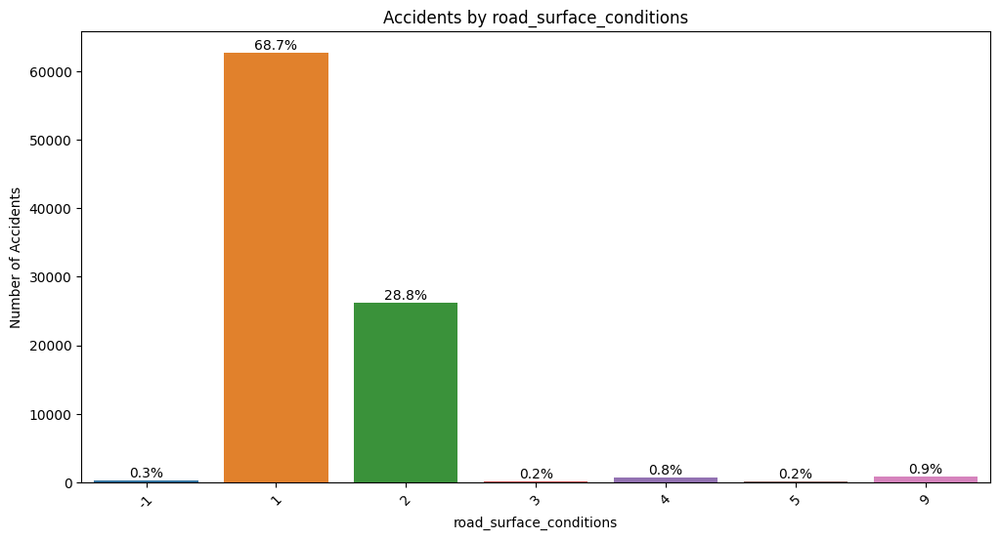

In [96]:
generate_tables_and_plots = generate_tables_and_plots_factory()

# Call the returned function with data, category, and optional mapping dictionary
road_surface_conditions_mapping = {
        1: 'Dry',
        2: 'Wet / Damp',
        3: 'Snow',
        4: 'Frost / Ice',
        5: 'Flood (surface water over 3cm deep)'
}

generate_tables_and_plots(accidents_df, 'road_surface_conditions', road_surface_conditions_mapping) 

### Accidents by junction control

Table for Accidents by junction_control
col_0                     count  percentage
junction_control                           
NaN                       38298        42.0
Authorised person           377         0.4
Automatic traffic signal  10407        11.4
Stop sign                   583         0.6
Give way or uncontrolled  39998        43.9
NaN                        1536         1.7




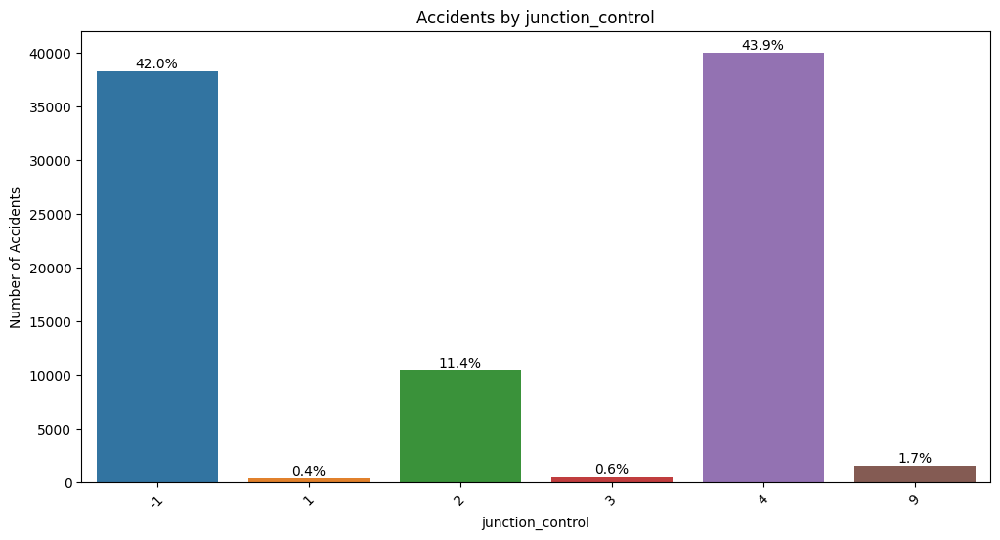

In [97]:
generate_tables_and_plots = generate_tables_and_plots_factory()

# Call the returned function with data, category, and optional mapping dictionary
junction_control_mapping = {
    1: 'Authorised person',
        2: 'Automatic traffic signal',
        3: 'Stop sign',
        4: 'Give way or uncontrolled'
}

generate_tables_and_plots(accidents_df, 'junction_control', junction_control_mapping) 

### Accidents by pedestrian crossing physical facilities

Table for Accidents by pedestrian_crossing_physical_facilities
col_0                                               count  percentage
pedestrian_crossing_physical_facilities                              
NaN                                                   135         0.1
No physical crossing facility within 50m            69269        76.0
Zebra crossing                                       3836         4.2
Pelican, puffin, toucan or similar non-traffic ...   4903         5.4
Pedestrian phase at traffic signal                   7465         8.2
Footbridge or subway                                  199         0.2
Central refuge — no other controls                   2460         2.7
NaN                                                  2932         3.2




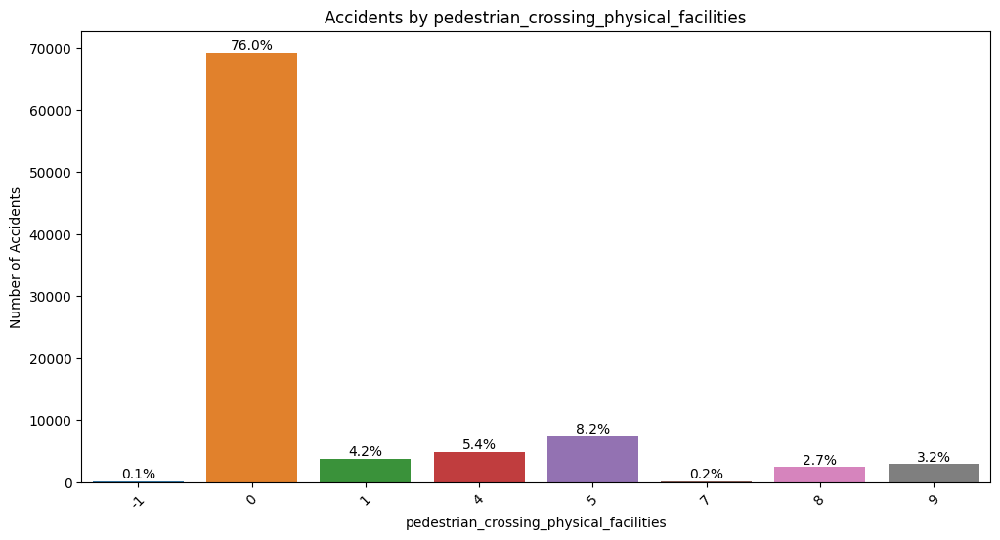

In [98]:
generate_tables_and_plots = generate_tables_and_plots_factory()

# Call the returned function with data, category, and optional mapping dictionary
pedestrian_crossing_physical_facilities_mapping = {
    0: 'No physical crossing facility within 50m',
        1: 'Zebra crossing',
        4: 'Pelican, puffin, toucan or similar non-traffic signal junction',
        5: 'Pedestrian phase at traffic signal',
        7: 'Footbridge or subway',
        8: 'Central refuge — no other controls'
}

generate_tables_and_plots(accidents_df, 'pedestrian_crossing_physical_facilities', pedestrian_crossing_physical_facilities_mapping) 

### Accidents by light conditions

Table for Accidents by light_conditions
col_0                                      count  percentage
light_conditions                                            
NaN                                            1         0.0
Daylight                                   64458        70.7
Darkness: street lights present and lit    19026        20.9
Darkness: street lights present but unlit    685         0.8
Darkness: no street lighting                4835         5.3
Darkness: street lighting unknown           2194         2.4




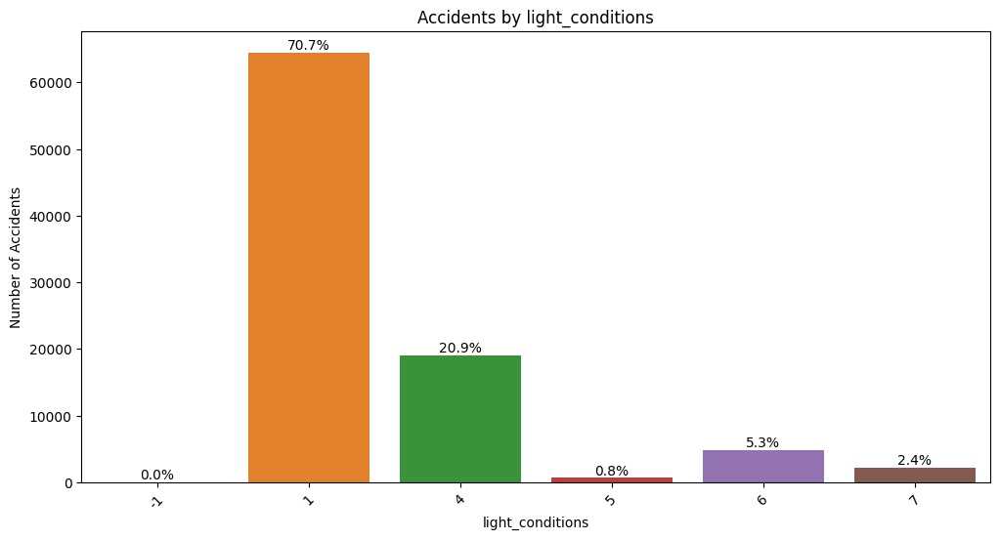

In [99]:
generate_tables_and_plots = generate_tables_and_plots_factory()

# Call the returned function with data, category, and optional mapping dictionary
light_conditions_mapping = {
        1: 'Daylight',
        4: 'Darkness: street lights present and lit',
        5: 'Darkness: street lights present but unlit',
        6: 'Darkness: no street lighting',
        7: 'Darkness: street lighting unknown'
}

generate_tables_and_plots(accidents_df, 'light_conditions', light_conditions_mapping) 

# Data cleaning

- The function is implemented by replacing the specified placeholder value with NaN, filling the  missing values in the column using a chosen method, converting the column to a specified data type, and returning the updated DataFrame.This was implemented for the accident table, vehicle table and the casuallty table respectively

In [100]:


def fill_missing_values(df, column, fill_type="ffill", rep_value=-1, var_type=int):
    """
    Fill missing values in a DataFrame column.

    Parameters:
        df (DataFrame): The DataFrame containing the column to fill.
        column (str): The name of the column to fill.
        fill_type (str): The method to fill missing values (default: "ffill").
        rep_value (int or float): The value to replace in the column (default: -1).
        var_type (type): The desired data type of the column (default: int).

    Returns:
        DataFrame: The DataFrame with missing values filled and column type converted.
    """
    try:
        # Replace rep_value with NaN
        df[column].replace(rep_value, np.nan, inplace=True)
        
        # Fill missing values using the specified method
        df[column].fillna(method=fill_type, inplace=True)
    
        # Convert the values to the specified data type
        df[column] = df[column].astype(var_type)
        
        return df
    
    except Exception as e:
        return e


## cleaning the accident table

In [101]:
accidents_df1 = accidents_df.copy()

In [102]:
accidents_df1.head(2)

,accident_index,accident_year,accident_reference,location_easting_osgr,location_northing_osgr,longitude,latitude,police_force,accident_severity,number_of_vehicles,...,road_surface_conditions,special_conditions_at_site,carriageway_hazards,urban_or_rural_area,did_police_officer_attend_scene_of_accident,trunk_road_flag,lsoa_of_accident_location,DateTime,weekday,Hourly
0,2020010219808,2020,010219808,521389.0,175144.0,-0.254001,51.462262,1,3,1,...,9,0,0,1,3,2,E01004576,2020-02-04 09:00:00,Tuesday,9
1,2020010220496,2020,010220496,529337.0,176237.0,-0.139253,51.470327,1,3,1,...,1,0,0,1,1,2,E01003034,2020-04-27 13:55:00,Monday,13


In [103]:
accidents_df1.isnull().sum()


accident_index                                  0
accident_year                                   0
accident_reference                              0
location_easting_osgr                          14
location_northing_osgr                         14
longitude                                      14
latitude                                       14
police_force                                    0
accident_severity                               0
number_of_vehicles                              0
number_of_casualties                            0
date                                            0
day_of_week                                     0
time                                            0
local_authority_district                        0
local_authority_ons_district                    0
local_authority_highway                         0
first_road_class                                0
first_road_number                               0
road_type                                       0


In [104]:
accidents_df1.columns

Index(['accident_index', 'accident_year', 'accident_reference',
       'location_easting_osgr', 'location_northing_osgr', 'longitude',
       'latitude', 'police_force', 'accident_severity', 'number_of_vehicles',
       'number_of_casualties', 'date', 'day_of_week', 'time',
       'local_authority_district', 'local_authority_ons_district',
       'local_authority_highway', 'first_road_class', 'first_road_number',
       'road_type', 'speed_limit', 'junction_detail', 'junction_control',
       'second_road_class', 'second_road_number',
       'pedestrian_crossing_human_control',
       'pedestrian_crossing_physical_facilities', 'light_conditions',
       'weather_conditions', 'road_surface_conditions',
       'special_conditions_at_site', 'carriageway_hazards',
       'urban_or_rural_area', 'did_police_officer_attend_scene_of_accident',
       'trunk_road_flag', 'lsoa_of_accident_location', 'DateTime', 'weekday',
       'Hourly'],
      dtype='object')

- We shall clean these columns 'location_easting_osgr','location_northing_osgr','longitude','latitude' by replacing the null with the nearest neighbours                      


In [105]:


# Define the columns to fill
fill_columns = ['location_easting_osgr', 'location_northing_osgr', 'longitude', 'latitude']

# Group by 'police_force' and 'local_authority_ons_district', then forward fill within each group
filled_df = accidents_df1.groupby(['police_force'])[fill_columns].transform(lambda x: x.ffill())

# Update the original DataFrame with the filled values
accidents_df1[fill_columns] = filled_df


In [106]:
filled_df.head(2)

,location_easting_osgr,location_northing_osgr,longitude,latitude
0,521389.0,175144.0,-0.254001,51.462262
1,529337.0,176237.0,-0.139253,51.470327


In [107]:
accidents_df1.isnull().sum()

accident_index                                 0
accident_year                                  0
accident_reference                             0
location_easting_osgr                          0
location_northing_osgr                         0
longitude                                      0
latitude                                       0
police_force                                   0
accident_severity                              0
number_of_vehicles                             0
number_of_casualties                           0
date                                           0
day_of_week                                    0
time                                           0
local_authority_district                       0
local_authority_ons_district                   0
local_authority_highway                        0
first_road_class                               0
first_road_number                              0
road_type                                      0
speed_limit         

- The function counts and prints the occurrences of the special values -1 and 99 in each column of the given DataFrame

In [108]:
def count_special_values_accidents(accidents_df1):
    """
    Counts occurrences of special values (-1 and 99) in each column of the accidents_df1 DataFrame.

    Args:
        accidents_df1 (DataFrame): DataFrame to analyze.

    Returns:
        None
    """
    for idx, column in enumerate(accidents_df1.columns, 1):
        count_negative_one = (accidents_df1[column] == -1).sum()
        count_ninety_nine = (accidents_df1[column] == 99).sum()

        # Check if either -1 or 99 is present in the column
        if count_negative_one > 0 or count_ninety_nine > 0:
            # Display column index, name, and counts
            print(f"{idx}. Column: {column}, Count of -1: {count_negative_one}, Count of 99: {count_ninety_nine}")



- The function counts and prints the number of occurrences of -1 and 99 for each column in the DataFrame if either value is present.

In [109]:
def count_special_values(df):
    """
    Counts occurrences of special values (-1 and 99) in each column of the given DataFrame.

    Args:
        df (DataFrame): DataFrame to analyze.

    Returns:
        None
    """
    for idx, column in enumerate(df.columns, 1):
        count_negative_one = (df[column] == -1).sum()
        count_ninety_nine = (df[column] == 99).sum()

        # Check if either -1 or 99 is present in the column
        if count_negative_one > 0 or count_ninety_nine > 0:
            # Display column index, name, and counts
            print(f"{idx}. Column: {column}, Count of -1: {count_negative_one}, Count of 99: {count_ninety_nine}")



In [110]:
# Execution
print("DataFrame: accidents_df1")
count_special_values_accidents(accidents_df1)


DataFrame: accidents_df1
8. Column: police_force, Count of -1: 0, Count of 99: 3836
15. Column: local_authority_district, Count of -1: 991, Count of 99: 0
19. Column: first_road_number, Count of -1: 0, Count of 99: 7
21. Column: speed_limit, Count of -1: 12, Count of 99: 0
22. Column: junction_detail, Count of -1: 2, Count of 99: 1508
23. Column: junction_control, Count of -1: 38298, Count of 99: 0
24. Column: second_road_class, Count of -1: 110, Count of 99: 0
25. Column: second_road_number, Count of -1: 38045, Count of 99: 0
26. Column: pedestrian_crossing_human_control, Count of -1: 143, Count of 99: 0
27. Column: pedestrian_crossing_physical_facilities, Count of -1: 135, Count of 99: 0
28. Column: light_conditions, Count of -1: 1, Count of 99: 0
29. Column: weather_conditions, Count of -1: 1, Count of 99: 0
30. Column: road_surface_conditions, Count of -1: 316, Count of 99: 0
31. Column: special_conditions_at_site, Count of -1: 218, Count of 99: 0
32. Column: carriageway_hazards, C

In [111]:
accidents_df1[21020:21060]

,accident_index,accident_year,accident_reference,location_easting_osgr,location_northing_osgr,longitude,latitude,police_force,accident_severity,number_of_vehicles,...,road_surface_conditions,special_conditions_at_site,carriageway_hazards,urban_or_rural_area,did_police_officer_attend_scene_of_accident,trunk_road_flag,lsoa_of_accident_location,DateTime,weekday,Hourly
21020,2020030935627,2020,030935627,349361.0,532156.0,-2.786930,54.681907,3,2,1,...,2,0,2,2,1,1,E01019329,2020-02-28 05:22:00,Friday,5
21021,2020030935682,2020,030935682,330734.0,550981.0,-3.080281,54.848826,3,2,1,...,1,0,1,2,1,2,E01019130,2020-02-29 13:21:00,Saturday,13
21022,2020030935726,2020,030935726,339712.0,556311.0,-2.941596,54.897880,3,2,1,...,1,0,0,2,1,2,E01019204,2020-03-01 19:20:00,Sunday,19
21023,2020030935769,2020,030935769,299407.0,521668.0,-3.557863,54.580182,3,3,1,...,1,0,0,2,1,1,E01019297,2020-03-02 06:55:00,Monday,6
21024,2020030935967,2020,030935967,300785.0,513747.0,-3.533879,54.509297,3,3,1,...,2,0,0,2,2,2,E01019273,2020-02-25 22:00:00,Tuesday,22
21025,2020030936329,2020,030936329,336961.0,556733.0,-2.984577,54.901332,3,3,3,...,2,0,0,2,1,2,E01019203,2020-03-03 13:00:00,Tuesday,13
21026,2020030936371,2020,030936371,319757.0,469269.0,-3.228969,54.113018,3,3,1,...,2,0,0,1,1,2,E01019141,2020-02-23 00:54:00,Sunday,0
21027,2020030936408,2020,030936408,305047.0,529111.0,-3.473049,54.648139,3,3,2,...,2,0,0,2,1,1,E01019089,2020-02-26 15:40:00,Wednesday,15
21028,2020030936452,2020,030936452,300434.0,510081.0,-3.538061,54.476294,3,3,2,...,1,0,0,2,1,2,E01019275,2020-02-29 18:55:00,Saturday,18
21029,2020030936543,2020,030936543,347645.0,526067.0,-2.812449,54.627017,3,3,1,...,1,0,0,2,2,2,E01019311,2020-02-23 11:30:00,Sunday,11


In [112]:


# Define columns with -1 and 99
columns_to_replace = {
    "police_force": {"value": [-1, 99]},
    "local_authority_district": {"value": [-1]},
    "first_road_number": {"value": [-1, 99]},
    "speed_limit": {"value": [-1]},
    "junction_detail": {"value": [-1, 99]},
    "junction_control": {"value": [-1]},
    "second_road_class": {"value": [-1]},
    "second_road_number": {"value": [-1]},
    "pedestrian_crossing_human_control": {"value": [-1]},
    "pedestrian_crossing_physical_facilities": {"value": [-1]},
    "light_conditions": {"value": [-1]},
    "weather_conditions": {"value": [-1]},
    "road_surface_conditions": {"value": [-1]},
    "special_conditions_at_site": {"value": [-1]},
    "carriageway_hazards": {"value": [-1]},
    "did_police_officer_attend_scene_of_accident": {"value": [-1]},
    "trunk_road_flag": {"value": [-1]}
}



In [113]:
# Replace -1 and 99 with NaN for specified columns
for column, details in columns_to_replace.items():
    accidents_df1[column] = accidents_df1[column].replace(details['value'], np.nan)

# Fill NaN values with the appropriate values
for column in accidents_df1.columns:
    # Check if the column is numerical or categorical
    if accidents_df1[column].dtype == 'object':
        # For categorical columns, forward fill NaN values
        accidents_df1[column].fillna(method='ffill', inplace=True)
    else:
        # For numerical columns, replace NaN values with mean
        if pd.api.types.is_numeric_dtype(accidents_df1[column].dtype):
            accidents_df1[column].fillna(accidents_df1[column].mean(), inplace=True)


In [114]:
print("DataFrame: accidents_df1")
count_special_values_accidents(accidents_df1)


DataFrame: accidents_df1


In [115]:
columns_to_drop = ['DateTime', 'weekday', 'Hourly', 'first_road_class', 'second_road_number', 'accident_year', 
                   'accident_reference', 'local_authority_highway', 'trunk_road_flag']

accidents_df1.drop(columns_to_drop, axis=1, inplace=True)


In [116]:
accidents_df1.columns

Index(['accident_index', 'location_easting_osgr', 'location_northing_osgr',
       'longitude', 'latitude', 'police_force', 'accident_severity',
       'number_of_vehicles', 'number_of_casualties', 'date', 'day_of_week',
       'time', 'local_authority_district', 'local_authority_ons_district',
       'first_road_number', 'road_type', 'speed_limit', 'junction_detail',
       'junction_control', 'second_road_class',
       'pedestrian_crossing_human_control',
       'pedestrian_crossing_physical_facilities', 'light_conditions',
       'weather_conditions', 'road_surface_conditions',
       'special_conditions_at_site', 'carriageway_hazards',
       'urban_or_rural_area', 'did_police_officer_attend_scene_of_accident',
       'lsoa_of_accident_location'],
      dtype='object')

In [117]:
accidents_df1.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 91199 entries, 0 to 91198
Data columns (total 30 columns):
 #   Column                                       Non-Null Count  Dtype   
---  ------                                       --------------  -----   
 0   accident_index                               91199 non-null  object  
 1   location_easting_osgr                        91199 non-null  float64 
 2   location_northing_osgr                       91199 non-null  float64 
 3   longitude                                    91199 non-null  float64 
 4   latitude                                     91199 non-null  float64 
 5   police_force                                 91199 non-null  float64 
 6   accident_severity                            91199 non-null  int64   
 7   number_of_vehicles                           91199 non-null  int64   
 8   number_of_casualties                         91199 non-null  int64   
 9   date                                         91199 non-null  

## cleaning the vehicle table

In [118]:
vehicle_df.head(2)


,vehicle_index,accident_index,accident_year,accident_reference,vehicle_reference,vehicle_type,towing_and_articulation,vehicle_manoeuvre,vehicle_direction_from,vehicle_direction_to,...,journey_purpose_of_driver,sex_of_driver,age_of_driver,age_band_of_driver,engine_capacity_cc,propulsion_code,age_of_vehicle,generic_make_model,driver_imd_decile,driver_home_area_type
0,681716,2020010219808,2020,010219808,1,9,9,5,1,5,...,6,2,32,6,1968,2,6,AUDI Q5,4,1
1,681717,2020010220496,2020,010220496,1,9,0,4,2,6,...,2,1,45,7,1395,1,2,AUDI A1,7,1


In [119]:
vehicle_df1 = vehicle_df.copy()

In [120]:
vehicle_df1.head(2)

,vehicle_index,accident_index,accident_year,accident_reference,vehicle_reference,vehicle_type,towing_and_articulation,vehicle_manoeuvre,vehicle_direction_from,vehicle_direction_to,...,journey_purpose_of_driver,sex_of_driver,age_of_driver,age_band_of_driver,engine_capacity_cc,propulsion_code,age_of_vehicle,generic_make_model,driver_imd_decile,driver_home_area_type
0,681716,2020010219808,2020,010219808,1,9,9,5,1,5,...,6,2,32,6,1968,2,6,AUDI Q5,4,1
1,681717,2020010220496,2020,010220496,1,9,0,4,2,6,...,2,1,45,7,1395,1,2,AUDI A1,7,1


In [121]:
vehicle_df1.isnull().sum()

vehicle_index                       0
accident_index                      0
accident_year                       0
accident_reference                  0
vehicle_reference                   0
vehicle_type                        0
towing_and_articulation             0
vehicle_manoeuvre                   0
vehicle_direction_from              0
vehicle_direction_to                0
vehicle_location_restricted_lane    0
junction_location                   0
skidding_and_overturning            0
hit_object_in_carriageway           0
vehicle_leaving_carriageway         0
hit_object_off_carriageway          0
first_point_of_impact               0
vehicle_left_hand_drive             0
journey_purpose_of_driver           0
sex_of_driver                       0
age_of_driver                       0
age_band_of_driver                  0
engine_capacity_cc                  0
propulsion_code                     0
age_of_vehicle                      0
generic_make_model                  0
driver_imd_d

In [122]:
vehicle_df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 167375 entries, 0 to 167374
Data columns (total 28 columns):
 #   Column                            Non-Null Count   Dtype 
---  ------                            --------------   ----- 
 0   vehicle_index                     167375 non-null  int64 
 1   accident_index                    167375 non-null  object
 2   accident_year                     167375 non-null  int64 
 3   accident_reference                167375 non-null  object
 4   vehicle_reference                 167375 non-null  int64 
 5   vehicle_type                      167375 non-null  int64 
 6   towing_and_articulation           167375 non-null  int64 
 7   vehicle_manoeuvre                 167375 non-null  int64 
 8   vehicle_direction_from            167375 non-null  int64 
 9   vehicle_direction_to              167375 non-null  int64 
 10  vehicle_location_restricted_lane  167375 non-null  int64 
 11  junction_location                 167375 non-null  int64 
 12  sk

In [123]:
vehicle_df1.describe()

,vehicle_index,accident_year,vehicle_reference,vehicle_type,towing_and_articulation,vehicle_manoeuvre,vehicle_direction_from,vehicle_direction_to,vehicle_location_restricted_lane,junction_location,...,vehicle_left_hand_drive,journey_purpose_of_driver,sex_of_driver,age_of_driver,age_band_of_driver,engine_capacity_cc,propulsion_code,age_of_vehicle,driver_imd_decile,driver_home_area_type
count,167375.00000,167375.0,167375.000000,167375.000000,167375.000000,167375.000000,167375.000000,167375.000000,167375.000000,167375.000000,...,167375.000000,167375.000000,167375.000000,167375.000000,167375.000000,167375.000000,167375.000000,167375.000000,167375.000000,167375.000000
mean,765403.00000,2020.0,1.549198,10.051310,0.221664,19.538987,4.406387,4.455068,7.537870,2.598303,...,1.448962,4.717066,1.480347,34.509658,5.780272,1332.294554,0.970121,5.820600,3.904143,0.871253
std,48317.14499,0.0,2.538196,11.692412,1.344230,23.661274,2.718826,2.696937,25.898393,3.285627,...,1.854349,1.914971,0.693344,20.797517,3.185713,1543.509942,1.585310,6.331929,3.445329,1.072733
min,681716.00000,2020.0,1.000000,1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,...,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000
25%,723559.50000,2020.0,1.000000,9.000000,0.000000,9.000000,2.000000,2.000000,0.000000,0.000000,...,1.000000,4.000000,1.000000,22.000000,5.000000,-1.000000,-1.000000,-1.000000,1.000000,1.000000
50%,765403.00000,2020.0,1.000000,9.000000,0.000000,18.000000,5.000000,5.000000,0.000000,1.000000,...,1.000000,6.000000,1.000000,34.000000,6.000000,1368.000000,1.000000,5.000000,4.000000,1.000000
75%,807246.50000,2020.0,2.000000,9.000000,0.000000,18.000000,7.000000,7.000000,0.000000,6.000000,...,1.000000,6.000000,2.000000,49.000000,8.000000,1910.000000,2.000000,11.000000,7.000000,1.000000
max,849090.00000,2020.0,999.000000,98.000000,9.000000,99.000000,9.000000,9.000000,99.000000,9.000000,...,9.000000,6.000000,3.000000,100.000000,11.000000,17696.000000,12.000000,96.000000,10.000000,3.000000


In [124]:
# Execution
print("DataFrame: vehicle_df1")
count_special_values_accidents(vehicle_df1)

DataFrame: vehicle_df1
7. Column: towing_and_articulation, Count of -1: 689, Count of 99: 0
8. Column: vehicle_manoeuvre, Count of -1: 679, Count of 99: 12845
9. Column: vehicle_direction_from, Count of -1: 1640, Count of 99: 0
10. Column: vehicle_direction_to, Count of -1: 1653, Count of 99: 0
11. Column: vehicle_location_restricted_lane, Count of -1: 640, Count of 99: 12397
12. Column: junction_location, Count of -1: 284, Count of 99: 0
13. Column: skidding_and_overturning, Count of -1: 662, Count of 99: 0
14. Column: hit_object_in_carriageway, Count of -1: 636, Count of 99: 12664
15. Column: vehicle_leaving_carriageway, Count of -1: 644, Count of 99: 0
16. Column: hit_object_off_carriageway, Count of -1: 4, Count of 99: 12783
17. Column: first_point_of_impact, Count of -1: 939, Count of 99: 0
18. Column: vehicle_left_hand_drive, Count of -1: 877, Count of 99: 0
19. Column: journey_purpose_of_driver, Count of -1: 184, Count of 99: 0
20. Column: sex_of_driver, Count of -1: 13, Count o

In [125]:

# Define columns with -1 and 99
columns_to_replace = {
    "towing_and_articulation": {"value": [-1, 99]},
    "vehicle_manoeuvre": {"value": [-1, 99]},
    "vehicle_direction_from": {"value": [-1, 99]},
    "vehicle_direction_to": {"value": [-1, 99]},
    "vehicle_location_restricted_lane": {"value": [-1, 99]},
    "junction_location": {"value": [-1, 99]},
    "skidding_and_overturning": {"value": [-1, 99]},
    "hit_object_in_carriageway": {"value": [-1, 99]},
    "vehicle_leaving_carriageway": {"value": [-1, 99]},
    "hit_object_off_carriageway": {"value": [-1, 99]},
    "first_point_of_impact": {"value": [-1, 99]},
    "vehicle_left_hand_drive": {"value": [-1, 99]},
    "journey_purpose_of_driver": {"value": [-1, 99]},
    "sex_of_driver": {"value": [-1, 99]},
    "age_of_driver": {"value": [-1, 99]},
    "age_band_of_driver": {"value": [-1, 99]},
    "engine_capacity_cc": {"value": [-1, 99]},
    "propulsion_code": {"value": [-1, 99]},
    "age_of_vehicle": {"value": [-1, 99]},
    "driver_imd_decile": {"value": [-1, 99]},
    "driver_home_area_type": {"value": [-1, 99]}
}


In [126]:
# Replace -1 and 99 with NaN for specified columns
for column, details in columns_to_replace.items():
    vehicle_df1[column] = vehicle_df1[column].replace(details['value'], np.nan)

# Fill NaN values with the appropriate values
for column in vehicle_df1.columns:
    # Check if the column is numerical or categorical
    if vehicle_df1[column].dtype == 'object':
        # For categorical columns, replace NaN values with mode
        vehicle_df1[column].fillna(vehicle_df1[column].mode()[0], inplace=True)
    else:
        # For numerical columns, replace NaN values with mean
        vehicle_df1[column].fillna(vehicle_df1[column].mean(), inplace=True)


In [127]:
# Example usage:
print("DataFrame: vehicle_df1")
count_special_values_accidents(vehicle_df1)

DataFrame: vehicle_df1


In [128]:
# drop irrelevent or idle and duplicated columns

# Define the additional columns to drop
vcolumns_to_drop = ['vehicle_reference','accident_reference', 'driver_imd_decile', 'driver_home_area_type', 
                              'age_band_of_driver', 'age_of_driver', 'sex_of_driver','accident_year']

# Merge the additional columns with the original list
vcolumns_to_drop.extend(vcolumns_to_drop)

# Drop the specified columns
vehicle_df1.drop(columns=vcolumns_to_drop, axis=1, inplace=True)


In [129]:
vehicle_df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 167375 entries, 0 to 167374
Data columns (total 20 columns):
 #   Column                            Non-Null Count   Dtype  
---  ------                            --------------   -----  
 0   vehicle_index                     167375 non-null  int64  
 1   accident_index                    167375 non-null  object 
 2   vehicle_type                      167375 non-null  int64  
 3   towing_and_articulation           167375 non-null  float64
 4   vehicle_manoeuvre                 167375 non-null  float64
 5   vehicle_direction_from            167375 non-null  float64
 6   vehicle_direction_to              167375 non-null  float64
 7   vehicle_location_restricted_lane  167375 non-null  float64
 8   junction_location                 167375 non-null  float64
 9   skidding_and_overturning          167375 non-null  float64
 10  hit_object_in_carriageway         167375 non-null  float64
 11  vehicle_leaving_carriageway       167375 non-null  f

## cleaning the cassalty table

In [130]:
casualty_df.head(3)


,casualty_index,accident_index,accident_year,accident_reference,vehicle_reference,casualty_reference,casualty_class,sex_of_casualty,age_of_casualty,age_band_of_casualty,casualty_severity,pedestrian_location,pedestrian_movement,car_passenger,bus_or_coach_passenger,pedestrian_road_maintenance_worker,casualty_type,casualty_home_area_type,casualty_imd_decile
0,484748,2020010219808,2020,010219808,1,1,3,1,31,6,3,9,5,0,0,0,0,1,4
1,484749,2020010220496,2020,010220496,1,1,3,2,2,1,3,1,1,0,0,0,0,1,2
2,484750,2020010220496,2020,010220496,1,2,3,2,4,1,3,1,1,0,0,0,0,1,2


In [131]:

casualty_df1 = casualty_df.copy()

In [132]:
casualty_df1.head(2)

,casualty_index,accident_index,accident_year,accident_reference,vehicle_reference,casualty_reference,casualty_class,sex_of_casualty,age_of_casualty,age_band_of_casualty,casualty_severity,pedestrian_location,pedestrian_movement,car_passenger,bus_or_coach_passenger,pedestrian_road_maintenance_worker,casualty_type,casualty_home_area_type,casualty_imd_decile
0,484748,2020010219808,2020,010219808,1,1,3,1,31,6,3,9,5,0,0,0,0,1,4
1,484749,2020010220496,2020,010220496,1,1,3,2,2,1,3,1,1,0,0,0,0,1,2


In [133]:
casualty_df1.isnull().sum()

casualty_index                        0
accident_index                        0
accident_year                         0
accident_reference                    0
vehicle_reference                     0
casualty_reference                    0
casualty_class                        0
sex_of_casualty                       0
age_of_casualty                       0
age_band_of_casualty                  0
casualty_severity                     0
pedestrian_location                   0
pedestrian_movement                   0
car_passenger                         0
bus_or_coach_passenger                0
pedestrian_road_maintenance_worker    0
casualty_type                         0
casualty_home_area_type               0
casualty_imd_decile                   0
dtype: int64

In [134]:
# Execution
print("DataFrame: casualty_df1")
count_special_values_accidents(casualty_df1)

DataFrame: casualty_df1
8. Column: sex_of_casualty, Count of -1: 756, Count of 99: 0
9. Column: age_of_casualty, Count of -1: 2481, Count of 99: 2
10. Column: age_band_of_casualty, Count of -1: 2481, Count of 99: 0
12. Column: pedestrian_location, Count of -1: 2, Count of 99: 0
13. Column: pedestrian_movement, Count of -1: 2, Count of 99: 0
14. Column: car_passenger, Count of -1: 311, Count of 99: 0
15. Column: bus_or_coach_passenger, Count of -1: 22, Count of 99: 0
16. Column: pedestrian_road_maintenance_worker, Count of -1: 94, Count of 99: 0
18. Column: casualty_home_area_type, Count of -1: 10762, Count of 99: 0
19. Column: casualty_imd_decile, Count of -1: 10910, Count of 99: 0


In [135]:

# Define columns with -1 and 99
columns_to_replace = {
    "age_of_casualty": {"value": [-1, 99]},
    "age_band_of_casualty": {"value": [-1]},
    "pedestrian_location": {"value": [-1]},
    "pedestrian_movement": {"value": [-1]},
    "car_passenger": {"value": [-1]},
    "bus_or_coach_passenger": {"value": [-1]},
    "pedestrian_road_maintenance_worker": {"value": [-1]},
    "casualty_home_area_type": {"value": [-1]},
    "casualty_imd_decile": {"value": [-1]}
}



In [136]:
print("DataFrame: casualty_df1")
count_special_values_accidents(casualty_df1)

DataFrame: casualty_df1
8. Column: sex_of_casualty, Count of -1: 756, Count of 99: 0
9. Column: age_of_casualty, Count of -1: 2481, Count of 99: 2
10. Column: age_band_of_casualty, Count of -1: 2481, Count of 99: 0
12. Column: pedestrian_location, Count of -1: 2, Count of 99: 0
13. Column: pedestrian_movement, Count of -1: 2, Count of 99: 0
14. Column: car_passenger, Count of -1: 311, Count of 99: 0
15. Column: bus_or_coach_passenger, Count of -1: 22, Count of 99: 0
16. Column: pedestrian_road_maintenance_worker, Count of -1: 94, Count of 99: 0
18. Column: casualty_home_area_type, Count of -1: 10762, Count of 99: 0
19. Column: casualty_imd_decile, Count of -1: 10910, Count of 99: 0


In [137]:
casualty_df1["sex_of_casualty"].unique()

array([ 1,  2, -1,  9], dtype=int64)

In [138]:
# Replace -1 and 99 with NaN in the specified column
casualty_df1['sex_of_casualty'].replace([-1, 99], np.nan, inplace=True)

# Forward fill NaN values in the specified column
casualty_df1['sex_of_casualty'].fillna(method='ffill', inplace=True)

# Backward fill NaN values in the specified column
casualty_df1['sex_of_casualty'].fillna(method='bfill', inplace=True)


In [139]:
print("DataFrame: casualty_df1")
count_special_values_accidents(casualty_df1)

DataFrame: casualty_df1
9. Column: age_of_casualty, Count of -1: 2481, Count of 99: 2
10. Column: age_band_of_casualty, Count of -1: 2481, Count of 99: 0
12. Column: pedestrian_location, Count of -1: 2, Count of 99: 0
13. Column: pedestrian_movement, Count of -1: 2, Count of 99: 0
14. Column: car_passenger, Count of -1: 311, Count of 99: 0
15. Column: bus_or_coach_passenger, Count of -1: 22, Count of 99: 0
16. Column: pedestrian_road_maintenance_worker, Count of -1: 94, Count of 99: 0
18. Column: casualty_home_area_type, Count of -1: 10762, Count of 99: 0
19. Column: casualty_imd_decile, Count of -1: 10910, Count of 99: 0


In [140]:
# Define the additional columns to drop
ccolumns_to_drop = ['accident_year', 'accident_reference', 'vehicle_reference', 'casualty_reference',
                    'casualty_severity', 'age_band_of_casualty']

# Drop the specified columns
casualty_df1.drop(columns=ccolumns_to_drop, axis=1, inplace=True)


In [141]:
casualty_df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 115584 entries, 0 to 115583
Data columns (total 13 columns):
 #   Column                              Non-Null Count   Dtype  
---  ------                              --------------   -----  
 0   casualty_index                      115584 non-null  int64  
 1   accident_index                      115584 non-null  object 
 2   casualty_class                      115584 non-null  int64  
 3   sex_of_casualty                     115584 non-null  float64
 4   age_of_casualty                     115584 non-null  int64  
 5   pedestrian_location                 115584 non-null  int64  
 6   pedestrian_movement                 115584 non-null  int64  
 7   car_passenger                       115584 non-null  int64  
 8   bus_or_coach_passenger              115584 non-null  int64  
 9   pedestrian_road_maintenance_worker  115584 non-null  int64  
 10  casualty_type                       115584 non-null  int64  
 11  casualty_home_area_type   

# Question 4: Using the apriori algorithm, explore the impact of selected variables on accident severity. 

- Using the Apriori algorithm, can help identifying frequent patterns and associations between variables in accident data by transforming the data into a suitable format and applying the algorithm to find frequent itemsets and rules. This helps reveal how different factors, such as weather or road type etc, impact accident severity by analyzing the generated association rules.

In [142]:
# Merge accidents_df1, vehicle_df1, and casualty_df1
combined_df1 = pd.merge(accidents_df1, vehicle_df1, on='accident_index', how='inner') \
                .merge(casualty_df1, on='accident_index', how='inner')

# Extract the hour from the 'time' column
#combined_df1['Hour'] = combined_df1['time'].str.extract(r'(\d+):').astype(int)


In [143]:
combined_df1

,accident_index,location_easting_osgr,location_northing_osgr,longitude,latitude,police_force,accident_severity,number_of_vehicles,number_of_casualties,date,...,sex_of_casualty,age_of_casualty,pedestrian_location,pedestrian_movement,car_passenger,bus_or_coach_passenger,pedestrian_road_maintenance_worker,casualty_type,casualty_home_area_type,casualty_imd_decile
0,2020010219808,521389.0,175144.0,-0.254001,51.462262,1.000000,3,1,1,04/02/2020,...,1.0,31,9,5,0,0,0,0,1,4
1,2020010220496,529337.0,176237.0,-0.139253,51.470327,1.000000,3,1,2,27/04/2020,...,2.0,2,1,1,0,0,0,0,1,2
2,2020010220496,529337.0,176237.0,-0.139253,51.470327,1.000000,3,1,2,27/04/2020,...,2.0,4,1,1,0,0,0,0,1,2
3,2020010228005,526432.0,182761.0,-0.178719,51.529614,1.000000,3,1,1,01/01/2020,...,1.0,23,5,9,0,0,0,0,1,3
4,2020010228006,538676.0,184371.0,-0.001683,51.541210,1.000000,2,1,1,01/01/2020,...,1.0,47,4,1,0,0,0,0,1,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
220430,2020991030297,383664.0,810646.0,-2.271903,57.186317,24.348042,2,2,1,15/04/2020,...,1.0,38,0,0,0,0,0,5,2,9
220431,2020991030297,383664.0,810646.0,-2.271903,57.186317,24.348042,2,2,1,15/04/2020,...,1.0,38,0,0,0,0,0,5,2,9
220432,2020991030900,277161.0,674852.0,-3.968753,55.950940,24.348042,3,2,1,15/12/2020,...,1.0,76,0,0,0,0,0,1,1,9
220433,2020991030900,277161.0,674852.0,-3.968753,55.950940,24.348042,3,2,1,15/12/2020,...,1.0,76,0,0,0,0,0,1,1,9


### selection of feutures

In [144]:
## Feauture selection was implemented by domain knowledge
def select_columns(combined_df1):
    """
    Selects specific columns from the combined_accidents_df DataFrame.

    Parameters:
    - combined_accidents_df (DataFrame): DataFrame containing combined accident data.

    Returns:
    - DataFrame: DataFrame containing only the specified columns.
    """
    selected_columns_df = combined_df1[[
        'road_surface_conditions', 'weather_conditions', 'light_conditions', 'speed_limit',
        'road_type']]

    return selected_columns_df


In [145]:
# Call the function to select specific columns
selected_columns_df = select_columns(combined_df1)



In [146]:
selected_columns_df

,road_surface_conditions,weather_conditions,light_conditions,speed_limit,road_type
0,9,9,1,20,6
1,1,1,1,20,6
2,1,1,1,20,6
3,2,1,4,30,6
4,1,1,4,30,6
...,...,...,...,...,...
220430,1,1,1,60,6
220431,1,1,1,60,6
220432,1,1,1,30,6
220433,1,1,1,30,6


### For fatal accidents

In [147]:
fatal_accidents_df = combined_df1[(combined_df1['accident_severity'] == 1)]

In [148]:
fatal_accidents_df

,accident_index,location_easting_osgr,location_northing_osgr,longitude,latitude,police_force,accident_severity,number_of_vehicles,number_of_casualties,date,...,sex_of_casualty,age_of_casualty,pedestrian_location,pedestrian_movement,car_passenger,bus_or_coach_passenger,pedestrian_road_maintenance_worker,casualty_type,casualty_home_area_type,casualty_imd_decile
37,2020010228038,553007.0,190580.0,0.207510,51.593297,1.000000,1,1,1,01/01/2020,...,1.0,29,0,0,0,0,0,9,-1,-1
166,2020010228301,509181.0,172567.0,-0.430454,51.441583,1.000000,1,1,1,02/01/2020,...,1.0,19,0,0,0,0,0,3,1,5
184,2020010228334,509650.0,184487.0,-0.420010,51.548632,1.000000,1,2,1,03/01/2020,...,1.0,46,0,0,0,0,0,1,1,7
185,2020010228334,509650.0,184487.0,-0.420010,51.548632,1.000000,1,2,1,03/01/2020,...,1.0,46,0,0,0,0,0,1,1,7
715,2020010229060,534071.0,176697.0,-0.070962,51.473359,1.000000,1,1,1,08/01/2020,...,1.0,45,5,1,0,0,0,0,1,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
220140,2020991010035,113410.0,903322.0,-6.842655,57.926736,24.348042,1,1,1,24/12/2020,...,1.0,29,0,0,0,0,0,19,3,5
220162,2020991010115,381609.0,654146.0,-2.294786,55.780278,24.348042,1,2,1,25/12/2020,...,1.0,30,0,0,0,0,0,1,2,4
220163,2020991010115,381609.0,654146.0,-2.294786,55.780278,24.348042,1,2,1,25/12/2020,...,1.0,30,0,0,0,0,0,1,2,4
220211,2020991010320,381719.0,665575.0,-2.293805,55.882969,24.348042,1,2,1,28/12/2020,...,2.0,29,0,0,0,0,0,9,1,3


In [149]:
fatal_accidents_df_rules = fatal_accidents_df[selected_columns_df.columns]

In [150]:
fatal_accidents_df_rules

,road_surface_conditions,weather_conditions,light_conditions,speed_limit,road_type
37,2,7,4,50,3
166,1,1,4,40,6
184,2,2,6,60,3
185,2,2,6,60,3
715,1,1,1,30,6
...,...,...,...,...,...
220140,1,1,1,60,6
220162,2,1,1,60,6
220163,2,1,1,60,6
220211,4,8,1,60,6


In [151]:
fatal_accidents_df_rules = fatal_accidents_df_rules.astype(str)

In [152]:

fatal_accidents_df_rules_encoded = pd.get_dummies(fatal_accidents_df_rules, columns=selected_columns_df.columns.tolist())

In [153]:
fatal_accidents_df_rules_encoded

,road_surface_conditions_1,road_surface_conditions_2,road_surface_conditions_3,road_surface_conditions_4,road_surface_conditions_5,road_surface_conditions_nan,weather_conditions_1,weather_conditions_2,weather_conditions_3,weather_conditions_4,...,speed_limit_40,speed_limit_50,speed_limit_60,speed_limit_70,road_type_1,road_type_2,road_type_3,road_type_6,road_type_7,road_type_9
37,0,1,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,1,0,0,0
166,1,0,0,0,0,0,1,0,0,0,...,1,0,0,0,0,0,0,1,0,0
184,0,1,0,0,0,0,0,1,0,0,...,0,0,1,0,0,0,1,0,0,0
185,0,1,0,0,0,0,0,1,0,0,...,0,0,1,0,0,0,1,0,0,0
715,1,0,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
220140,1,0,0,0,0,0,1,0,0,0,...,0,0,1,0,0,0,0,1,0,0
220162,0,1,0,0,0,0,1,0,0,0,...,0,0,1,0,0,0,0,1,0,0
220163,0,1,0,0,0,0,1,0,0,0,...,0,0,1,0,0,0,0,1,0,0
220211,0,0,0,1,0,0,0,0,0,0,...,0,0,1,0,0,0,0,1,0,0


In [154]:
frequent_itemsets_fatal_accidents = apriori(fatal_accidents_df_rules_encoded, min_support=0.2, use_colnames=True)

In [155]:
frequent_itemsets_fatal_accidents

,support,itemsets
0,0.628220,(road_surface_conditions_1)
1,0.361853,(road_surface_conditions_2)
2,0.794139,(weather_conditions_1)
3,0.621130,(light_conditions_1)
4,0.276294,(speed_limit_30)
5,0.386433,(speed_limit_60)
6,0.773576,(road_type_6)
7,0.606712,"(weather_conditions_1, road_surface_conditions_1)"
8,0.438194,"(light_conditions_1, road_surface_conditions_1)"
9,0.238714,"(speed_limit_60, road_surface_conditions_1)"


In [156]:
rules_fatal_accidents =  association_rules(frequent_itemsets_fatal_accidents, metric = 'lift', min_threshold = 0.5)
rules_fatal_accidents

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction,zhangs_metric
0,(weather_conditions_1),(road_surface_conditions_1),0.794139,0.628220,0.606712,0.763988,1.216115,0.107818,1.575258,0.863247
1,(road_surface_conditions_1),(weather_conditions_1),0.628220,0.794139,0.606712,0.965764,1.216115,0.107818,6.012966,0.477996
2,(light_conditions_1),(road_surface_conditions_1),0.621130,0.628220,0.438194,0.705479,1.122981,0.047988,1.262322,0.289051
3,(road_surface_conditions_1),(light_conditions_1),0.628220,0.621130,0.438194,0.697517,1.122981,0.047988,1.252534,0.294564
4,(speed_limit_60),(road_surface_conditions_1),0.386433,0.628220,0.238714,0.617737,0.983313,-0.004051,0.972576,-0.026914
...,...,...,...,...,...,...,...,...,...,...
117,"(road_type_6, light_conditions_1)","(speed_limit_60, weather_conditions_1)",0.504609,0.322855,0.208934,0.414052,1.282469,0.046019,1.155639,0.444606
118,(speed_limit_60),"(weather_conditions_1, light_conditions_1, roa...",0.386433,0.419523,0.208934,0.540673,1.288781,0.046816,1.263756,0.365198
119,(weather_conditions_1),"(speed_limit_60, light_conditions_1, road_type_6)",0.794139,0.240841,0.208934,0.263095,1.092400,0.017673,1.030199,0.410882
120,(light_conditions_1),"(speed_limit_60, weather_conditions_1, road_ty...",0.621130,0.303711,0.208934,0.336377,1.107559,0.020290,1.049225,0.256324


In [157]:
# Sort rules by confidence
rules_sorted_by_confidence = rules_fatal_accidents.sort_values(by='confidence', ascending=False)

# Get the top 10 rules by confidence
top_10_rules_by_confidence = rules_sorted_by_confidence.head(10)

# Sort rules by lift
rules_sorted_by_lift = rules_fatal_accidents.sort_values(by='lift', ascending=False)

# Get the top 10 rules by lift
top_10_rules_by_lift = rules_sorted_by_lift.head(10)

print("Top 10 rules by confidence:")
top_10_rules_by_confidence

print("\nTop 10 rules by lift:")
top_10_rules_by_lift


Top 10 rules by confidence:

Top 10 rules by lift:


,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction,zhangs_metric
99,"(speed_limit_60, road_surface_conditions_1)","(weather_conditions_1, road_type_6)",0.238714,0.626093,0.225951,0.946535,1.511811,0.076494,6.993443,0.444697
102,"(weather_conditions_1, road_type_6)","(speed_limit_60, road_surface_conditions_1)",0.626093,0.238714,0.225951,0.360891,1.511811,0.076494,1.191167,0.905417
98,"(speed_limit_60, weather_conditions_1)","(road_type_6, road_surface_conditions_1)",0.322855,0.493028,0.225951,0.699854,1.419502,0.066775,1.689083,0.436432
103,"(road_type_6, road_surface_conditions_1)","(speed_limit_60, weather_conditions_1)",0.493028,0.322855,0.225951,0.458293,1.419502,0.066775,1.250021,0.582926
84,"(weather_conditions_1, light_conditions_1)","(road_type_6, road_surface_conditions_1)",0.510518,0.493028,0.351690,0.688889,1.397262,0.099991,1.629554,0.580848
89,"(road_type_6, road_surface_conditions_1)","(weather_conditions_1, light_conditions_1)",0.493028,0.510518,0.351690,0.713327,1.397262,0.099991,1.707459,0.560809
81,"(weather_conditions_1, light_conditions_1, roa...",(road_surface_conditions_1),0.419523,0.628220,0.351690,0.838310,1.334420,0.088137,2.299335,0.431732
92,(road_surface_conditions_1),"(weather_conditions_1, light_conditions_1, roa...",0.628220,0.419523,0.351690,0.559819,1.334420,0.088137,1.318726,0.674084
31,(road_surface_conditions_1),"(weather_conditions_1, light_conditions_1)",0.628220,0.510518,0.425904,0.677953,1.327973,0.105187,1.519911,0.664298
26,"(weather_conditions_1, light_conditions_1)",(road_surface_conditions_1),0.510518,0.628220,0.425904,0.834259,1.327973,0.105187,2.243140,0.504558


### For serious accidents

In [158]:
serious_accidents_df_rules = combined_df1[(combined_df1['accident_severity'] == 2)]
serious_accidents_df_rules

,accident_index,location_easting_osgr,location_northing_osgr,longitude,latitude,police_force,accident_severity,number_of_vehicles,number_of_casualties,date,...,sex_of_casualty,age_of_casualty,pedestrian_location,pedestrian_movement,car_passenger,bus_or_coach_passenger,pedestrian_road_maintenance_worker,casualty_type,casualty_home_area_type,casualty_imd_decile
4,2020010228006,538676.0,184371.0,-0.001683,51.541210,1.000000,2,1,1,01/01/2020,...,1.0,47,4,1,0,0,0,0,1,3
10,2020010228017,536115.0,182297.0,-0.039390,51.523195,1.000000,2,2,1,01/01/2020,...,1.0,50,9,9,0,0,0,0,1,3
11,2020010228017,536115.0,182297.0,-0.039390,51.523195,1.000000,2,2,1,01/01/2020,...,1.0,50,9,9,0,0,0,0,1,3
17,2020010228024,534377.0,197476.0,-0.058620,51.660013,1.000000,2,3,4,01/01/2020,...,1.0,33,0,0,0,0,0,9,1,6
18,2020010228024,534377.0,197476.0,-0.058620,51.660013,1.000000,2,3,4,01/01/2020,...,2.0,20,0,0,1,0,0,9,-1,-1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
220418,2020991023621,341791.0,733677.0,-2.946947,56.491558,24.348042,2,1,1,10/11/2020,...,2.0,54,8,1,0,0,0,0,1,4
220427,2020991027064,343034.0,731654.0,-2.926320,56.473539,24.348042,2,2,1,12/08/2020,...,1.0,11,0,0,0,0,0,1,1,2
220428,2020991027064,343034.0,731654.0,-2.926320,56.473539,24.348042,2,2,1,12/08/2020,...,1.0,11,0,0,0,0,0,1,1,2
220430,2020991030297,383664.0,810646.0,-2.271903,57.186317,24.348042,2,2,1,15/04/2020,...,1.0,38,0,0,0,0,0,5,2,9


In [159]:
serious_accidents_df_rules = fatal_accidents_df[selected_columns_df.columns]
serious_accidents_df_rules

,road_surface_conditions,weather_conditions,light_conditions,speed_limit,road_type
37,2,7,4,50,3
166,1,1,4,40,6
184,2,2,6,60,3
185,2,2,6,60,3
715,1,1,1,30,6
...,...,...,...,...,...
220140,1,1,1,60,6
220162,2,1,1,60,6
220163,2,1,1,60,6
220211,4,8,1,60,6


In [160]:
serious_accidents_df_rules = fatal_accidents_df_rules.astype(str)
serious_accidents_df_rules_encoded = pd.get_dummies(fatal_accidents_df_rules, columns=selected_columns_df.columns.tolist())
serious_accidents_df_rules_encoded

,road_surface_conditions_1,road_surface_conditions_2,road_surface_conditions_3,road_surface_conditions_4,road_surface_conditions_5,road_surface_conditions_nan,weather_conditions_1,weather_conditions_2,weather_conditions_3,weather_conditions_4,...,speed_limit_40,speed_limit_50,speed_limit_60,speed_limit_70,road_type_1,road_type_2,road_type_3,road_type_6,road_type_7,road_type_9
37,0,1,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,1,0,0,0
166,1,0,0,0,0,0,1,0,0,0,...,1,0,0,0,0,0,0,1,0,0
184,0,1,0,0,0,0,0,1,0,0,...,0,0,1,0,0,0,1,0,0,0
185,0,1,0,0,0,0,0,1,0,0,...,0,0,1,0,0,0,1,0,0,0
715,1,0,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
220140,1,0,0,0,0,0,1,0,0,0,...,0,0,1,0,0,0,0,1,0,0
220162,0,1,0,0,0,0,1,0,0,0,...,0,0,1,0,0,0,0,1,0,0
220163,0,1,0,0,0,0,1,0,0,0,...,0,0,1,0,0,0,0,1,0,0
220211,0,0,0,1,0,0,0,0,0,0,...,0,0,1,0,0,0,0,1,0,0


In [161]:
frequent_itemsets_serious_accidents = apriori(fatal_accidents_df_rules_encoded, min_support=0.2, use_colnames=True)
frequent_itemsets_serious_accidents

,support,itemsets
0,0.628220,(road_surface_conditions_1)
1,0.361853,(road_surface_conditions_2)
2,0.794139,(weather_conditions_1)
3,0.621130,(light_conditions_1)
4,0.276294,(speed_limit_30)
5,0.386433,(speed_limit_60)
6,0.773576,(road_type_6)
7,0.606712,"(weather_conditions_1, road_surface_conditions_1)"
8,0.438194,"(light_conditions_1, road_surface_conditions_1)"
9,0.238714,"(speed_limit_60, road_surface_conditions_1)"


In [162]:
rules_serious_accidents =  association_rules(frequent_itemsets_serious_accidents, metric = 'lift', min_threshold = 0.5)
rules_serious_accidents

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction,zhangs_metric
0,(weather_conditions_1),(road_surface_conditions_1),0.794139,0.628220,0.606712,0.763988,1.216115,0.107818,1.575258,0.863247
1,(road_surface_conditions_1),(weather_conditions_1),0.628220,0.794139,0.606712,0.965764,1.216115,0.107818,6.012966,0.477996
2,(light_conditions_1),(road_surface_conditions_1),0.621130,0.628220,0.438194,0.705479,1.122981,0.047988,1.262322,0.289051
3,(road_surface_conditions_1),(light_conditions_1),0.628220,0.621130,0.438194,0.697517,1.122981,0.047988,1.252534,0.294564
4,(speed_limit_60),(road_surface_conditions_1),0.386433,0.628220,0.238714,0.617737,0.983313,-0.004051,0.972576,-0.026914
...,...,...,...,...,...,...,...,...,...,...
117,"(road_type_6, light_conditions_1)","(speed_limit_60, weather_conditions_1)",0.504609,0.322855,0.208934,0.414052,1.282469,0.046019,1.155639,0.444606
118,(speed_limit_60),"(weather_conditions_1, light_conditions_1, roa...",0.386433,0.419523,0.208934,0.540673,1.288781,0.046816,1.263756,0.365198
119,(weather_conditions_1),"(speed_limit_60, light_conditions_1, road_type_6)",0.794139,0.240841,0.208934,0.263095,1.092400,0.017673,1.030199,0.410882
120,(light_conditions_1),"(speed_limit_60, weather_conditions_1, road_ty...",0.621130,0.303711,0.208934,0.336377,1.107559,0.020290,1.049225,0.256324


In [163]:
# Sort rules by confidence
rules_sorted_by_confidence = rules_serious_accidents.sort_values(by='confidence', ascending=False)

# Get the top 10 rules by confidence
top_10_rules_by_confidence = rules_sorted_by_confidence.head(10)

# Sort rules by lift
rules_sorted_by_lift = rules_serious_accidents.sort_values(by='lift', ascending=False)

# Get the top 10 rules by lift
top_10_rules_by_lift = rules_sorted_by_lift.head(10)

print("Top 10 rules by confidence:")
top_10_rules_by_confidence

print("\nTop 10 rules by lift:")
top_10_rules_by_lift


Top 10 rules by confidence:

Top 10 rules by lift:


,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction,zhangs_metric
99,"(speed_limit_60, road_surface_conditions_1)","(weather_conditions_1, road_type_6)",0.238714,0.626093,0.225951,0.946535,1.511811,0.076494,6.993443,0.444697
102,"(weather_conditions_1, road_type_6)","(speed_limit_60, road_surface_conditions_1)",0.626093,0.238714,0.225951,0.360891,1.511811,0.076494,1.191167,0.905417
98,"(speed_limit_60, weather_conditions_1)","(road_type_6, road_surface_conditions_1)",0.322855,0.493028,0.225951,0.699854,1.419502,0.066775,1.689083,0.436432
103,"(road_type_6, road_surface_conditions_1)","(speed_limit_60, weather_conditions_1)",0.493028,0.322855,0.225951,0.458293,1.419502,0.066775,1.250021,0.582926
84,"(weather_conditions_1, light_conditions_1)","(road_type_6, road_surface_conditions_1)",0.510518,0.493028,0.351690,0.688889,1.397262,0.099991,1.629554,0.580848
89,"(road_type_6, road_surface_conditions_1)","(weather_conditions_1, light_conditions_1)",0.493028,0.510518,0.351690,0.713327,1.397262,0.099991,1.707459,0.560809
81,"(weather_conditions_1, light_conditions_1, roa...",(road_surface_conditions_1),0.419523,0.628220,0.351690,0.838310,1.334420,0.088137,2.299335,0.431732
92,(road_surface_conditions_1),"(weather_conditions_1, light_conditions_1, roa...",0.628220,0.419523,0.351690,0.559819,1.334420,0.088137,1.318726,0.674084
31,(road_surface_conditions_1),"(weather_conditions_1, light_conditions_1)",0.628220,0.510518,0.425904,0.677953,1.327973,0.105187,1.519911,0.664298
26,"(weather_conditions_1, light_conditions_1)",(road_surface_conditions_1),0.510518,0.628220,0.425904,0.834259,1.327973,0.105187,2.243140,0.504558


### For slight accidents

In [164]:
slight_accidents_df_rules = combined_df1[(combined_df1['accident_severity'] == 3)]
slight_accidents_df_rules

,accident_index,location_easting_osgr,location_northing_osgr,longitude,latitude,police_force,accident_severity,number_of_vehicles,number_of_casualties,date,...,sex_of_casualty,age_of_casualty,pedestrian_location,pedestrian_movement,car_passenger,bus_or_coach_passenger,pedestrian_road_maintenance_worker,casualty_type,casualty_home_area_type,casualty_imd_decile
0,2020010219808,521389.0,175144.0,-0.254001,51.462262,1.000000,3,1,1,04/02/2020,...,1.0,31,9,5,0,0,0,0,1,4
1,2020010220496,529337.0,176237.0,-0.139253,51.470327,1.000000,3,1,2,27/04/2020,...,2.0,2,1,1,0,0,0,0,1,2
2,2020010220496,529337.0,176237.0,-0.139253,51.470327,1.000000,3,1,2,27/04/2020,...,2.0,4,1,1,0,0,0,0,1,2
3,2020010228005,526432.0,182761.0,-0.178719,51.529614,1.000000,3,1,1,01/01/2020,...,1.0,23,5,9,0,0,0,0,1,3
5,2020010228011,529324.0,181286.0,-0.137592,51.515704,1.000000,3,1,2,01/01/2020,...,2.0,32,6,9,0,0,0,0,1,8
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
220426,2020991024526,286242.0,717023.0,-3.841439,56.331864,24.348042,3,1,1,17/11/2020,...,1.0,69,6,9,0,0,0,0,3,7
220429,2020991029573,257963.0,658891.0,-4.267565,55.802353,24.348042,3,1,1,13/11/2020,...,2.0,63,10,1,0,0,0,0,1,10
220432,2020991030900,277161.0,674852.0,-3.968753,55.950940,24.348042,3,2,1,15/12/2020,...,1.0,76,0,0,0,0,0,1,1,9
220433,2020991030900,277161.0,674852.0,-3.968753,55.950940,24.348042,3,2,1,15/12/2020,...,1.0,76,0,0,0,0,0,1,1,9


In [165]:
slight_accidents_df_rules = fatal_accidents_df[selected_columns_df.columns]
slight_accidents_df_rules

,road_surface_conditions,weather_conditions,light_conditions,speed_limit,road_type
37,2,7,4,50,3
166,1,1,4,40,6
184,2,2,6,60,3
185,2,2,6,60,3
715,1,1,1,30,6
...,...,...,...,...,...
220140,1,1,1,60,6
220162,2,1,1,60,6
220163,2,1,1,60,6
220211,4,8,1,60,6


In [166]:
slight_accidents_df_rules = fatal_accidents_df_rules.astype(str)
slight_accidents_df_rules_encoded = pd.get_dummies(fatal_accidents_df_rules, columns=selected_columns_df.columns.tolist())
slight_accidents_df_rules_encoded

,road_surface_conditions_1,road_surface_conditions_2,road_surface_conditions_3,road_surface_conditions_4,road_surface_conditions_5,road_surface_conditions_nan,weather_conditions_1,weather_conditions_2,weather_conditions_3,weather_conditions_4,...,speed_limit_40,speed_limit_50,speed_limit_60,speed_limit_70,road_type_1,road_type_2,road_type_3,road_type_6,road_type_7,road_type_9
37,0,1,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,1,0,0,0
166,1,0,0,0,0,0,1,0,0,0,...,1,0,0,0,0,0,0,1,0,0
184,0,1,0,0,0,0,0,1,0,0,...,0,0,1,0,0,0,1,0,0,0
185,0,1,0,0,0,0,0,1,0,0,...,0,0,1,0,0,0,1,0,0,0
715,1,0,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
220140,1,0,0,0,0,0,1,0,0,0,...,0,0,1,0,0,0,0,1,0,0
220162,0,1,0,0,0,0,1,0,0,0,...,0,0,1,0,0,0,0,1,0,0
220163,0,1,0,0,0,0,1,0,0,0,...,0,0,1,0,0,0,0,1,0,0
220211,0,0,0,1,0,0,0,0,0,0,...,0,0,1,0,0,0,0,1,0,0


In [167]:
frequent_itemsets_slight_accidents = apriori(fatal_accidents_df_rules_encoded, min_support=0.2, use_colnames=True)
frequent_itemsets_slight_accidents

,support,itemsets
0,0.628220,(road_surface_conditions_1)
1,0.361853,(road_surface_conditions_2)
2,0.794139,(weather_conditions_1)
3,0.621130,(light_conditions_1)
4,0.276294,(speed_limit_30)
5,0.386433,(speed_limit_60)
6,0.773576,(road_type_6)
7,0.606712,"(weather_conditions_1, road_surface_conditions_1)"
8,0.438194,"(light_conditions_1, road_surface_conditions_1)"
9,0.238714,"(speed_limit_60, road_surface_conditions_1)"


In [168]:
rules_slight_accidents =  association_rules(frequent_itemsets_slight_accidents, metric = 'lift', min_threshold = 0.5)
rules_slight_accidents

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction,zhangs_metric
0,(weather_conditions_1),(road_surface_conditions_1),0.794139,0.628220,0.606712,0.763988,1.216115,0.107818,1.575258,0.863247
1,(road_surface_conditions_1),(weather_conditions_1),0.628220,0.794139,0.606712,0.965764,1.216115,0.107818,6.012966,0.477996
2,(light_conditions_1),(road_surface_conditions_1),0.621130,0.628220,0.438194,0.705479,1.122981,0.047988,1.262322,0.289051
3,(road_surface_conditions_1),(light_conditions_1),0.628220,0.621130,0.438194,0.697517,1.122981,0.047988,1.252534,0.294564
4,(speed_limit_60),(road_surface_conditions_1),0.386433,0.628220,0.238714,0.617737,0.983313,-0.004051,0.972576,-0.026914
...,...,...,...,...,...,...,...,...,...,...
117,"(road_type_6, light_conditions_1)","(speed_limit_60, weather_conditions_1)",0.504609,0.322855,0.208934,0.414052,1.282469,0.046019,1.155639,0.444606
118,(speed_limit_60),"(weather_conditions_1, light_conditions_1, roa...",0.386433,0.419523,0.208934,0.540673,1.288781,0.046816,1.263756,0.365198
119,(weather_conditions_1),"(speed_limit_60, light_conditions_1, road_type_6)",0.794139,0.240841,0.208934,0.263095,1.092400,0.017673,1.030199,0.410882
120,(light_conditions_1),"(speed_limit_60, weather_conditions_1, road_ty...",0.621130,0.303711,0.208934,0.336377,1.107559,0.020290,1.049225,0.256324


In [169]:
# Sort rules by confidence
rules_sorted_by_confidence = rules_slight_accidents.sort_values(by='confidence', ascending=False)

# Get the top 10 rules by confidence
top_10_rules_by_confidence = rules_sorted_by_confidence.head(10)

# Sort rules by lift
rules_sorted_by_lift = rules_slight_accidents.sort_values(by='lift', ascending=False)

# Get the top 10 rules by lift
top_10_rules_by_lift = rules_sorted_by_lift.head(10)

print("Top 10 rules by confidence:")
top_10_rules_by_confidence

print("\nTop 10 rules by lift:")
top_10_rules_by_lift


Top 10 rules by confidence:

Top 10 rules by lift:


,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction,zhangs_metric
99,"(speed_limit_60, road_surface_conditions_1)","(weather_conditions_1, road_type_6)",0.238714,0.626093,0.225951,0.946535,1.511811,0.076494,6.993443,0.444697
102,"(weather_conditions_1, road_type_6)","(speed_limit_60, road_surface_conditions_1)",0.626093,0.238714,0.225951,0.360891,1.511811,0.076494,1.191167,0.905417
98,"(speed_limit_60, weather_conditions_1)","(road_type_6, road_surface_conditions_1)",0.322855,0.493028,0.225951,0.699854,1.419502,0.066775,1.689083,0.436432
103,"(road_type_6, road_surface_conditions_1)","(speed_limit_60, weather_conditions_1)",0.493028,0.322855,0.225951,0.458293,1.419502,0.066775,1.250021,0.582926
84,"(weather_conditions_1, light_conditions_1)","(road_type_6, road_surface_conditions_1)",0.510518,0.493028,0.351690,0.688889,1.397262,0.099991,1.629554,0.580848
89,"(road_type_6, road_surface_conditions_1)","(weather_conditions_1, light_conditions_1)",0.493028,0.510518,0.351690,0.713327,1.397262,0.099991,1.707459,0.560809
81,"(weather_conditions_1, light_conditions_1, roa...",(road_surface_conditions_1),0.419523,0.628220,0.351690,0.838310,1.334420,0.088137,2.299335,0.431732
92,(road_surface_conditions_1),"(weather_conditions_1, light_conditions_1, roa...",0.628220,0.419523,0.351690,0.559819,1.334420,0.088137,1.318726,0.674084
31,(road_surface_conditions_1),"(weather_conditions_1, light_conditions_1)",0.628220,0.510518,0.425904,0.677953,1.327973,0.105187,1.519911,0.664298
26,"(weather_conditions_1, light_conditions_1)",(road_surface_conditions_1),0.510518,0.628220,0.425904,0.834259,1.327973,0.105187,2.243140,0.504558


# Question 5: Identify accidents in our region: Kingston upon Hull, Humberside, and the East Riding of Yorkshire etc. 

- To identify accidents in our region, such as Kingston upon Hull, Humberside, and the East Riding of Yorkshire,we have to filter the accident data by specifying these locations in the queries or dataset based on their geographical identifiers or names. This allows focusing on accidents that occur within these specific areas.



- The code filters the dataset to include only accidents that occurred in the specified local authority districts by matching their unique identifiers.

In [170]:

# Filter the combined dataset to include only accidents occurring in specified local authority districts
accidents_location_df = combined_df1[combined_df1['local_authority_ons_district'].
                         isin(['E06000010', 'E06000011', 'E06000013', 'E06000012'])]



In [171]:
accidents_location_df

,accident_index,location_easting_osgr,location_northing_osgr,longitude,latitude,police_force,accident_severity,number_of_vehicles,number_of_casualties,date,...,sex_of_casualty,age_of_casualty,pedestrian_location,pedestrian_movement,car_passenger,bus_or_coach_passenger,pedestrian_road_maintenance_worker,casualty_type,casualty_home_area_type,casualty_imd_decile
87680,2020160914781,510156.0,429221.0,-0.331047,53.747751,16.0,2,1,1,01/01/2020,...,1.0,24,0,0,0,0,0,9,1,1
87681,2020160914930,506050.0,428813.0,-0.393424,53.744936,16.0,3,2,1,02/01/2020,...,1.0,24,0,0,0,0,0,9,3,6
87682,2020160914930,506050.0,428813.0,-0.393424,53.744936,16.0,3,2,1,02/01/2020,...,1.0,24,0,0,0,0,0,9,3,6
87683,2020160915008,497660.0,402806.0,-0.528743,53.512895,16.0,3,1,1,02/01/2020,...,1.0,30,0,0,0,0,0,9,1,3
87684,2020160915028,510449.0,434112.0,-0.324858,53.791630,16.0,2,1,1,02/01/2020,...,1.0,60,5,1,0,0,0,0,1,6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
91740,2020161014546,485978.0,408912.0,-0.703181,53.569801,16.0,3,2,2,08/12/2020,...,1.0,24,0,0,1,0,0,9,-1,-1
91741,2020161014546,485978.0,408912.0,-0.703181,53.569801,16.0,3,2,2,08/12/2020,...,1.0,18,0,0,0,0,0,9,-1,-1
91742,2020161014546,485978.0,408912.0,-0.703181,53.569801,16.0,3,2,2,08/12/2020,...,1.0,24,0,0,1,0,0,9,-1,-1
91743,2020161014949,509443.0,428632.0,-0.342063,53.742609,16.0,3,2,1,29/12/2020,...,1.0,21,0,0,0,0,0,9,1,1


In [172]:
accidents_location_df2 = accidents_df1[accidents_df1['local_authority_ons_district'].
                         isin(['E06000010', 'E06000011', 'E06000013', 'E06000012'])]


In [173]:
accidents_location_df2

,accident_index,location_easting_osgr,location_northing_osgr,longitude,latitude,police_force,accident_severity,number_of_vehicles,number_of_casualties,date,...,pedestrian_crossing_human_control,pedestrian_crossing_physical_facilities,light_conditions,weather_conditions,road_surface_conditions,special_conditions_at_site,carriageway_hazards,urban_or_rural_area,did_police_officer_attend_scene_of_accident,lsoa_of_accident_location
37750,2020160914781,510156.0,429221.0,-0.331047,53.747751,16.0,2,1,1,01/01/2020,...,0.0,0,4,1,1,0.0,0.0,1,1.0,E01033109
37751,2020160914930,506050.0,428813.0,-0.393424,53.744936,16.0,3,2,1,02/01/2020,...,0.0,5,1,1,1,0.0,0.0,1,1.0,E01012777
37752,2020160915008,497660.0,402806.0,-0.528743,53.512895,16.0,3,1,1,02/01/2020,...,0.0,0,4,1,1,0.0,0.0,2,1.0,E01013325
37753,2020160915028,510449.0,434112.0,-0.324858,53.791630,16.0,2,1,1,02/01/2020,...,0.0,0,4,1,1,0.0,0.0,1,1.0,E01012788
37754,2020160915041,526236.0,410340.0,-0.095008,53.574501,16.0,3,1,1,02/01/2020,...,0.0,0,4,1,1,0.0,0.0,1,1.0,E01013220
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
39454,2020161014491,489433.0,408637.0,-0.651104,53.566753,16.0,3,2,1,25/12/2020,...,0.0,0,1,1,1,0.0,0.0,1,2.0,E01013239
39455,2020161014528,503756.0,439285.0,-0.424674,53.839482,16.0,3,2,1,31/12/2020,...,0.0,0,4,1,1,0.0,0.0,1,2.0,E01013041
39456,2020161014544,511525.0,433149.0,-0.308880,53.782750,16.0,3,1,1,24/12/2020,...,0.0,0,1,1,1,0.0,0.0,1,2.0,E01012907
39457,2020161014546,485978.0,408912.0,-0.703181,53.569801,16.0,3,2,2,08/12/2020,...,0.0,0,1,1,1,0.0,1.0,2,2.0,E01013286


In [174]:
print('The number of accidents recorded in Humber region is', len(accidents_location_df.accident_index.unique()))

The number of accidents recorded in Humber region is 1709


In [175]:

def analyze_and_plot_accidents(dataframe):
    # Copy the dataframe to avoid modifying the original
    dataframe = dataframe.copy()
    return dataframe



In [176]:
# Call the function with the DataFrame containing the accident data
accidents_location_df_copy = analyze_and_plot_accidents(accidents_location_df)


In [177]:
accidents_location_df_copy

,accident_index,location_easting_osgr,location_northing_osgr,longitude,latitude,police_force,accident_severity,number_of_vehicles,number_of_casualties,date,...,sex_of_casualty,age_of_casualty,pedestrian_location,pedestrian_movement,car_passenger,bus_or_coach_passenger,pedestrian_road_maintenance_worker,casualty_type,casualty_home_area_type,casualty_imd_decile
87680,2020160914781,510156.0,429221.0,-0.331047,53.747751,16.0,2,1,1,01/01/2020,...,1.0,24,0,0,0,0,0,9,1,1
87681,2020160914930,506050.0,428813.0,-0.393424,53.744936,16.0,3,2,1,02/01/2020,...,1.0,24,0,0,0,0,0,9,3,6
87682,2020160914930,506050.0,428813.0,-0.393424,53.744936,16.0,3,2,1,02/01/2020,...,1.0,24,0,0,0,0,0,9,3,6
87683,2020160915008,497660.0,402806.0,-0.528743,53.512895,16.0,3,1,1,02/01/2020,...,1.0,30,0,0,0,0,0,9,1,3
87684,2020160915028,510449.0,434112.0,-0.324858,53.791630,16.0,2,1,1,02/01/2020,...,1.0,60,5,1,0,0,0,0,1,6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
91740,2020161014546,485978.0,408912.0,-0.703181,53.569801,16.0,3,2,2,08/12/2020,...,1.0,24,0,0,1,0,0,9,-1,-1
91741,2020161014546,485978.0,408912.0,-0.703181,53.569801,16.0,3,2,2,08/12/2020,...,1.0,18,0,0,0,0,0,9,-1,-1
91742,2020161014546,485978.0,408912.0,-0.703181,53.569801,16.0,3,2,2,08/12/2020,...,1.0,24,0,0,1,0,0,9,-1,-1
91743,2020161014949,509443.0,428632.0,-0.342063,53.742609,16.0,3,2,1,29/12/2020,...,1.0,21,0,0,0,0,0,9,1,1


In [178]:
# Call the function with your DataFrame containing the accident data
accidents_location_df2_copy = analyze_and_plot_accidents(accidents_location_df2)


In [179]:
accidents_location_df2_copy

,accident_index,location_easting_osgr,location_northing_osgr,longitude,latitude,police_force,accident_severity,number_of_vehicles,number_of_casualties,date,...,pedestrian_crossing_human_control,pedestrian_crossing_physical_facilities,light_conditions,weather_conditions,road_surface_conditions,special_conditions_at_site,carriageway_hazards,urban_or_rural_area,did_police_officer_attend_scene_of_accident,lsoa_of_accident_location
37750,2020160914781,510156.0,429221.0,-0.331047,53.747751,16.0,2,1,1,01/01/2020,...,0.0,0,4,1,1,0.0,0.0,1,1.0,E01033109
37751,2020160914930,506050.0,428813.0,-0.393424,53.744936,16.0,3,2,1,02/01/2020,...,0.0,5,1,1,1,0.0,0.0,1,1.0,E01012777
37752,2020160915008,497660.0,402806.0,-0.528743,53.512895,16.0,3,1,1,02/01/2020,...,0.0,0,4,1,1,0.0,0.0,2,1.0,E01013325
37753,2020160915028,510449.0,434112.0,-0.324858,53.791630,16.0,2,1,1,02/01/2020,...,0.0,0,4,1,1,0.0,0.0,1,1.0,E01012788
37754,2020160915041,526236.0,410340.0,-0.095008,53.574501,16.0,3,1,1,02/01/2020,...,0.0,0,4,1,1,0.0,0.0,1,1.0,E01013220
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
39454,2020161014491,489433.0,408637.0,-0.651104,53.566753,16.0,3,2,1,25/12/2020,...,0.0,0,1,1,1,0.0,0.0,1,2.0,E01013239
39455,2020161014528,503756.0,439285.0,-0.424674,53.839482,16.0,3,2,1,31/12/2020,...,0.0,0,4,1,1,0.0,0.0,1,2.0,E01013041
39456,2020161014544,511525.0,433149.0,-0.308880,53.782750,16.0,3,1,1,24/12/2020,...,0.0,0,1,1,1,0.0,0.0,1,2.0,E01012907
39457,2020161014546,485978.0,408912.0,-0.703181,53.569801,16.0,3,2,2,08/12/2020,...,0.0,0,1,1,1,0.0,1.0,2,2.0,E01013286


In [180]:
#Define columns for KMeans
columns_for_kmeans = ['longitude', 'latitude', 'location_easting_osgr', 'location_northing_osgr',
                      'number_of_vehicles', 'number_of_casualties', 
                      'weather_conditions',  'accident_severity',
                      'road_surface_conditions', 'road_type', 'junction_detail',
                      'junction_control', 'light_conditions', 'carriageway_hazards',
                      'urban_or_rural_area']

# Prepare data for KMeans
data_for_kmeans = accidents_location_df_copy[columns_for_kmeans]
col_names = data_for_kmeans.columns
scaler = StandardScaler()
scaled_data = scaler.fit_transform(data_for_kmeans)
scaled_data = pd.DataFrame(data=scaled_data, columns=col_names)


In [181]:
scaled_data

,longitude,latitude,location_easting_osgr,location_northing_osgr,number_of_vehicles,number_of_casualties,weather_conditions,accident_severity,road_surface_conditions,road_type,junction_detail,junction_control,light_conditions,carriageway_hazards,urban_or_rural_area
0,0.266596,0.247688,0.259563,0.252827,-1.531864,-0.573943,-0.322422,-1.642530,-0.554732,0.503601,0.345189,0.432015,1.311263,-0.122247,-0.769979
1,-0.010691,0.226721,-0.016059,0.225443,-0.170468,-0.573943,-0.322422,0.506451,-0.554732,0.503601,1.513869,-2.374494,-0.582715,-0.122247,-0.769979
2,-0.010691,0.226721,-0.016059,0.225443,-0.170468,-0.573943,-0.322422,0.506451,-0.554732,0.503601,1.513869,-2.374494,-0.582715,-0.122247,-0.769979
3,-0.612230,-1.501596,-0.579249,-1.520073,-1.531864,-0.573943,-0.322422,0.506451,-0.554732,0.503601,1.124309,0.432015,1.311263,-0.122247,1.298736
4,0.294108,0.574513,0.279231,0.581097,-1.531864,-0.573943,-0.322422,-1.642530,-0.554732,0.503601,-0.823490,NaN,1.311263,-0.122247,-0.769979
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4060,-1.387666,-1.077741,-1.363420,-1.110255,-0.170468,0.311812,-0.322422,0.506451,-0.554732,-1.364226,-0.823490,NaN,-0.582715,2.157261,1.298736
4061,-1.387666,-1.077741,-1.363420,-1.110255,-0.170468,0.311812,-0.322422,0.506451,-0.554732,-1.364226,-0.823490,NaN,-0.582715,2.157261,1.298736
4062,-1.387666,-1.077741,-1.363420,-1.110255,-0.170468,0.311812,-0.322422,0.506451,-0.554732,-1.364226,-0.823490,NaN,-0.582715,2.157261,1.298736
4063,0.217626,0.209389,0.211701,0.213295,-0.170468,-0.573943,-0.322422,0.506451,-0.554732,0.503601,0.345189,0.432015,1.311263,-0.122247,-0.769979


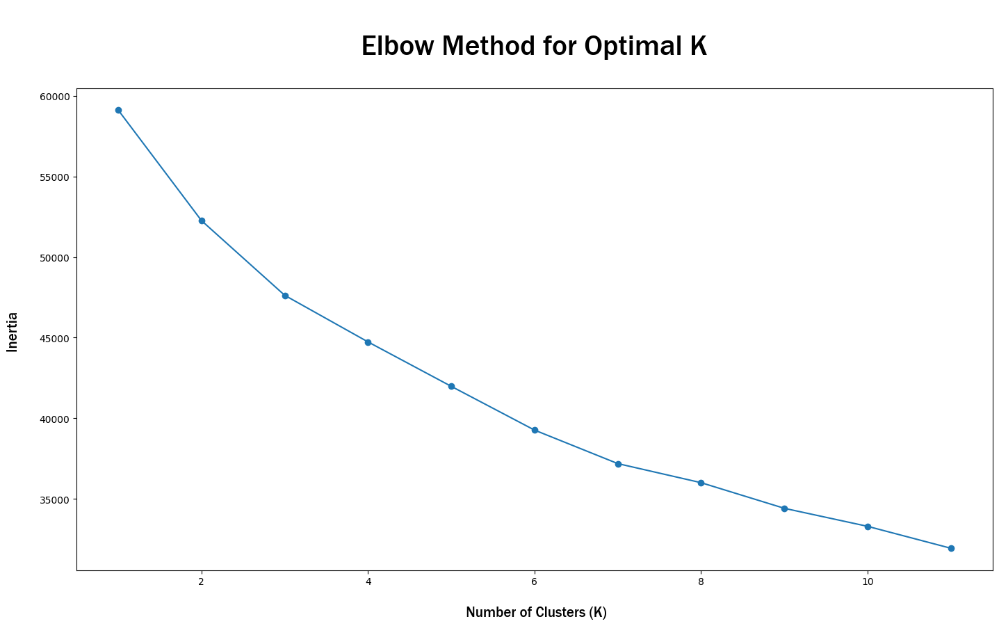

In [182]:

# Handle missing values
imputer = SimpleImputer(strategy='mean')
scaled_data_imputed = imputer.fit_transform(scaled_data)

# Apply KMeans
inertia_values = []
for k in range(1, 12):
    kmeans = KMeans(n_clusters=k, random_state=0)
    kmeans.fit(scaled_data_imputed)
    inertia_values.append(kmeans.inertia_)

# Plot the elbow method
plt.figure(figsize=(17, 9))
plt.plot(range(1, 12), inertia_values, marker='o')
plt.xlabel('\n Number of Clusters (K)', fontsize=15, fontname='Franklin Gothic Medium')
plt.ylabel('Inertia \n', fontsize=15, fontweight='bold', fontname='Franklin Gothic Medium')
plt.title('\n Elbow Method for Optimal K \n', fontsize=30, fontweight='bold', fontname='Franklin Gothic Medium')
plt.show()

In [183]:
# Check if there are still any NaN values after imputation
if np.isnan(scaled_data_imputed).any():
    # Handle remaining NaN values (e.g., drop rows with missing values)
    scaled_data_imputed = scaled_data_imputed[~np.isnan(scaled_data_imputed).any(axis=1)]

# Apply KMeans
optimal_k = 5
kmeans = KMeans(n_clusters=optimal_k, random_state=0)
cluster_labels = kmeans.fit_predict(scaled_data_imputed)

# Update cluster labels in the copy of humber_accidents
accidents_location_df_copy['cluster_label'] = kmeans.labels_


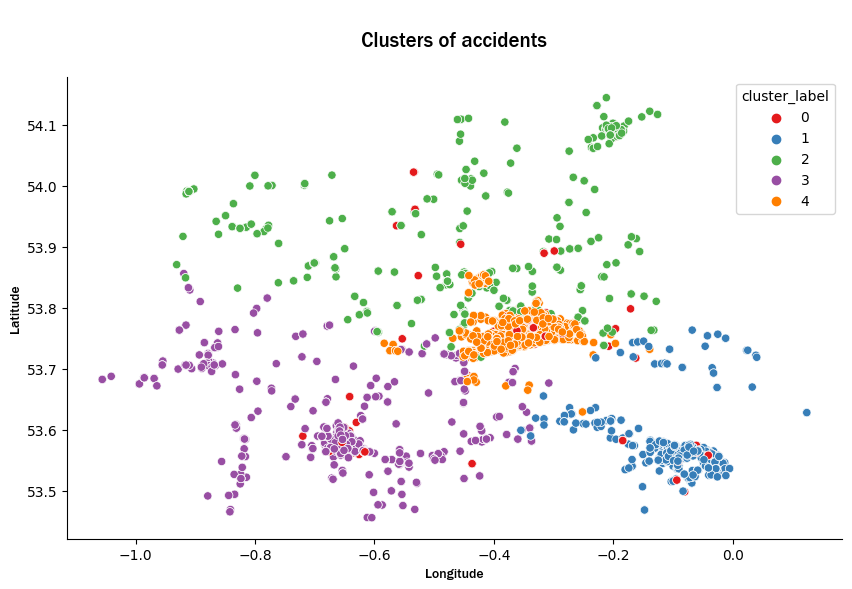

In [184]:
# Plot clusters on a scatterplot
plt.figure(figsize=(10, 6))
sns.scatterplot(data=accidents_location_df_copy, x='longitude', y='latitude', hue='cluster_label', palette='Set1')
plt.title('\n Clusters of accidents \n', fontsize=15, fontname='Franklin Gothic Medium')
plt.xlabel('Longitude', fontname='Franklin Gothic Medium')
plt.ylabel('Latitude', fontname='Franklin Gothic Medium')
sns.despine(top=True, right=True, left=False, bottom=False)
plt.show()


In [185]:
# Plot clusters on a map
location_accidents_map = folium.Map(location=[accidents_location_df_copy['latitude'].mean(), accidents_location_df_copy['longitude'].mean()], zoom_start=10)
cluster_group = folium.FeatureGroup(name='Cluster Group')

for cluster_label in range(4):
    cluster_data = accidents_location_df_copy[accidents_location_df_copy['cluster_label'] == cluster_label]
    for idx, row in cluster_data.iterrows():
        folium.CircleMarker(
            location=[row['latitude'], row['longitude']],
            radius=5,
            color='blue' if cluster_label == 0 else 'green' if cluster_label == 1 else 'red' if cluster_label == 2 else 'purple',
            fill=True,
            fill_color='blue' if cluster_label == 0 else 'green' if cluster_label == 1 else 'red' if cluster_label == 2 else 'purple'
        ).add_to(cluster_group)

cluster_group.add_to(location_accidents_map)
location_accidents_map

In [186]:


# Create a map centered around the mean location
map_center = [accidents_location_df_copy['latitude'].mean(), accidents_location_df_copy['longitude'].mean()]
accident_map = folium.Map(location=map_center, zoom_start=12)

# Add markers for each accident, colored by cluster
marker_cluster = MarkerCluster().add_to(accident_map)

for idx, row in accidents_location_df_copy.iterrows():
    folium.Marker(
        location=[row['latitude'], row['longitude']],
        icon=folium.Icon(color='blue', icon='info-sign'),
        popup=f"Cluster: {row['cluster_label']}"
    ).add_to(marker_cluster)

# Add markers for centroids
for centroid in kmeans.cluster_centers_:
    folium.Marker(
        location=[centroid[1], centroid[0]],
        icon=folium.Icon(color='red', icon='star'),
        popup="Centroid",
    ).add_to(accident_map)

# Save and display the map
accident_map.save("accidents_clusters_map.html")
accident_map


Text(0, 0.5, 'Weather Conditions')

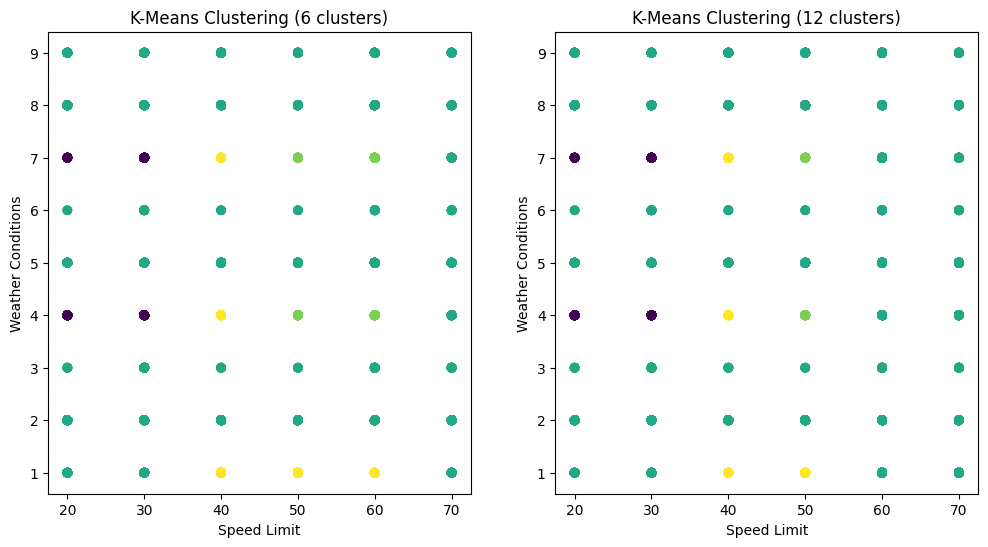

In [187]:
# Select the columns for k-means clustering (speed_limit and weather_conditions)
variables = accidents_df1[['speed_limit', 'weather_conditions']]

# Initialize KMeans with 6 clusters
kmeans_6_clusters = KMeans(n_clusters=6, random_state=42)
accidents_df1['cluster_6'] = kmeans_6_clusters.fit_predict(variables)

# Initialize KMeans with 12 clusters
kmeans_12_clusters = KMeans(n_clusters=12, random_state=42)
accidents_df1['cluster_12'] = kmeans_12_clusters.fit_predict(variables)

# Plot the results for 6 clusters
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.scatter(accidents_df1['speed_limit'], accidents_df1['weather_conditions'], c=accidents_df1['cluster_6'], cmap='viridis')
plt.title('K-Means Clustering (6 clusters)')
plt.xlabel('Speed Limit')
plt.ylabel('Weather Conditions')

# Plot the results for 12 clusters
plt.subplot(1, 2, 2)
plt.scatter(accidents_df1['speed_limit'], accidents_df1['weather_conditions'], c=accidents_df1['cluster_12'], cmap='viridis')
plt.title('K-Means Clustering (12 clusters)')
plt.xlabel('Speed Limit')
plt.ylabel('Weather Conditions')


# QUESTION 6: : Using outlier detection methods, identify unusual entries in your data set. Should you keep these entries in your data

- Using outlier detection methods, such as the Z-score or IQR, helps identify unusual entries in the dataset; whether to keep these entries depends on their relevance and potential impact on analysis, as they might indicate data errors or valuable anomalies.

In [188]:
accidents_df1

,accident_index,location_easting_osgr,location_northing_osgr,longitude,latitude,police_force,accident_severity,number_of_vehicles,number_of_casualties,date,...,light_conditions,weather_conditions,road_surface_conditions,special_conditions_at_site,carriageway_hazards,urban_or_rural_area,did_police_officer_attend_scene_of_accident,lsoa_of_accident_location,cluster_6,cluster_12
0,2020010219808,521389.0,175144.0,-0.254001,51.462262,1.000000,3,1,1,04/02/2020,...,1,9,9,0.0,0.0,1,3.0,E01004576,3,3
1,2020010220496,529337.0,176237.0,-0.139253,51.470327,1.000000,3,1,2,27/04/2020,...,1,1,1,0.0,0.0,1,1.0,E01003034,3,3
2,2020010228005,526432.0,182761.0,-0.178719,51.529614,1.000000,3,1,1,01/01/2020,...,4,1,2,0.0,0.0,1,1.0,E01004726,3,3
3,2020010228006,538676.0,184371.0,-0.001683,51.541210,1.000000,2,1,1,01/01/2020,...,4,1,1,0.0,0.0,1,1.0,E01003617,3,3
4,2020010228011,529324.0,181286.0,-0.137592,51.515704,1.000000,3,1,2,01/01/2020,...,4,1,1,0.0,0.0,1,1.0,E01004763,3,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
91194,2020991027064,343034.0,731654.0,-2.926320,56.473539,24.348042,2,2,1,12/08/2020,...,1,1,1,0.0,0.0,1,1.0,-1,3,3
91195,2020991029573,257963.0,658891.0,-4.267565,55.802353,24.348042,3,1,1,13/11/2020,...,1,1,1,0.0,0.0,1,2.0,-1,3,3
91196,2020991030297,383664.0,810646.0,-2.271903,57.186317,24.348042,2,2,1,15/04/2020,...,1,1,1,0.0,0.0,2,1.0,-1,5,3
91197,2020991030900,277161.0,674852.0,-3.968753,55.950940,24.348042,3,2,1,15/12/2020,...,1,1,1,0.0,0.0,1,2.0,-1,3,3


In [189]:
# Drop non-numeric columns (excluding 'time' and 'accident_index')
non_numeric_cols_to_drop = ~accidents_df1.columns.isin(['time', 'accident_index'])
accidents_df_dropped = accidents_df1.drop(columns=accidents_df1.columns[non_numeric_cols_to_drop])


In [190]:
# Setting up an Isolation Forest model for outlier detection, configured with 100 base estimators and a contamination level of 30%.
outlier_detection=IsolationForest(n_estimators=100,max_samples='auto',contamination=0.40,random_state=42)

In [191]:
# Identify non-numeric columns (excluding 'time' and 'accident_index')
non_numeric_cols_to_drop = []
for col in accidents_df1.columns:
    if col != 'time' and col != 'accident_index' and not pd.api.types.is_numeric_dtype(accidents_df1[col]):
        non_numeric_cols_to_drop.append(col)

# Drop non-numeric columns
accidents_df_dropped = accidents_df1.drop(columns=non_numeric_cols_to_drop)


In [192]:
from scipy import stats

# Calculate z-scores for numerical columns
z_scores = stats.zscore(accidents_df_dropped.select_dtypes(include='number'))

# Define threshold for outlier detection
threshold = 3

# Identify outliers using z-score method
outlier_indices_z_score = (abs(z_scores) > threshold).any(axis=1)

# Print indices of rows containing outliers detected by z-score method
print("Indices of rows containing outliers (Z-score method):", accidents_df_dropped.index[outlier_indices_z_score])

# Calculate IQR for numerical columns
Q1 = accidents_df_dropped.select_dtypes(include='number').quantile(0.25)
Q3 = accidents_df_dropped.select_dtypes(include='number').quantile(0.75)
IQR = Q3 - Q1

# Identify outliers using IQR method
outlier_indices_IQR = ((accidents_df_dropped.select_dtypes(include='number') < (Q1 - 1.5 * IQR)) | (accidents_df_dropped.select_dtypes(include='number') > (Q3 + 1.5 * IQR))).any(axis=1)

# Print indices of rows containing outliers detected by IQR method
print("Indices of rows containing outliers (IQR method):", accidents_df_dropped.index[outlier_indices_IQR])


Indices of rows containing outliers (Z-score method): Int64Index([    0,    11,    12,    15,    33,    37,    50,    54,    68,
               75,
            ...
            91178, 91179, 91181, 91183, 91184, 91189, 91190, 91193, 91194,
            91196],
           dtype='int64', length=13829)
Indices of rows containing outliers (IQR method): Int64Index([    0,     1,     3,     4,     5,     7,     8,    10,    11,
               12,
            ...
            91187, 91188, 91189, 91190, 91191, 91192, 91193, 91194, 91196,
            91198],
           dtype='int64', length=58776)


In [193]:
outlier_indices_IQR 

0         True
1         True
2        False
3         True
4         True
         ...  
91194     True
91195    False
91196     True
91197    False
91198     True
Length: 91199, dtype: bool

In [194]:

# Create an Isolation Forest model
isolation_forest = IsolationForest(contamination=0.01)  # Adjust the contamination parameter as needed

# Fit the model to the data and predict outliers
isolation_forest.fit(accidents_df_dropped.select_dtypes(include='number'))
outlier_predictions = isolation_forest.predict(accidents_df_dropped.select_dtypes(include='number'))

# Get the indices of outliers (where the prediction is -1)
outlier_indices_isolation_forest = accidents_df_dropped.index[outlier_predictions == -1]

# Print indices of rows containing outliers detected by Isolation Forest
print("Indices of rows containing outliers (Isolation Forest method):", outlier_indices_isolation_forest)


Indices of rows containing outliers (Isolation Forest method): Int64Index([  305,   583,   584,   678,   684,   690,   722,   742,   747,
              864,
            ...
            91142, 91146, 91157, 91162, 91167, 91173, 91177, 91181, 91183,
            91193],
           dtype='int64', length=912)


In [195]:
# Get the subset of the DataFrame containing outliers
outliers_df = accidents_df_dropped.loc[outlier_indices_isolation_forest]



In [196]:
outlier_indices = [154, 305, 447, 462, 583, 584, 594, 630, 678, 684, 90853, 90921, 90923, 90946, 90947, 90969, 90975, 91049, 91069, 91146]

# Subset the original DataFrame using the outlier indices
outliers_df = accidents_df1.iloc[outlier_indices]

# Display the columns of the DataFrame containing the outliers
print(outliers_df.columns)

Index(['accident_index', 'location_easting_osgr', 'location_northing_osgr',
       'longitude', 'latitude', 'police_force', 'accident_severity',
       'number_of_vehicles', 'number_of_casualties', 'date', 'day_of_week',
       'time', 'local_authority_district', 'local_authority_ons_district',
       'first_road_number', 'road_type', 'speed_limit', 'junction_detail',
       'junction_control', 'second_road_class',
       'pedestrian_crossing_human_control',
       'pedestrian_crossing_physical_facilities', 'light_conditions',
       'weather_conditions', 'road_surface_conditions',
       'special_conditions_at_site', 'carriageway_hazards',
       'urban_or_rural_area', 'did_police_officer_attend_scene_of_accident',
       'lsoa_of_accident_location', 'cluster_6', 'cluster_12'],
      dtype='object')


In [197]:
# Assuming outlier_indices contains the indices of rows identified as outliers
outlier_indices = [154, 305, 447, 462, 583, 584, 594, 630, 678, 684, 90853, 90921, 90923, 90946, 90947, 90969, 90975, 91049, 91069, 91146]

# Assuming your DataFrame is named df
# Select numerical columns to examine for outliers
numerical_columns = accidents_df1.select_dtypes(include=['int64', 'float64']).columns

### Visualization of impact of outlier on longitude and latitude

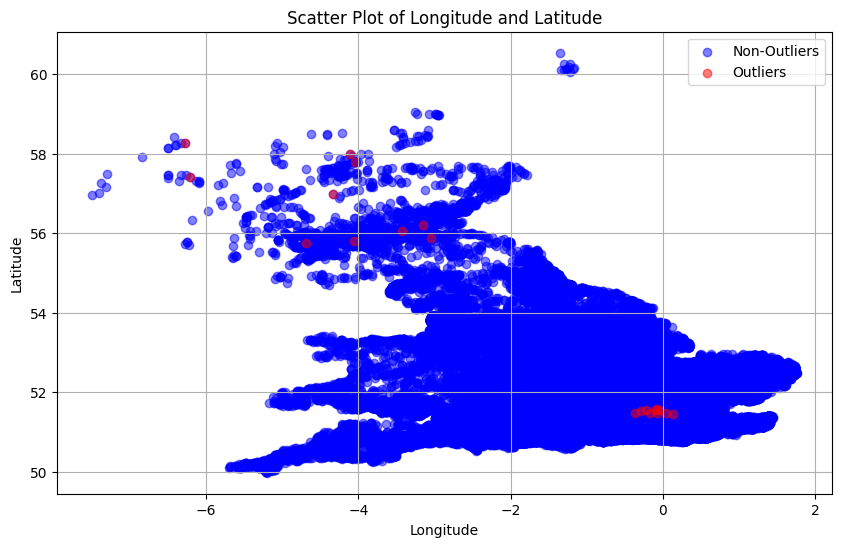

In [198]:
# Filter longitude and latitude columns
longitude = accidents_df_dropped['longitude']
latitude = accidents_df_dropped['latitude']

# Create scatter plot for longitude and latitude
plt.figure(figsize=(10, 6))

# Plot all data points in blue
plt.scatter(longitude, latitude, color='blue', alpha=0.5, label='Non-Outliers')

# Filter outliers and plot them in red
outlier_longitude = outliers_df['longitude']
outlier_latitude = outliers_df['latitude']
plt.scatter(outlier_longitude, outlier_latitude, color='red', alpha=0.5, label='Outliers')

plt.title('Scatter Plot of Longitude and Latitude')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.legend()  # Show legend with labels for outliers and non-outliers
plt.grid(True)

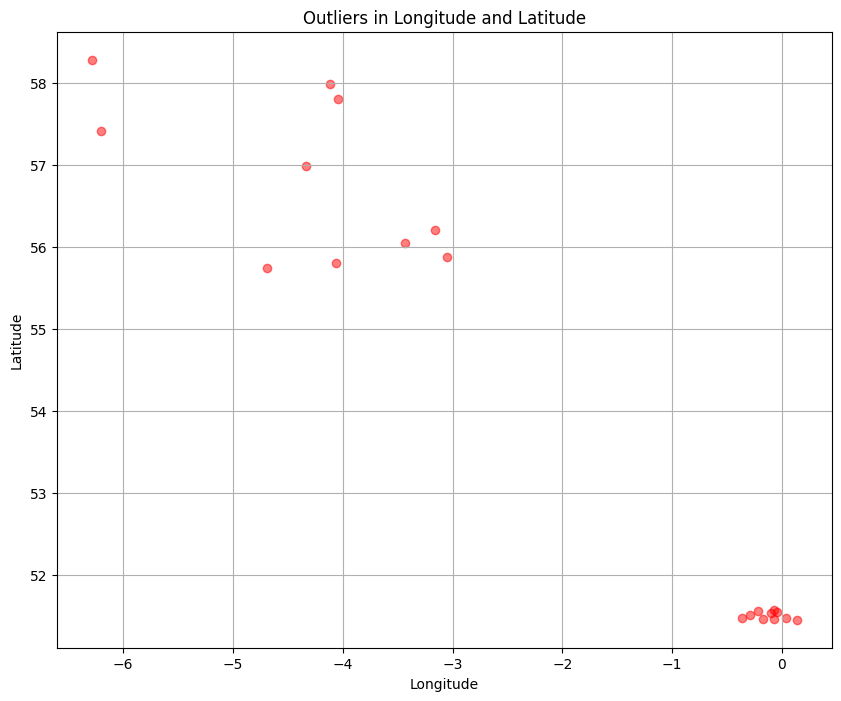

In [199]:

# Define the center of the map
map_center = [outliers_df['latitude'].mean(), outliers_df['longitude'].mean()]

# Create a scatter plot for outliers
plt.figure(figsize=(10, 8))
plt.scatter(outliers_df['longitude'], outliers_df['latitude'], color='red', alpha=0.5, label='Outliers')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('Outliers in Longitude and Latitude')
plt.grid(True)

# Show the map
mymap = folium.Map(location=map_center, zoom_start=10, tiles='OpenStreetMap')
for index, row in outliers_df.iterrows():
    folium.CircleMarker(location=[row['latitude'], row['longitude']], radius=5, color='red', fill=True, fill_color='red').add_to(mymap)
    folium.Marker(location=[row['latitude'], row['longitude']], icon=None, popup='Outlier').add_to(mymap)

# Convert the map to HTML
mymap.save('map.html')

# Show the scatter plot
plt.show()

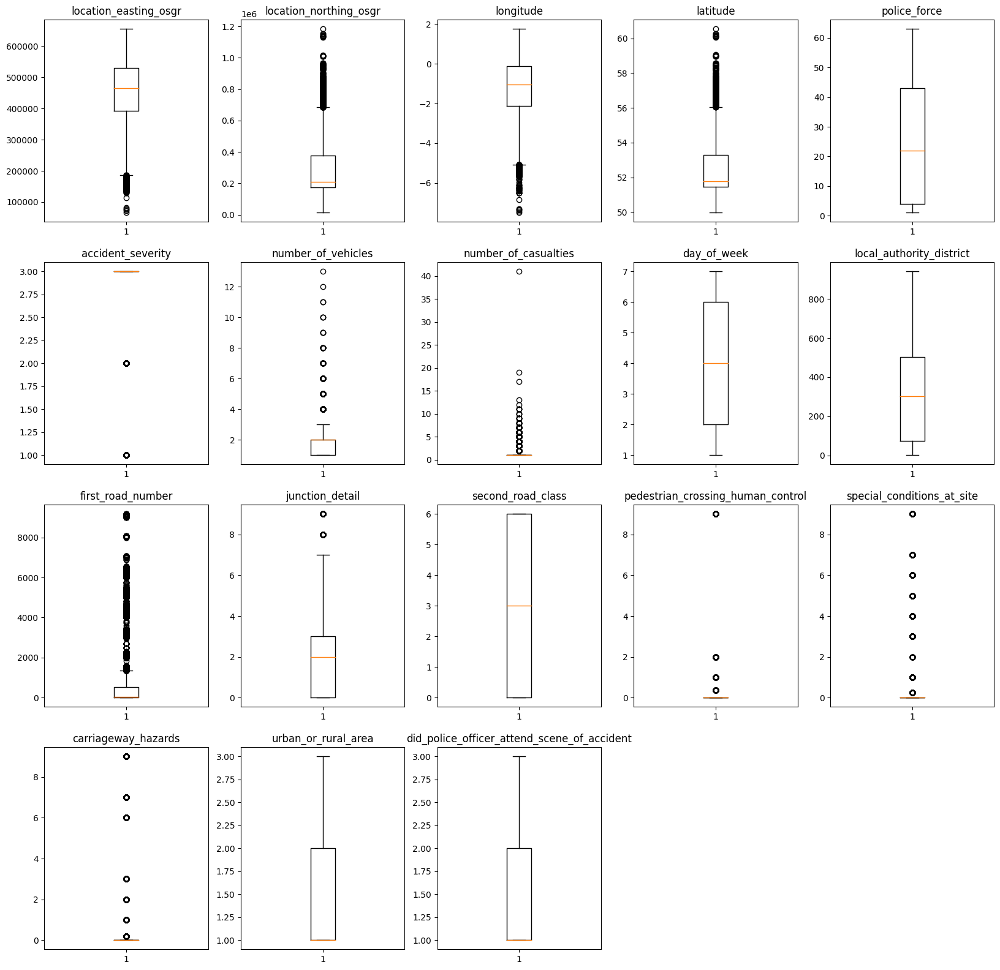

In [200]:
# outlier detection using boxplot
plt.figure(figsize=(20,30))
 
for i, variable in enumerate(numerical_columns):
    plt.subplot(6, 5, i + 1)
    plt.boxplot(accidents_df1[variable])
    plt.title(variable)
plt.savefig("Outliers boxplot.png")
plt.show()

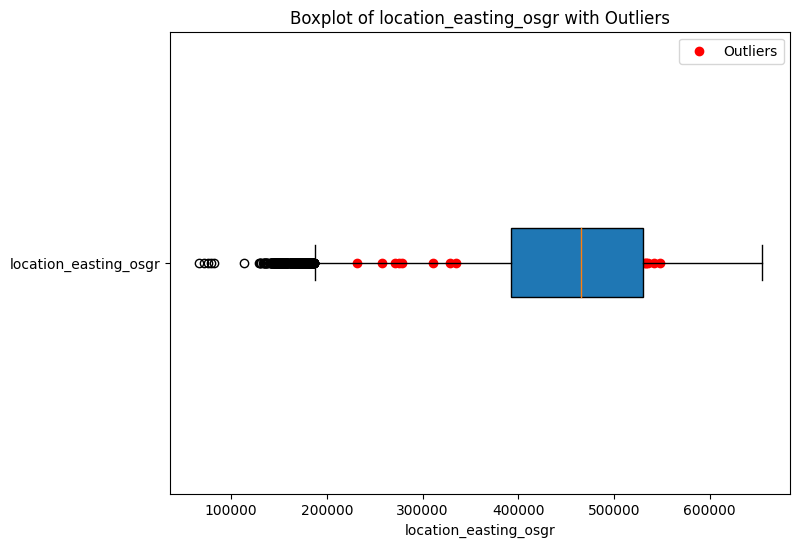

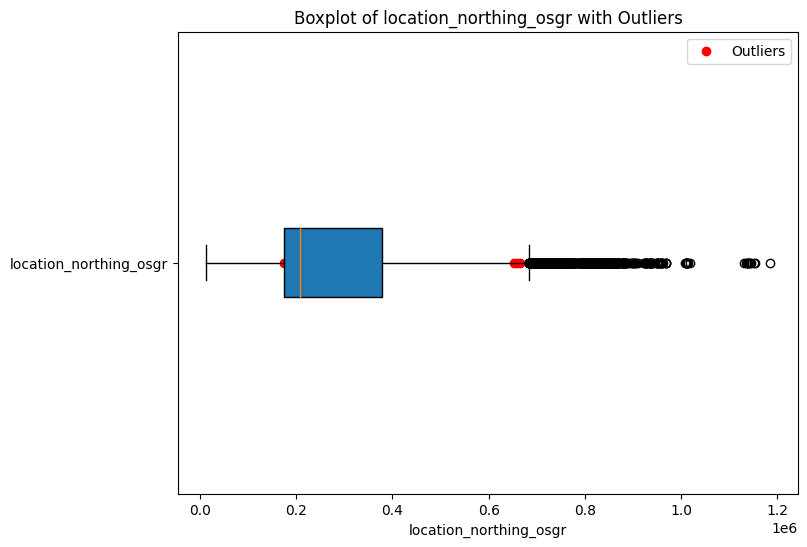

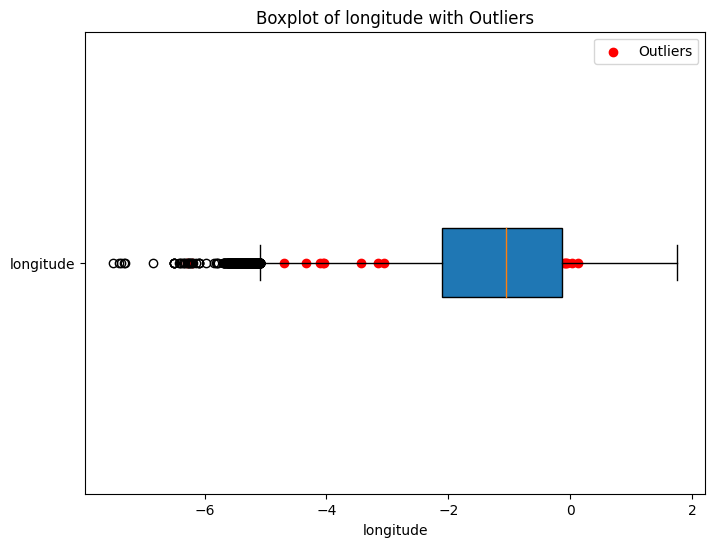

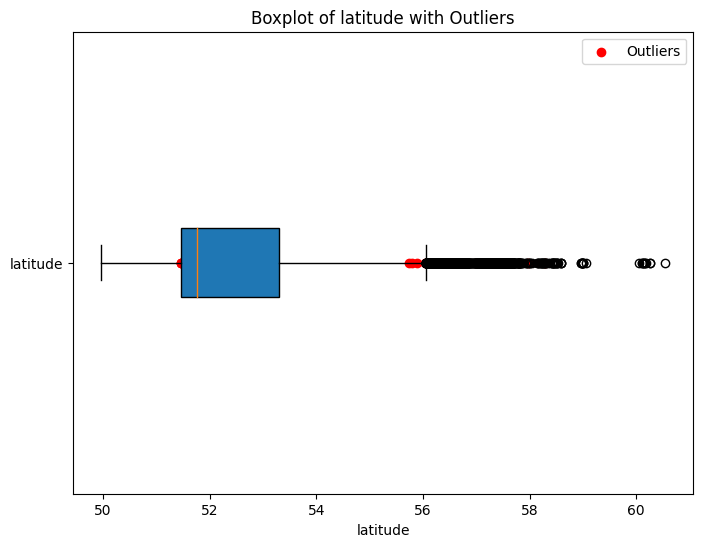

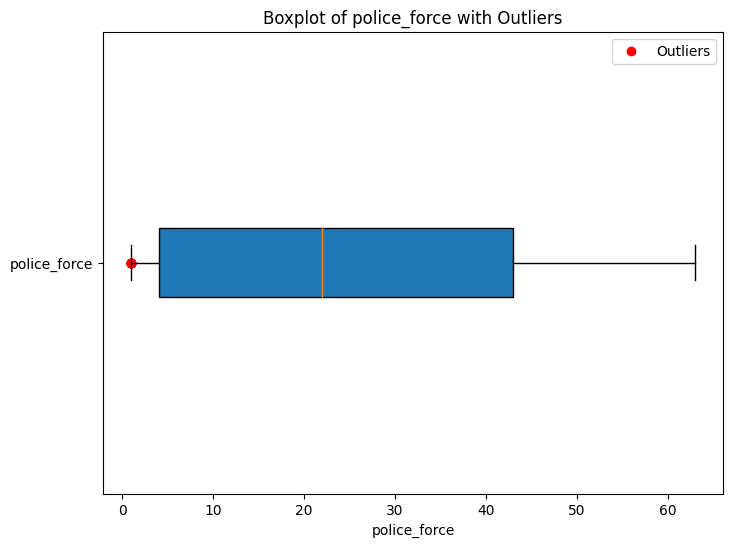

...

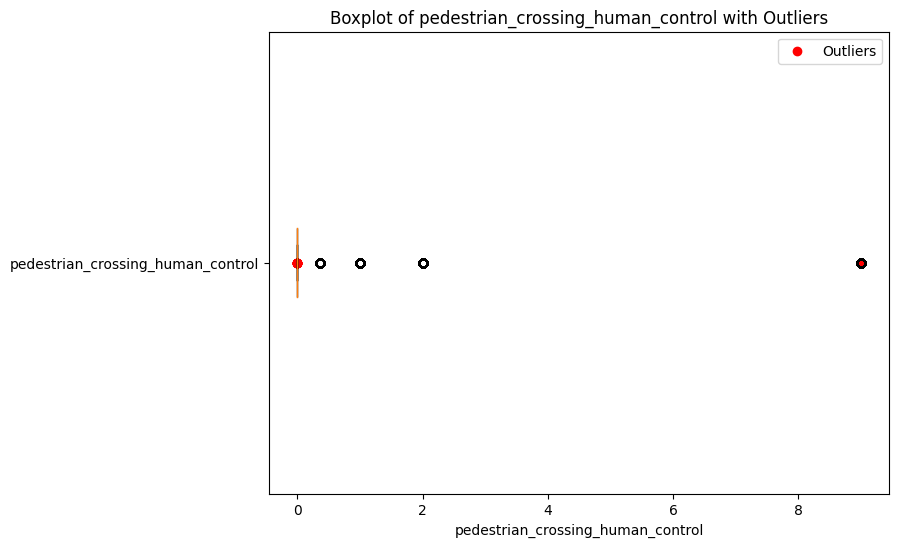

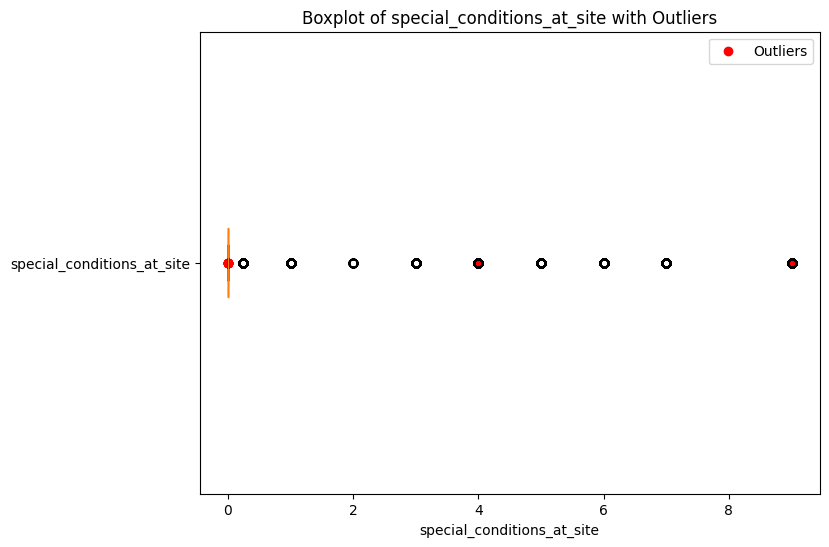

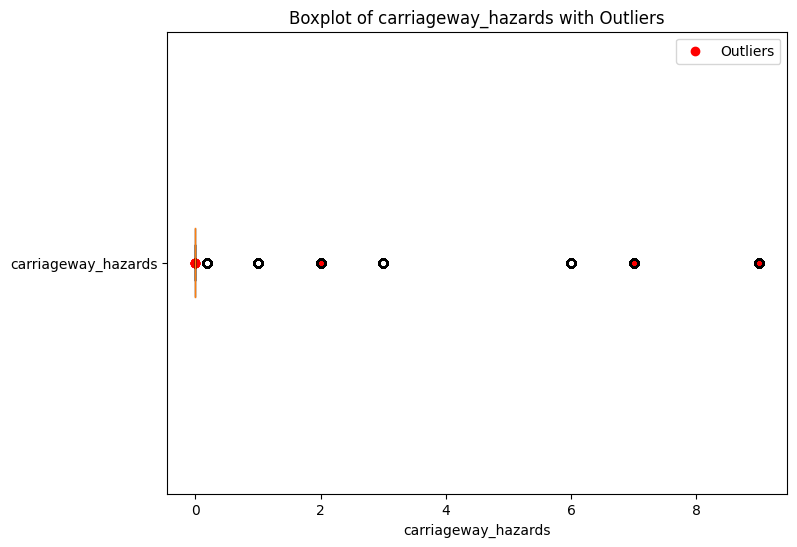

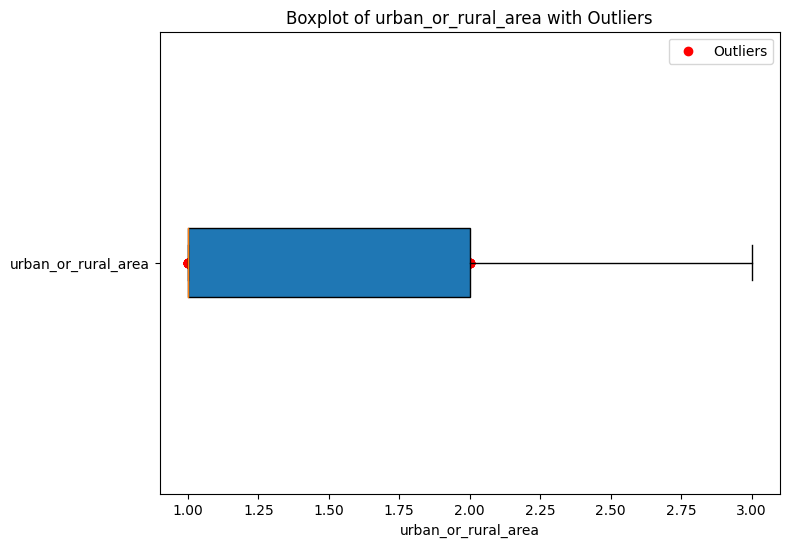

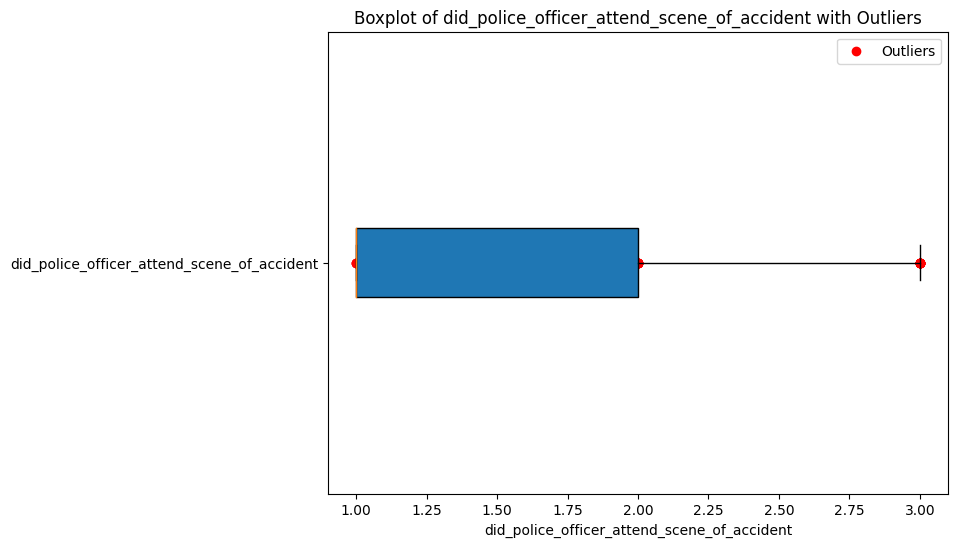

In [201]:

# Assuming outlier_indices contains the indices of rows identified as outliers
outlier_indices = [154, 305, 447, 462, 583, 584, 594, 630, 678, 684, 90853, 90921, 90923, 90946, 90947, 90969, 90975, 91049, 91069, 91146]

# Assuming your DataFrame is named df
# Select numerical columns to examine for outliers
numerical_columns = accidents_df1.select_dtypes(include=['int64', 'float64']).columns

# Plot boxplots for each numerical column
for column in numerical_columns:
    plt.figure(figsize=(8, 6))
    plt.boxplot(accidents_df1[column], vert=False, patch_artist=True, labels=[column])
    plt.scatter(accidents_df1.loc[outlier_indices, column], [1] * len(outlier_indices), color='red', label='Outliers')
    plt.xlabel(column)
    plt.title(f'Boxplot of {column} with Outliers')
    plt.legend()
    plt.show()


## Treatment of outliers

In [202]:
# Treating outliers for the numerical columns
def treat_outliers(data, col):
    # lower (25th) quartile
    Q1 = data[col].quantile(0.25) 
    # upper (75th) quartile
    Q3 = data[col].quantile(0.75)   
    IQR = Q3 - Q1
    lower_whisker = Q1 - (1.5 * IQR)
    upper_whisker = Q3 + (1.5 * IQR)
    data[col] = np.clip(data[col], lower_whisker, upper_whisker)
    return data
 
def treat_outliers_all(data, col_list):
    for c in col_list:
        data = treat_outliers(data, c)
    return data
 


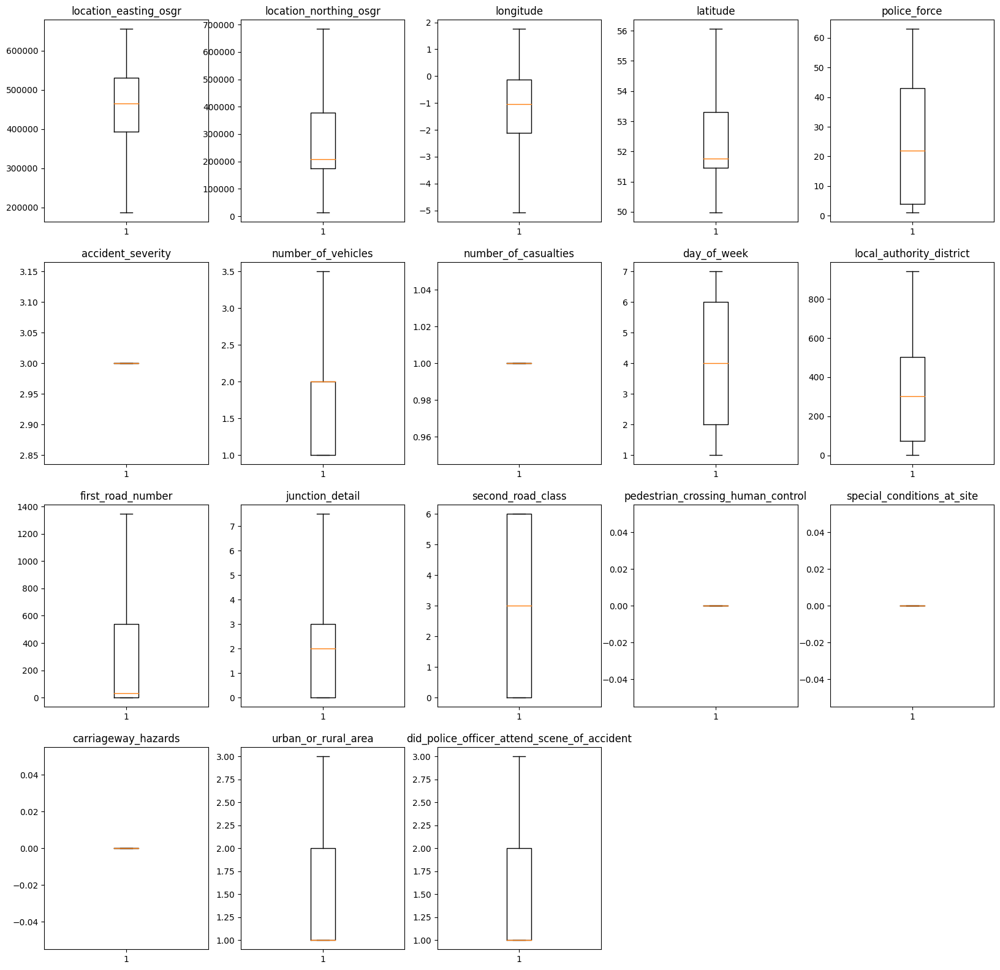

In [203]:
treat_outliers_all(accidents_df1, numerical_columns)

# Outlier treatment using boxplot
plt.figure(figsize=(20,30))
for i, variable in enumerate(numerical_columns):
    plt.subplot(6, 5, i + 1)
    plt.boxplot(accidents_df1[variable])
    plt.title(variable)
plt.savefig("Outliers_treatment_boxplot.png")
plt.show()


# PREDICTION

# 7 Classification model using the provided data that accurately predicts fatal injuries sustained in road traffic accidents, with the aim of informing and improving road safety measures.

- Prediction in this context is Accident Severity Prediction Modeling for Road Safety:The accident severity levels is mapped to 'Fatal' and 'Non-Fatal' categories based on the severity values in the accident_severity column. This transformation prepares the data for building a classification model to predict fatal injuries and enhance road safety measures.

In [204]:
# Assuming 'accident_severity' column exists in your DataFrame

# Assigning a mapping where severity level-1 is labeled as 'Fatal' and severity levels-2 and -3 are categorized as 'Non-Fatal'.
severity_mapping = {1: 'Fatal', 2: 'Non-Fatal', 3: 'Non-Fatal'}

# Replace values in 'accident_severity' column
accidents_df['accident_severity'] = accidents_df['accident_severity'].replace(severity_mapping)



In [205]:
# Display the updated DataFrame
accidents_df1


,accident_index,location_easting_osgr,location_northing_osgr,longitude,latitude,police_force,accident_severity,number_of_vehicles,number_of_casualties,date,...,light_conditions,weather_conditions,road_surface_conditions,special_conditions_at_site,carriageway_hazards,urban_or_rural_area,did_police_officer_attend_scene_of_accident,lsoa_of_accident_location,cluster_6,cluster_12
0,2020010219808,521389.0,175144.00,-0.254001,51.462262,1.000000,3,1.0,1,04/02/2020,...,1,9,9,0.0,0.0,1,3.0,E01004576,3,3
1,2020010220496,529337.0,176237.00,-0.139253,51.470327,1.000000,3,1.0,1,27/04/2020,...,1,1,1,0.0,0.0,1,1.0,E01003034,3,3
2,2020010228005,526432.0,182761.00,-0.178719,51.529614,1.000000,3,1.0,1,01/01/2020,...,4,1,2,0.0,0.0,1,1.0,E01004726,3,3
3,2020010228006,538676.0,184371.00,-0.001683,51.541210,1.000000,3,1.0,1,01/01/2020,...,4,1,1,0.0,0.0,1,1.0,E01003617,3,3
4,2020010228011,529324.0,181286.00,-0.137592,51.515704,1.000000,3,1.0,1,01/01/2020,...,4,1,1,0.0,0.0,1,1.0,E01004763,3,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
91194,2020991027064,343034.0,684055.75,-2.926320,56.057372,24.348042,3,2.0,1,12/08/2020,...,1,1,1,0.0,0.0,1,1.0,-1,3,3
91195,2020991029573,257963.0,658891.00,-4.267565,55.802353,24.348042,3,1.0,1,13/11/2020,...,1,1,1,0.0,0.0,1,2.0,-1,3,3
91196,2020991030297,383664.0,684055.75,-2.271903,56.057372,24.348042,3,2.0,1,15/04/2020,...,1,1,1,0.0,0.0,2,1.0,-1,5,3
91197,2020991030900,277161.0,674852.00,-3.968753,55.950940,24.348042,3,2.0,1,15/12/2020,...,1,1,1,0.0,0.0,1,2.0,-1,3,3


In [206]:
# Features (all columns except 'accident_severity')
X = accidents_df.drop('accident_severity', axis=1)

# Target variable ('accident_severity' column)
y = accidents_df['accident_severity']


In [207]:
Y=accidents_df1['accident_severity']
Y.value_counts()

3    91199
Name: accident_severity, dtype: int64

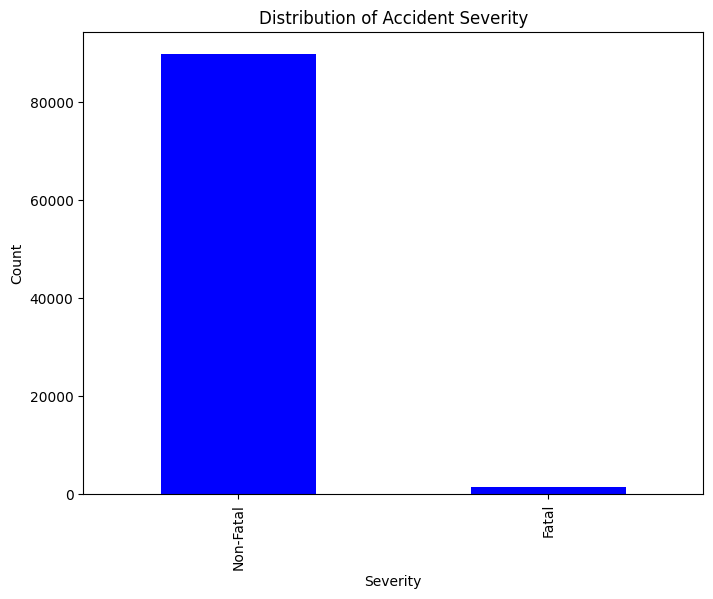

In [208]:

# Get the value counts of accident_severity
severity_counts = accidents_df['accident_severity'].value_counts()

# Plot the value counts
plt.figure(figsize=(8, 6))
severity_counts.plot(kind='bar', color='blue')

# labels and title
plt.title('Distribution of Accident Severity')
plt.xlabel('Severity')
plt.ylabel('Count')

# Show plot
plt.show()

In [209]:
# Under-sampling to handle class imbalance
rus = RandomUnderSampler(random_state=42)
X_res, y_res = rus.fit_resample(X, y)


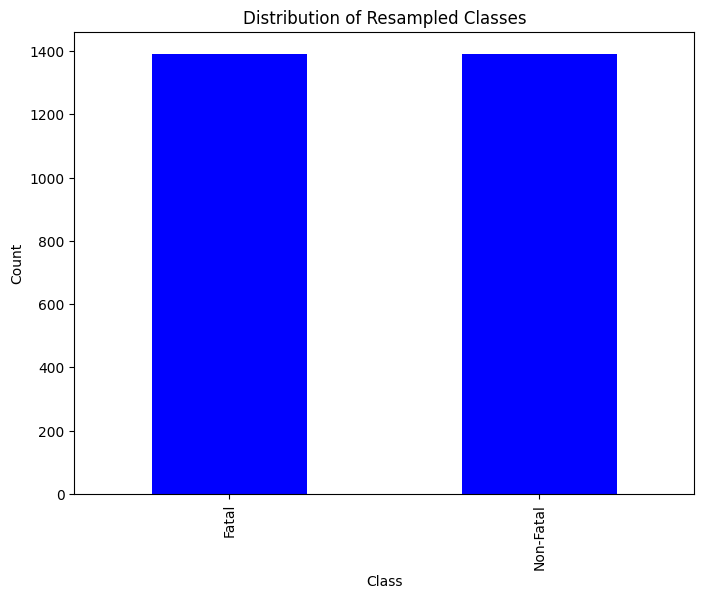

In [210]:
# Get the value counts of y_res
resampled_counts = y_res.value_counts()

# Plot the value counts
plt.figure(figsize=(8, 6))
resampled_counts.plot(kind='bar', color='blue')

# labels and title
plt.title('Distribution of Resampled Classes')
plt.xlabel('Class')
plt.ylabel('Count')

# Show plot
plt.show()

In [211]:

# Selecting non-numeric columns for encoding
categorical_columns = ['accident_severity', 'local_authority_ons_district', 'road_type', 
                       'junction_control', 'pedestrian_crossing_physical_facilities', 
                       'light_conditions', 'weather_conditions', 'road_surface_conditions', 
                       'lsoa_of_accident_location']

# Creating a copy of the DataFrame to avoid modifying the original DataFrame
encoded_df = accidents_df1.copy()

# One-hot encoding categorical variables
encoder = OneHotEncoder(sparse=True, drop='first')  # Use sparse matrix
encoded_columns = encoder.fit_transform(encoded_df[categorical_columns])

# Concatenate the encoded columns with the original DataFrame
encoded_df = pd.concat([encoded_df.drop(columns=categorical_columns), 
                        pd.DataFrame(encoded_columns)], axis=1)

In [212]:
# Check for non-numeric values in the feature matrix
non_numeric_values = X_res.apply(pd.to_numeric, errors='coerce').isna().sum()

# Display columns with non-numeric values
columns_with_non_numeric_values = non_numeric_values[non_numeric_values > 0]
print("Columns with non-numeric values:")
columns_with_non_numeric_values


Columns with non-numeric values:


accident_index                   338
accident_reference               338
date                            2782
time                            2782
local_authority_ons_district    2782
local_authority_highway         2782
lsoa_of_accident_location       2595
weekday                         2782
dtype: int64

In [213]:
# Filter out non-numeric columns from X_res
numeric_columns = X_res.select_dtypes(include=['number']).columns
X_res_numeric = X_res[numeric_columns]

# Standard Scaling
scaler = StandardScaler()
X_res_scaled = scaler.fit_transform(X_res_numeric)


## Randon Forest Classifier model

- In accident data, a Random Forest Classifier predicts outcomes such as accident severity by combining multiple decision trees to enhance accuracy and robustness in handling diverse features like road conditions, weather, and driver behavior

In [214]:
# Feature Selection using Random Forests
rf = RandomForestClassifier(random_state=42)
rf.fit(X_res_scaled, y_res)
importances = rf.feature_importances_
indices = np.argsort(importances)[::-1]

# Selecting top 10 features
top_10_features = indices[:10]
X_res_scaled_top10 = X_res_scaled[:, top_10_features]

In [215]:
top_10_features 

array([ 4,  2,  9,  1, 21,  3, 11,  6, 18,  5], dtype=int64)

In [216]:
X_res_scaled_top10

array([[-0.66609567, -0.66004637, -1.3067971 , ..., -0.95691808,
         1.09349804, -1.17333834],
       [-0.76899171, -0.77003777, -1.26830582, ..., -0.95691808,
         1.09349804, -1.17333834],
       [-0.69638853, -0.69725159, -1.26445669, ...,  0.25259855,
        -0.91449638, -1.17333834],
       ...,
       [ 0.00200224,  0.00361457,  0.15202259, ...,  0.25259855,
        -0.91449638,  0.12953223],
       [ 0.27942764,  0.27283794, -0.37530801, ...,  0.25259855,
         1.09349804, -0.40694389],
       [ 0.63194192,  0.62622338, -0.95267728, ...,  0.25259855,
         1.09349804, -0.98173973]])

In [217]:
# Hyperparameter tuning using Grid Search
param_grid = {
    'n_estimators': [300],
    'max_depth': [15],
    'min_samples_split': [2],
    'criterion': ['gini']
}
grid_search = GridSearchCV(RandomForestClassifier(random_state=42), param_grid, cv=5)
grid_search.fit(X_res_scaled_top10, y_res)

# Best model
best_rf = grid_search.best_estimator_


In [218]:
best_rf

RandomForestClassifier(max_depth=15, n_estimators=300, random_state=42)

In [219]:
# Train-test split
X_train, X_test, y_train, y_test = train_test_split(X_res_scaled_top10, y_res, test_size=0.2, random_state=42)
best_rf.fit(X_train, y_train)
y_pred = best_rf.predict(X_test)

# Evaluation
print("Classification Report:\n", classification_report(y_test, y_pred))
print("Confusion Matrix:\n", confusion_matrix(y_test, y_pred))


Classification Report:
               precision    recall  f1-score   support

       Fatal       0.67      0.70      0.68       277
   Non-Fatal       0.69      0.66      0.67       280

    accuracy                           0.68       557
   macro avg       0.68      0.68      0.68       557
weighted avg       0.68      0.68      0.68       557

Confusion Matrix:
 [[194  83]
 [ 96 184]]


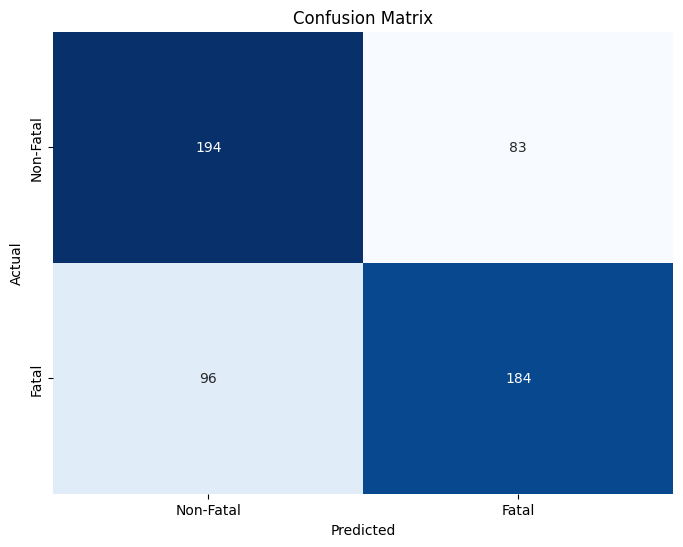

In [220]:

# Calculate confusion matrix
conf_matrix = confusion_matrix(y_test, y_pred)

# Plot confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues", cbar=False, 
            xticklabels=['Non-Fatal', 'Fatal'], yticklabels=['Non-Fatal', 'Fatal'])
plt.title('Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()


In [221]:
# Cross-validation scores
cv_scores = cross_val_score(best_rf, X_res_scaled_top10, y_res, cv=5)
print("Cross-validation Scores:", cv_scores)
print("Mean CV Score:", np.mean(cv_scores))


Cross-validation Scores: [0.35008977 0.31238779 0.35611511 0.35611511 0.30755396]
Mean CV Score: 0.33645234620203296


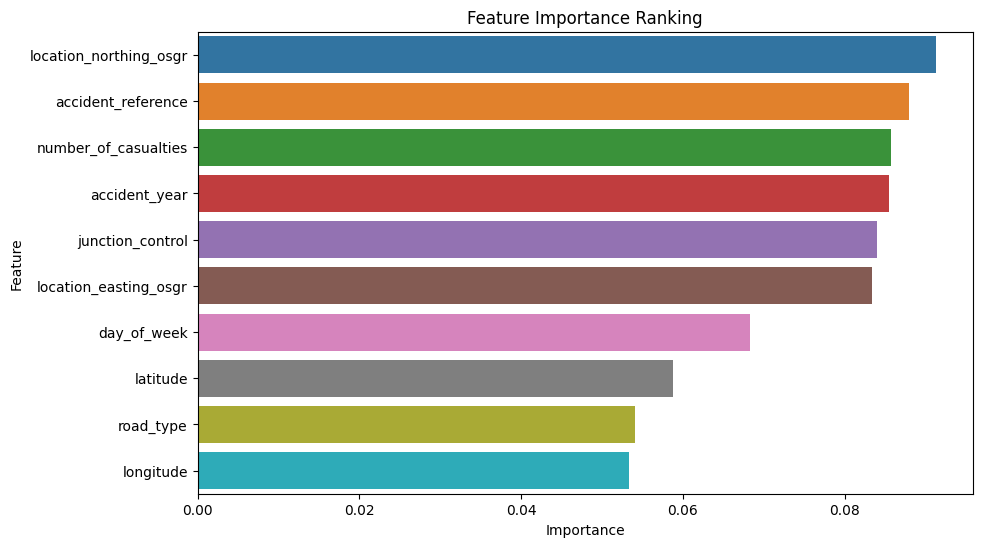

In [222]:
# Feature importance plot
plt.figure(figsize=(10, 6))
sns.barplot(x=importances[indices][:10], y=[X.columns[i] for i in top_10_features])
plt.title('Feature Importance Ranking')
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.show()


## XG Boost model

- In accident data, an XGBoost model is used to predict outcomes like accident severity by leveraging an ensemble of decision trees to improve accuracy and handle complex interactions between features such as road conditions, weather, and vehicle types.

In [223]:

# Initialize LabelEncoder
label_encoder = LabelEncoder()

# Fit and transform the target variable y_res
y_res_encoded = label_encoder.fit_transform(y_res)

# Initialize the XGBoost classifier
xgb_classifier = XGBClassifier()

# Fit the classifier on the training data
xgb_classifier.fit(X_res_scaled, y_res_encoded)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=None, n_jobs=None,
              num_parallel_tree=None, random_state=None, ...)

In [224]:

# Define XGBoost classifier
xgb_classifier = xgb.XGBClassifier()

# Fit the classifier on the training data
xgb_classifier.fit(X_res_scaled, y_res_encoded)


XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=None, n_jobs=None,
              num_parallel_tree=None, random_state=None, ...)

In [225]:
param_grid = {
    'n_estimators': [100, 200, 300],
    'max_depth': [3, 5, 7],
    'learning_rate': [0.1, 0.01, 0.001]
}
grid_search = GridSearchCV(XGBClassifier(random_state=42), param_grid, cv=5)
grid_search.fit(X_res_scaled_top10, y_res_encoded)


GridSearchCV(cv=5,
             estimator=XGBClassifier(base_score=None, booster=None,
                                     callbacks=None, colsample_bylevel=None,
                                     colsample_bynode=None,
                                     colsample_bytree=None, device=None,
                                     early_stopping_rounds=None,
                                     enable_categorical=False, eval_metric=None,
                                     feature_types=None, gamma=None,
                                     grow_policy=None, importance_type=None,
                                     interaction_constraints=None,
                                     learning_rate=None,...one,
                                     max_cat_threshold=None,
                                     max_cat_to_onehot=None,
                                     max_delta_step=None, max_depth=None,
                                     max_leaves=None, min_child_weight=None,
                                     missing=nan, monotone_constraints=None,
                                     multi_strategy=None, n_estimators=None,
                                     n_jobs=None, num_parallel_tree=None,
                                     random_state=42, ...),
             param_grid={'learning_rate': [0.1, 0.01, 0.001],
                         'max_depth': [3, 5, 7],
                         'n_estimators': [100, 200, 300]})

In [226]:
best_xgb = grid_search.best_estimator_


In [227]:
y_true = y_test

In [228]:

label_encoder = LabelEncoder()


In [229]:
y_true_encoded = label_encoder.fit_transform(y_true)


In [230]:
y_pred_encoded = label_encoder.transform(y_pred)


In [231]:

# Instantiate the LabelEncoder
label_encoder = LabelEncoder()

# fitting the LabelEncoder on y_train
label_encoder.fit(y_train)


LabelEncoder()

In [232]:
# Transform training labels
y_train_encoded = label_encoder.transform(y_train)

# Transform test labels
y_test_encoded = label_encoder.transform(y_test)

In [233]:
# Reverse encoding to get original labels for y_pred
y_pred = label_encoder.inverse_transform(y_pred_encoded)  # Decode the predicted labels

# Reverse encoding to get original labels for y_true
y_true = label_encoder.inverse_transform(y_test_encoded)  # Decode the true labels

# Print classification report
print("Classification Report:\n", classification_report(y_true, y_pred))

Classification Report:
               precision    recall  f1-score   support

       Fatal       0.67      0.70      0.68       277
   Non-Fatal       0.69      0.66      0.67       280

    accuracy                           0.68       557
   macro avg       0.68      0.68      0.68       557
weighted avg       0.68      0.68      0.68       557



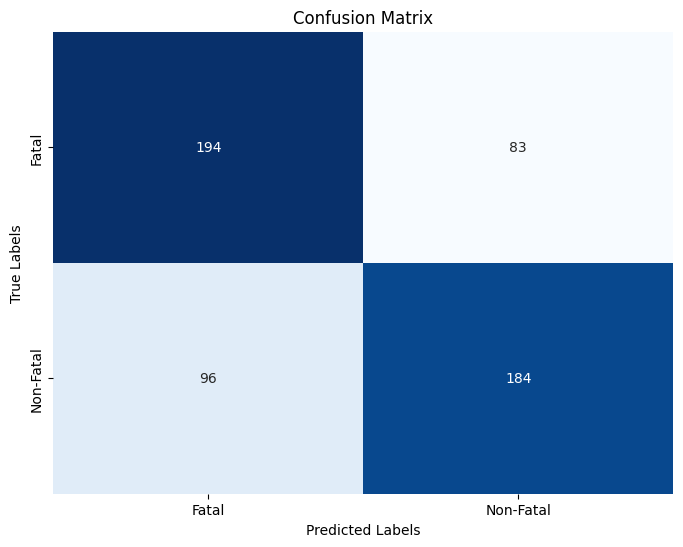

In [234]:
# Compute confusion matrix
conf_matrix = confusion_matrix(y_true, y_pred)

# Get unique class labels
unique_labels = np.unique(np.concatenate((y_true, y_pred)))

# Plot confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', cbar=False, xticklabels=unique_labels, yticklabels=unique_labels)
plt.title('Confusion Matrix')
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.show()

In [235]:
xgb_model = xgb.XGBClassifier()


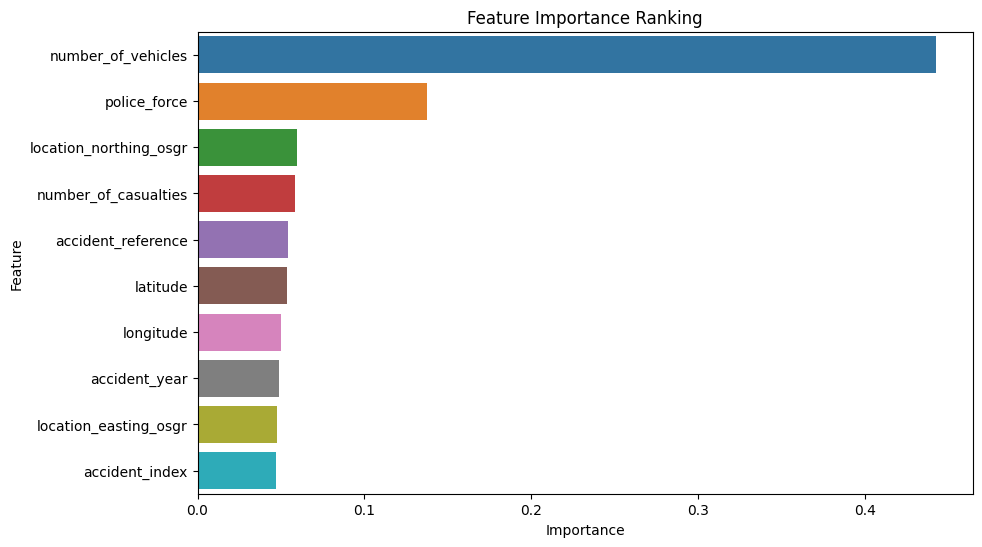

In [236]:
# Fit the XGBoost model
xgb_model.fit(X_res_scaled_top10, y_res_encoded)

# Assuming your XGBoost model is named 'xgb_model'
feature_importances = xgb_model.feature_importances_
indices = feature_importances.argsort()[::-1]

# Plot feature importance
plt.figure(figsize=(10, 6))
sns.barplot(x=feature_importances[indices][:10], y=[X.columns[i] for i in indices[:10]])
plt.title('Feature Importance Ranking')
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.show()

## Desicion tree model

- In the context of accident data, a decision tree model predicts accident severity or other outcomes by splitting data based on features such as weather conditions or vehicle types, to identify patterns and make predictions about accident severity or risk factors.

In [237]:
# Create and train the model
tree_classifier = DecisionTreeClassifier(random_state=42)
tree_classifier.fit(X_train, y_train)

# Make predictions
y_pred = tree_classifier.predict(X_test)

# Evaluate the model
print("Classification Report:\n", classification_report(y_test, y_pred))
print("Confusion Matrix:\n", confusion_matrix(y_test, y_pred))

Classification Report:
               precision    recall  f1-score   support

       Fatal       0.60      0.61      0.61       277
   Non-Fatal       0.61      0.60      0.60       280

    accuracy                           0.61       557
   macro avg       0.61      0.61      0.61       557
weighted avg       0.61      0.61      0.61       557

Confusion Matrix:
 [[169 108]
 [112 168]]


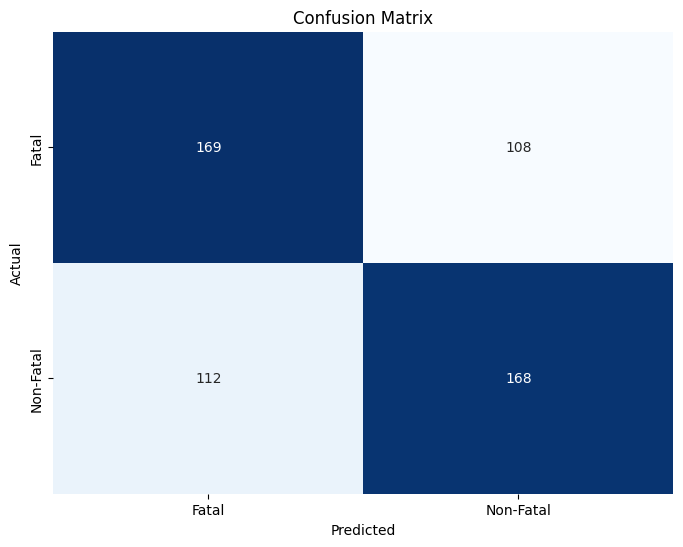

In [238]:
# Calculate confusion matrix
conf_matrix = confusion_matrix(y_test, y_pred)

# Plot confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues", cbar=False, 
            xticklabels=['Fatal', 'Non-Fatal'], yticklabels=['Fatal', 'Non-Fatal'])
plt.title('Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

In [239]:
dt = DecisionTreeClassifier()
dt.fit(X_train, y_train)

DecisionTreeClassifier()

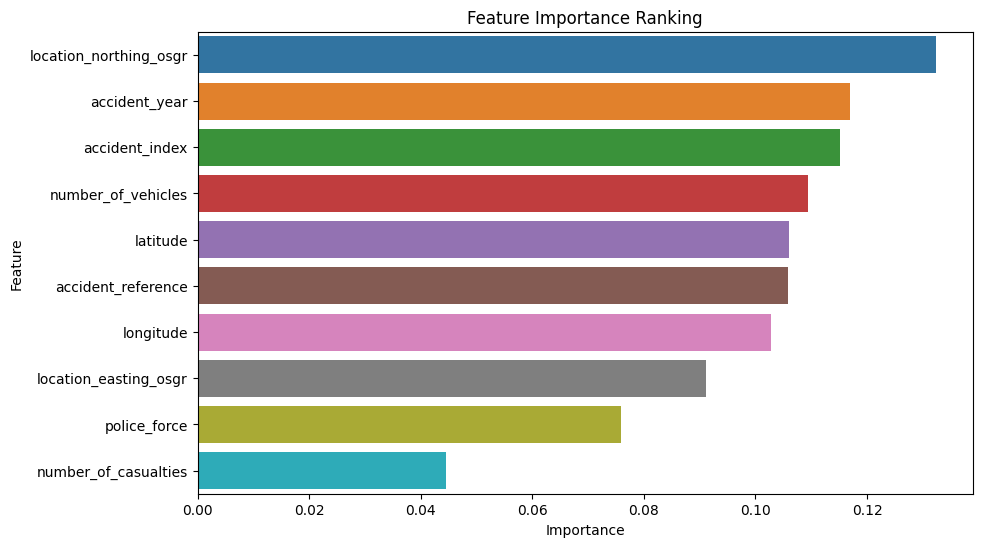

In [240]:

# Assuming the decision tree model is named 'dt'
feature_importances = dt.feature_importances_
indices = feature_importances.argsort()[::-1]

# Plot feature importance
plt.figure(figsize=(10, 6))
sns.barplot(x=feature_importances[indices][:10], y=[X.columns[i] for i in indices[:10]])
plt.title('Feature Importance Ranking')
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.show()


## Comparison of models' performances

### For accuracy

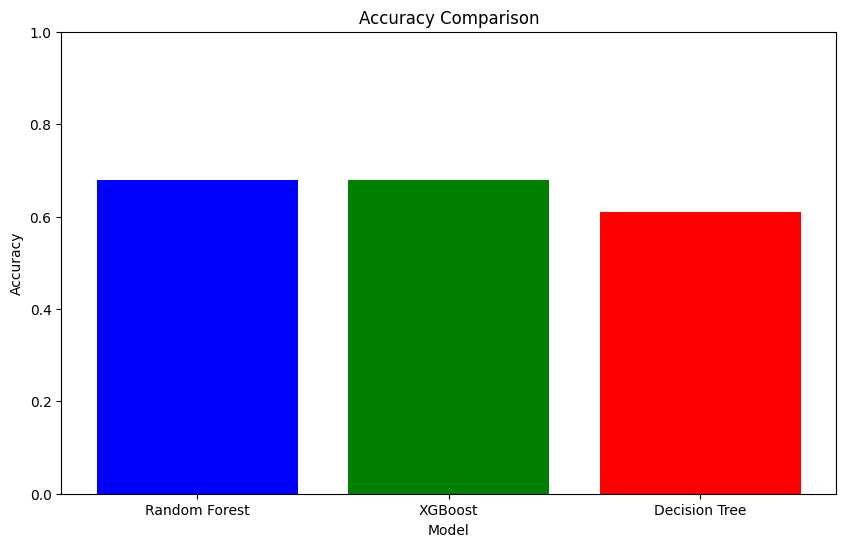

In [246]:


# Accuracy values for each model
accuracy_scores = {
    'Random Forest': 0.68,
    'XGBoost': 0.68,
    'Decision Tree': 0.61
}

# Plotting
plt.figure(figsize=(10, 6))
plt.bar(accuracy_scores.keys(), accuracy_scores.values(), color=['blue', 'green', 'red'])
plt.title('Accuracy Comparison')
plt.xlabel('Model')
plt.ylabel('Accuracy')
plt.ylim(0, 1)  # Setting y-axis limit
plt.show()


### For precision

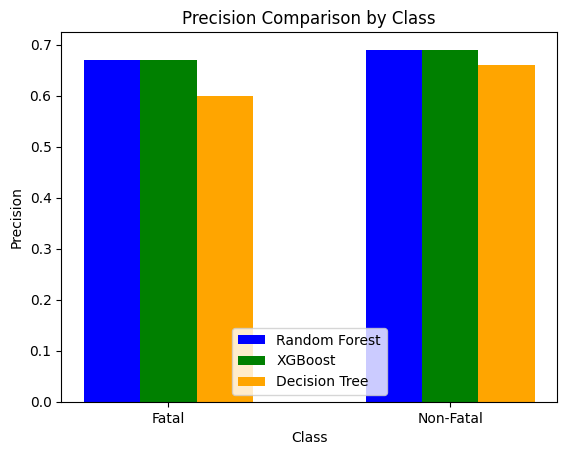

In [247]:

# Precision values for each model
precision_rf = [0.67, 0.69]  # Precision values for Random Forest
precision_xgb = [0.67, 0.69]  # Precision values for XGBoost
precision_dt = [0.60, 0.661]   # Precision values for Decision Tree

# Data
classes = ['Fatal', 'Non-Fatal']
bar_width = 0.2
index = np.arange(len(classes))

# Plotting
plt.bar(index - bar_width, precision_rf, bar_width, label='Random Forest', color='blue')
plt.bar(index, precision_xgb, bar_width, label='XGBoost', color='green')
plt.bar(index + bar_width, precision_dt, bar_width, label='Decision Tree', color='orange')

plt.xlabel('Class')
plt.ylabel('Precision')
plt.title('Precision Comparison by Class')
plt.xticks(index, classes)
plt.legend()
plt.show()


### For recall

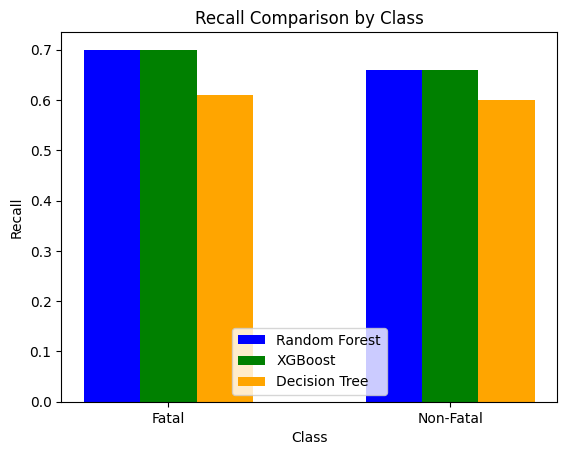

In [248]:
# Recall values for each model
recall_rf = [0.70, 0.66]  # Recall values for Random Forest
recall_xgb = [0.70, 0.66]  # Recall values for XGBoost
recall_dt = [0.61, 0.60]   # Recall values for Decision Tree

# Data
classes = ['Fatal', 'Non-Fatal']
bar_width = 0.2
index = np.arange(len(classes))

# Plotting
plt.bar(index - bar_width, recall_rf, bar_width, label='Random Forest', color='blue')
plt.bar(index, recall_xgb, bar_width, label='XGBoost', color='green')
plt.bar(index + bar_width, recall_dt, bar_width, label='Decision Tree', color='orange')

plt.xlabel('Class')
plt.ylabel('Recall')
plt.title('Recall Comparison by Class')
plt.xticks(index, classes)
plt.legend()
plt.show()

### For F1-Score

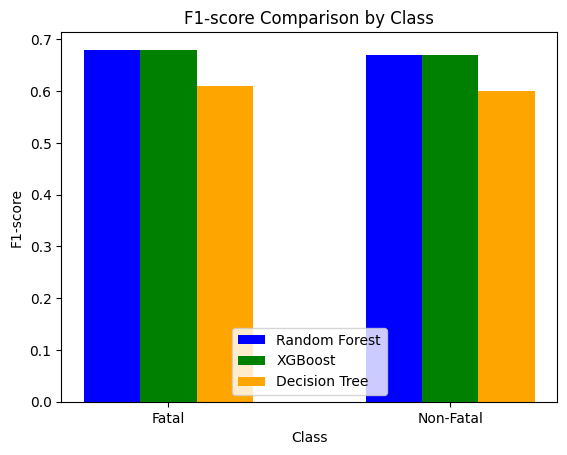

In [249]:
# F1-score values for each model
f1_score_rf = [0.68, 0.67]  # F1-score values for Random Forest
f1_score_xgb = [0.68, 0.67]  # F1-score values for XGBoost
f1_score_dt = [0.61, 0.60]   # F1-score values for Decision Tree

# Data
classes = ['Fatal', 'Non-Fatal']
bar_width = 0.2
index = np.arange(len(classes))

# Plotting
plt.bar(index - bar_width, f1_score_rf, bar_width, label='Random Forest', color='blue')
plt.bar(index, f1_score_xgb, bar_width, label='XGBoost', color='green')
plt.bar(index + bar_width, f1_score_dt, bar_width, label='Decision Tree', color='orange')

plt.xlabel('Class')
plt.ylabel('F1-score')
plt.title('F1-score Comparison by Class')
plt.xticks(index, classes)
plt.legend()
plt.show()